In [1]:
import os
import sys
from pathlib import Path

# Limpiar posibles rutas incorrectas heredadas
os.environ.pop("PROJ_LIB", None)
os.environ.pop("PROJ_DATA", None)

# Buscar proj.db dentro del entorno virtual activo
entorno = Path(sys.prefix)

resultados = list(entorno.rglob("proj.db"))

print("Entorno activo:")
print(entorno)

print("\nArchivos proj.db encontrados:")
for ruta in resultados:
    print(ruta)

Entorno activo:
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv

Archivos proj.db encontrados:
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~~proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~yproj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~=proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~.proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~-proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\~%proj\proj_dir\share\proj\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\rasterio\proj_data\proj.db
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\pyproj\proj_dir\share\proj\proj.db
c:\Analisis_Geo

In [2]:
import os
import sys
from pathlib import Path

entorno = Path(sys.prefix)

rutas_rasterio = [
    ruta.parent
    for ruta in entorno.rglob("proj.db")
    if "rasterio" in str(ruta).lower()
]

if not rutas_rasterio:
    raise FileNotFoundError(
        "No se encontró proj.db dentro de la instalación de rasterio."
    )

ruta_proj = rutas_rasterio[0]

os.environ["PROJ_DATA"] = str(ruta_proj)
os.environ["PROJ_LIB"] = str(ruta_proj)

print("PROJ configurado en:")
print(ruta_proj)
print("proj.db existe:", (ruta_proj / "proj.db").exists())

PROJ configurado en:
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\rasterio\proj_data
proj.db existe: True


In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RBF
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, roc_auc_score,
    precision_recall_curve, average_precision_score,
    accuracy_score, precision_score, recall_score,
    f1_score, log_loss, brier_score_loss
)
from sklearn.calibration import calibration_curve

ruta_shape = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Eventos_y_ausencias_V1.shp"
ruta_salida = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP.gpkg"

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))

var = [
    "log_A",
    "Pend",
    "Elev",
    "LAI",
    "TPI",
    "Curv_Mean",
    "TRI_Mean"
]

df = gdf[["Inund"] + var].replace(
    [-9999, np.inf, -np.inf], np.nan
).dropna()

X = df[var]
y = df["Inund"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    stratify=y,
    random_state=42
)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)
X_all_sc = scaler.transform(X)

kernel = ConstantKernel(
    1.0,
    constant_value_bounds="fixed"
) * RBF(
    length_scale=np.ones(len(var)),
    length_scale_bounds="fixed"
)

modelo_gp = GaussianProcessClassifier(
    kernel=kernel,
    optimizer=None,
    max_iter_predict=50,
    warm_start=True,
    random_state=42
)

modelo_gp.fit(X_train_sc, y_train)

prob_train = modelo_gp.predict_proba(X_train_sc)[:, 1]
prob_test = modelo_gp.predict_proba(X_test_sc)[:, 1]

pred_train = (prob_train >= 0.5).astype(int)
pred_test = (prob_test >= 0.5).astype(int)

cm = confusion_matrix(y_test, pred_test)
tn, fp, fn, tp = cm.ravel()

metricas = pd.DataFrame({
    "Métrica": [
        "AUC",
        "Average precision",
        "Accuracy",
        "Precisión",
        "Sensibilidad",
        "Especificidad",
        "F1-score",
        "R²",
        "MAE",
        "RMSE",
        "Log-loss",
        "Brier score"
    ],

    "Entrenamiento": [
        roc_auc_score(y_train, prob_train),
        average_precision_score(y_train, prob_train),
        accuracy_score(y_train, pred_train),
        precision_score(y_train, pred_train),
        recall_score(y_train, pred_train),
        confusion_matrix(y_train, pred_train)[0,0] /
        confusion_matrix(y_train, pred_train)[0].sum(),
        f1_score(y_train, pred_train),

        r2_score(y_train, prob_train),
        mean_absolute_error(y_train, prob_train),
        np.sqrt(mean_squared_error(y_train, prob_train)),

        log_loss(y_train, prob_train),
        brier_score_loss(y_train, prob_train)
    ],

    "Validación": [
        roc_auc_score(y_test, prob_test),
        average_precision_score(y_test, prob_test),
        accuracy_score(y_test, pred_test),
        precision_score(y_test, pred_test),
        recall_score(y_test, pred_test),
        tn / (tn + fp),
        f1_score(y_test, pred_test),

        r2_score(y_test, prob_test),
        mean_absolute_error(y_test, prob_test),
        np.sqrt(mean_squared_error(y_test, prob_test)),

        log_loss(y_test, prob_test),
        brier_score_loss(y_test, prob_test)
    ]
})

print("\nKernel utilizado:")
print(modelo_gp.kernel_)

print("\nDesempeño del modelo:")
print(metricas.round(4).to_string(index=False))

print("\nReporte de clasificación:")
print(classification_report(
    y_test,
    pred_test,
    target_names=["No inundación", "Inundación"],
    digits=4
))

# ==============================
# Matrices de confusión
# Entrenamiento y Validación
# ==============================

cm_train = confusion_matrix(
    y_train,
    pred_train
)

cm_test = confusion_matrix(
    y_test,
    pred_test
)


fig, axes = plt.subplots(
    1,
    2,
    figsize=(10,4)
)

sns.heatmap(
    cm_train,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    ax=axes[0],
    xticklabels=["No inundación", "Inundación"],
    yticklabels=["No inundación", "Inundación"]
)

axes[0].set_title("Matriz de confusión - Calibración")
axes[0].set_xlabel("Predicción")
axes[0].set_ylabel("Observado")


sns.heatmap(
    cm_test,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    ax=axes[1],
    xticklabels=["No inundación", "Inundación"],
    yticklabels=["No inundación", "Inundación"]
)

axes[1].set_title("Matriz de confusión - Validación")
axes[1].set_xlabel("Predicción")
axes[1].set_ylabel("Observado")


plt.suptitle(
    "Comparación matrices de confusión"
)

plt.tight_layout()
plt.show()




fpr, tpr, _ = roc_curve(y_test, prob_test)
precision, recall, _ = precision_recall_curve(y_test, prob_test)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc_score(y_test, prob_test):.3f}"
)
axes[0].plot([0, 1], [0, 1], "--")
axes[0].set_xlabel("Tasa de falsos positivos")
axes[0].set_ylabel("Tasa de verdaderos positivos")
axes[0].set_title("Curva ROC")
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(
    recall,
    precision,
    label=f"AP = {average_precision_score(y_test, prob_test):.3f}"
)
axes[1].axhline(y_test.mean(), linestyle="--", label="Modelo aleatorio")
axes[1].set_xlabel("Sensibilidad")
axes[1].set_ylabel("Precisión")
axes[1].set_title("Curva precisión–recall")
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

prob_real, prob_predicha = calibration_curve(
    y_test,
    prob_test,
    n_bins=10,
    strategy="quantile"
)

plt.figure(figsize=(6, 5))
plt.plot(
    prob_predicha,
    prob_real,
    marker="o",
    label="Proceso gaussiano"
)
plt.plot([0, 1], [0, 1], "--", label="Calibración perfecta")
plt.xlabel("Probabilidad media predicha")
plt.ylabel("Proporción observada de inundaciones")
plt.title("Curva de calibración")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

n_kernel = min(4000, len(X_train_sc))
rng = np.random.default_rng(42)
idx_kernel = rng.choice(
    len(X_train_sc),
    size=n_kernel,
    replace=False
)

X_kernel = X_train_sc[idx_kernel]
K = modelo_gp.kernel_(X_kernel)

plt.figure(figsize=(8, 7))
plt.imshow(K, aspect="auto", cmap="viridis")
plt.colorbar(label="Covarianza")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.title(f"Matriz kernel de {n_kernel} observaciones")
plt.tight_layout()
plt.show()

orden = np.argsort(y_train.iloc[idx_kernel].to_numpy())
K_ordenada = K[orden][:, orden]

plt.figure(figsize=(8, 7))
plt.imshow(K_ordenada, cmap="viridis", aspect="auto")
plt.colorbar(label="Covarianza")
plt.title("Matriz kernel ordenada por clase")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.tight_layout()
plt.show()


pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(
    X_train_pca[:, 0].min(),
    X_train_pca[:, 0].max(),
    100
)
pc2 = np.linspace(
    X_train_pca[:, 1].min(),
    X_train_pca[:, 1].max(),
    100
)

xx, yy = np.meshgrid(pc1, pc2)

malla_pca = np.column_stack([
    xx.ravel(),
    yy.ravel()
])

malla_original = pca.inverse_transform(malla_pca)
prob_malla = modelo_gp.predict_proba(malla_original)[:, 1]
prob_malla = prob_malla.reshape(xx.shape)

plt.figure(figsize=(9, 7))

contorno = plt.contourf(
    xx,
    yy,
    prob_malla,
    levels=np.linspace(0, 1, 21),
    cmap="RdYlBu_r"
)

plt.colorbar(contorno, label="Probabilidad de inundación")

plt.scatter(
    X_test_pca[y_test.to_numpy() == 0, 0],
    X_test_pca[y_test.to_numpy() == 0, 1],
    c="blue",
    edgecolor="black",
    s=35,
    alpha=0.7,
    label="No inundación"
)

plt.scatter(
    X_test_pca[y_test.to_numpy() == 1, 0],
    X_test_pca[y_test.to_numpy() == 1, 1],
    c="red",
    edgecolor="black",
    s=35,
    alpha=0.7,
    label="Inundación"
)

plt.contour(
    xx,
    yy,
    prob_malla,
    levels=[0.5],
    colors="black",
    linewidths=2
)

plt.xlabel(
    f"Componente principal 1 "
    f"({pca.explained_variance_ratio_[0] * 100:.1f} %)"
)
plt.ylabel(
    f"Componente principal 2 "
    f"({pca.explained_variance_ratio_[1] * 100:.1f} %)"
)
plt.title("Visualización multivariada del proceso gaussiano")
plt.legend()
plt.tight_layout()
plt.show()

cargas = pd.DataFrame(
    pca.components_.T,
    index=var,
    columns=["PC1", "PC2"]
)

print("\nContribución de las variables a los componentes:")
print(cargas.round(3))

prob_all = modelo_gp.predict_proba(X_all_sc)[:, 1]

gdf["Prob_GP"] = np.nan
gdf["Clase_GP"] = np.nan
gdf["Resid_GP"] = np.nan

gdf.loc[df.index, "Prob_GP"] = prob_all
gdf.loc[df.index, "Clase_GP"] = (prob_all >= 0.5).astype(int)
gdf.loc[df.index, "Resid_GP"] = y.to_numpy() - prob_all

gdf["Suscept_GP"] = pd.cut(
    gdf["Prob_GP"],
    bins=[0, 0.2, 0.4, 0.6, 0.8, 1],
    labels=["Muy baja", "Baja", "Media", "Alta", "Muy alta"],
    include_lowest=True
)

gdf.to_file(
    ruta_salida,
    layer="Resultados_GP",
    driver="GPKG"
)


Sin espacialidad

Con espacialidad

RESULTADOS COMPARATIVOS
          Modelo    Conjunto    AUC     AP  Accuracy  Precision  Sensibilidad  Especificidad     F1     R2    MAE   RMSE  Brier  LogLoss
Sin espacialidad Calibración 0.9918 0.9928    0.9650     0.9662        0.9640         0.9659 0.9651 0.8154 0.1658 0.2148 0.0461   0.2015
Sin espacialidad  Validación 0.9536 0.9572    0.8893     0.8857        0.8950         0.8836 0.8903 0.6442 0.2231 0.2983 0.0890   0.3075
Con espacialidad Calibración 0.9987 0.9986    0.9836     0.9788        0.9888         0.9784 0.9838 0.8493 0.1651 0.1941 0.0377   0.1898
Con espacialidad  Validación 0.9602 0.9600    0.8946     0.8772        0.9186         0.8704 0.8974 0.6362 0.2411 0.3016 0.0910   0.3202


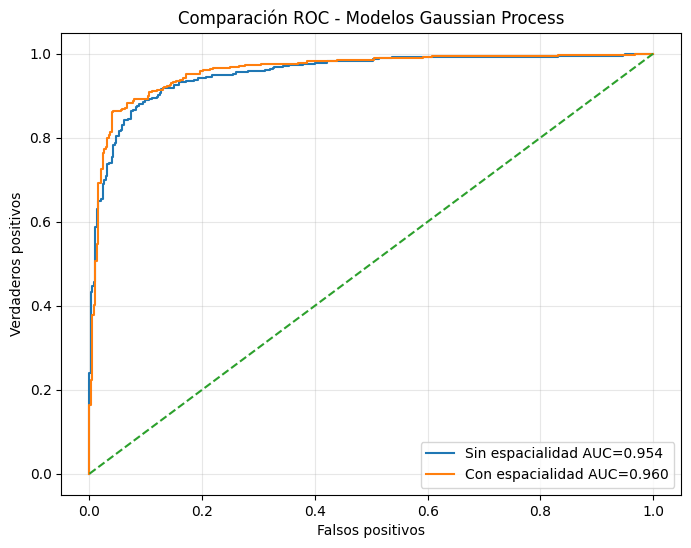


Brechas calibración-validación
                         AUC                     AP                     F1  \
Conjunto         Calibración Validación Calibración Validación Calibración   
Modelo                                                                       
Con espacialidad      0.9987     0.9602      0.9986     0.9600      0.9838   
Sin espacialidad      0.9918     0.9536      0.9928     0.9572      0.9651   

                                  Brier                LogLoss             
Conjunto         Validación Calibración Validación Calibración Validación  
Modelo                                                                     
Con espacialidad     0.8974      0.0377      0.091      0.1898     0.3202  
Sin espacialidad     0.8903      0.0461      0.089      0.2015     0.3075  


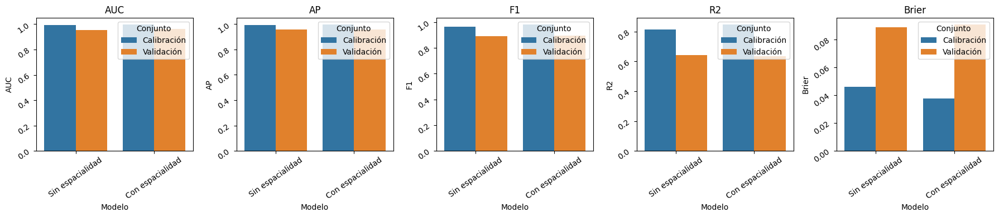

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    brier_score_loss,
    log_loss,
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RBF


# ======================================================
# FUNCIÓN MÉTRICAS
# ======================================================

def calcular_metricas(y_real, prob):

    pred = (prob >= 0.5).astype(int)

    tn, fp, fn, tp = confusion_matrix(
        y_real,
        pred
    ).ravel()

    return {

        "AUC":
        roc_auc_score(y_real, prob),

        "AP":
        average_precision_score(y_real, prob),

        "Accuracy":
        accuracy_score(y_real,pred),

        "Precision":
        precision_score(
            y_real,
            pred
        ),

        "Sensibilidad":
        recall_score(
            y_real,
            pred
        ),

        "Especificidad":
        tn/(tn+fp),

        "F1":
        f1_score(
            y_real,
            pred
        ),

        "R2":
        r2_score(
            y_real,
            prob
        ),

        "MAE":
        mean_absolute_error(
            y_real,
            prob
        ),

        "RMSE":
        np.sqrt(
            mean_squared_error(
                y_real,
                prob
            )
        ),

        "Brier":
        brier_score_loss(
            y_real,
            prob
        ),

        "LogLoss":
        log_loss(
            y_real,
            prob
        )
    }


# ======================================================
# MODELOS A COMPARAR
# ======================================================


modelos = {

    "Sin espacialidad":
    [
        "log_A",
        "Pend",
        "Elev",
        "LAI",
        "TPI",
        "Curv_Mean",
        "TRI_Mean"
    ],


    "Con espacialidad":
    [
        "log_A",
        "Pend",
        "Elev",
        "LAI",
        "TPI",
        "Curv_Mean",
        "TRI_Mean",
        "Este",
        "Norte"
    ]

}



resultados=[]



# ======================================================
# AJUSTE DE LOS DOS MODELOS
# ======================================================


for nombre, variables in modelos.items():


    print("\n==============================")
    print(nombre)
    print("==============================")


    X = df[variables]
    y = df["Inund"].astype(int)


    X_train, X_test, y_train, y_test = train_test_split(

        X,
        y,

        test_size=0.30,

        stratify=y,

        random_state=42
    )


    scaler = StandardScaler()


    X_train_sc = scaler.fit_transform(
        X_train
    )

    X_test_sc = scaler.transform(
        X_test
    )


    # kernel RBF optimizado
    kernel = ConstantKernel(
        5.69**2,
        constant_value_bounds="fixed"

    )*RBF(

        length_scale=np.ones(
            len(variables)
        ),

        length_scale_bounds="fixed"
    )



    modelo = GaussianProcessClassifier(

        kernel=kernel,

        optimizer=None,

        max_iter_predict=100,

        random_state=42
    )


    modelo.fit(
        X_train_sc,
        y_train
    )


    prob_train = modelo.predict_proba(
        X_train_sc
    )[:,1]


    prob_test = modelo.predict_proba(
        X_test_sc
    )[:,1]


    met_train = calcular_metricas(
        y_train,
        prob_train
    )

    met_test = calcular_metricas(
        y_test,
        prob_test
    )


    fila_cal={

        "Modelo":nombre,
        "Conjunto":"Calibración"

    }

    fila_val={

        "Modelo":nombre,
        "Conjunto":"Validación"

    }


    for m in met_train:

        fila_cal[m]=met_train[m]
        fila_val[m]=met_test[m]


    resultados.append(fila_cal)
    resultados.append(fila_val)



resultados=pd.DataFrame(resultados)



# ======================================================
# TABLA FINAL
# ======================================================


print("\nRESULTADOS COMPARATIVOS")

print(
    resultados.round(4)
    .to_string(index=False)
)



# ======================================================
# CURVAS ROC
# ======================================================

plt.figure(figsize=(8,6))


for nombre, variables in modelos.items():

    X=df[variables]
    y=df["Inund"].astype(int)


    X_train, X_test, y_train, y_test=train_test_split(
        X,
        y,
        test_size=0.30,
        stratify=y,
        random_state=42
    )


    scaler=StandardScaler()

    X_train=scaler.fit_transform(X_train)
    X_test=scaler.transform(X_test)


    kernel=ConstantKernel(
        5.69**2,
        constant_value_bounds="fixed"
    )*RBF(
        length_scale=np.ones(
            len(variables)
        ),
        length_scale_bounds="fixed"
    )


    gp=GaussianProcessClassifier(
        kernel=kernel,
        optimizer=None,
        random_state=42
    )


    gp.fit(
        X_train,
        y_train
    )


    prob=gp.predict_proba(
        X_test
    )[:,1]


    fpr,tpr,_=roc_curve(
        y_test,
        prob
    )


    plt.plot(
        fpr,
        tpr,
        label=f"{nombre} AUC={roc_auc_score(y_test,prob):.3f}"
    )


plt.plot(
    [0,1],
    [0,1],
    "--"
)


plt.xlabel(
    "Falsos positivos"
)

plt.ylabel(
    "Verdaderos positivos"
)


plt.title(
    "Comparación ROC - Modelos Gaussian Process"
)


plt.legend()
plt.grid(alpha=0.3)

plt.show()



# ======================================================
# BRECHA DE GENERALIZACIÓN
# ======================================================


tabla=resultados.pivot(
    index="Modelo",
    columns="Conjunto",
    values=[
        "AUC",
        "AP",
        "F1",
        "Brier",
        "LogLoss"
    ]
)


print("\nBrechas calibración-validación")


print(
    tabla.round(4)
)


# ======================================================
# COMPARACIÓN VISUAL
# ======================================================


metricas=[
    "AUC",
    "AP",
    "F1",
    "R2",
    "Brier"
]


fig,axes=plt.subplots(
    1,
    len(metricas),
    figsize=(18,4)
)


for ax,m in zip(
    axes,
    metricas
):

    sns.barplot(

        data=resultados,

        x="Modelo",

        y=m,

        hue="Conjunto",

        ax=ax
    )

    ax.set_title(m)

    ax.tick_params(
        rotation=35
    )


plt.tight_layout()
plt.show()


Kernel utilizado:
1**2 * RBF(length_scale=[1, 1, 1, 1, 1, 1, 1])

Desempeño del modelo:
          Métrica  Entrenamiento  Validación
              AUC         0.9559      0.9437
Average precision         0.9555      0.9456
         Accuracy         0.8966      0.8827
        Precisión         0.8949      0.8883
     Sensibilidad         0.8999      0.8766
    Especificidad         0.8933      0.8889
         F1-score         0.8974      0.8824
         Log-loss         0.3118      0.3367
      Brier score         0.0881      0.0983

Reporte de clasificación:
               precision    recall  f1-score   support

No inundación     0.8773    0.8889    0.8830       378
   Inundación     0.8883    0.8766    0.8824       381

     accuracy                         0.8827       759
    macro avg     0.8828    0.8828    0.8827       759
 weighted avg     0.8828    0.8827    0.8827       759



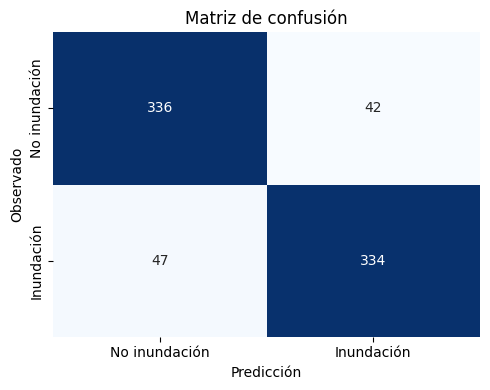

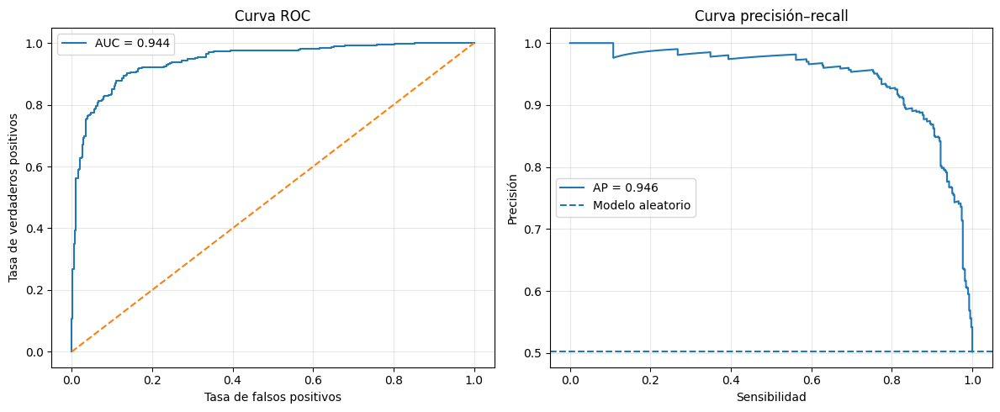

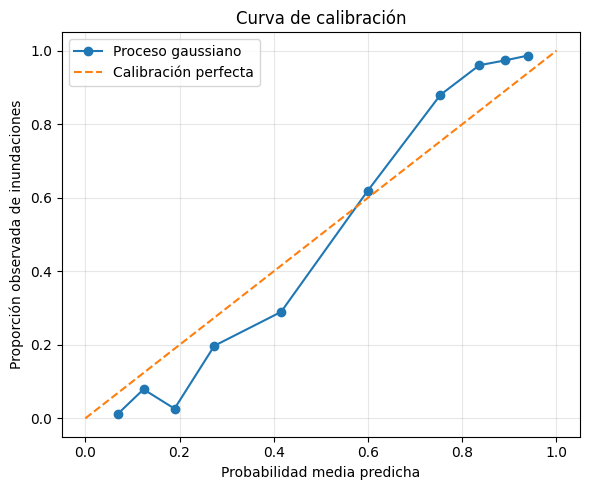

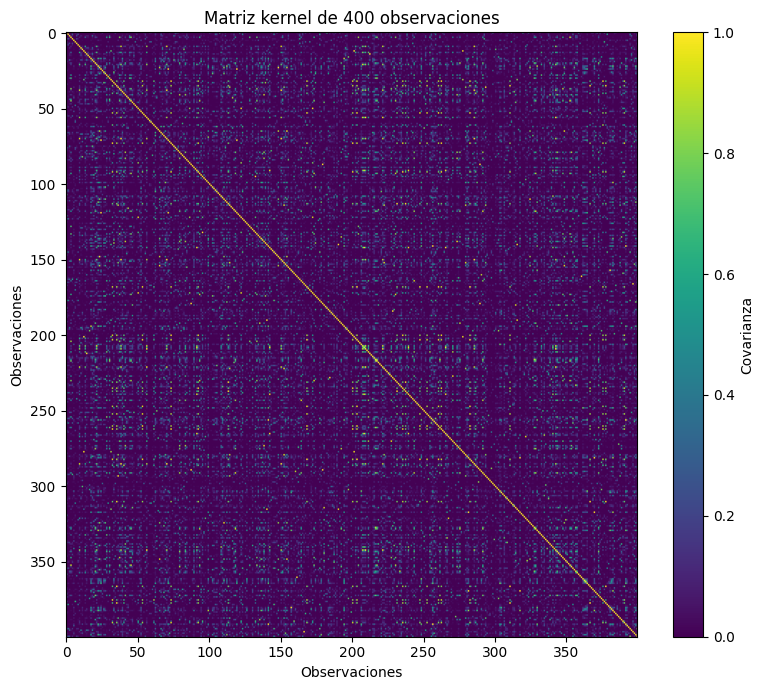

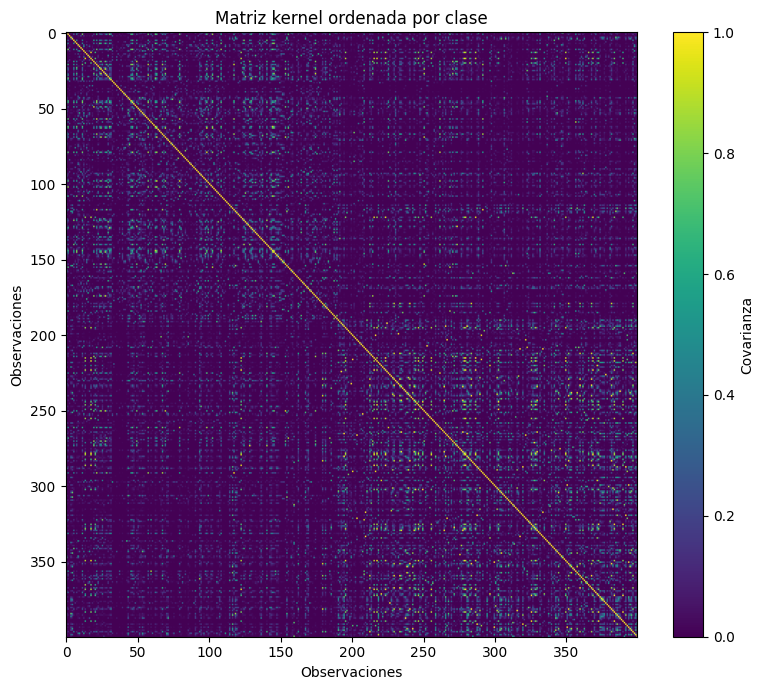

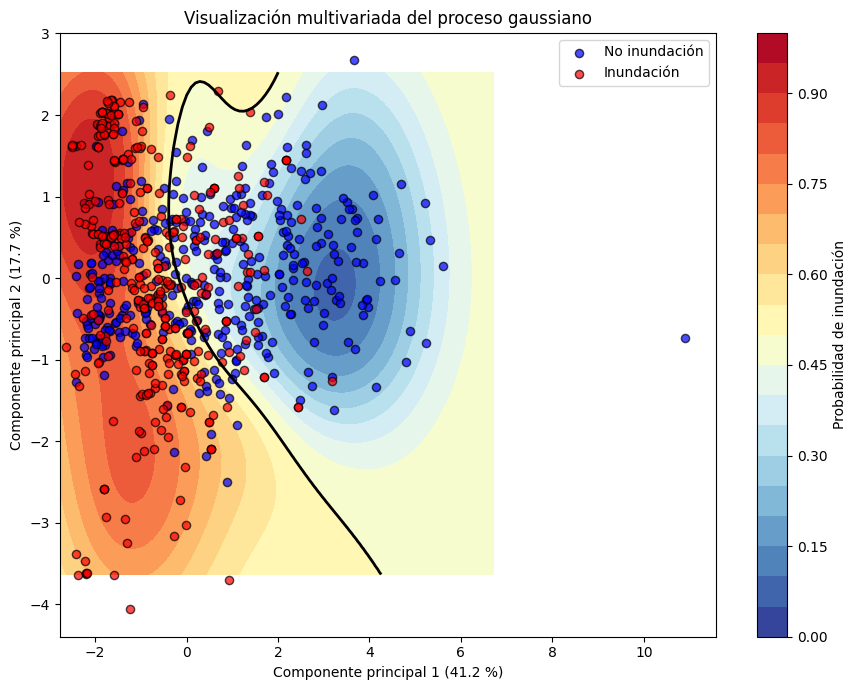


Contribución de las variables a los componentes:
             PC1    PC2
log_A     -0.171  0.704
Pend       0.400  0.204
Elev       0.266 -0.466
LAI        0.209  0.484
TPI       -0.430 -0.045
Curv_Mean -0.483 -0.099
TRI_Mean   0.527 -0.011

Kernel antes de optimizar:
1**2 * RBF(length_scale=[1, 1, 1, 1, 1, 1, 1])

Hiperparámetros iniciales:
{'k1': 1**2, 'k2': RBF(length_scale=[1, 1, 1, 1, 1, 1, 1]), 'k1__constant_value': 1.0, 'k1__constant_value_bounds': (0.01, 100.0), 'k2__length_scale': array([1., 1., 1., 1., 1., 1., 1.]), 'k2__length_scale_bounds': (0.01, 100.0)}

Kernel después de optimizar:
5.69**2 * RBF(length_scale=[1.95, 3.68, 1.57, 4.25, 3.11, 2.49, 2.73])

Theta optimizado, escala logarítmica:
[3.47703574 0.66606905 1.30325222 0.45076161 1.44691977 1.13493269
 0.91299263 1.00503915]

Log-verosimilitud marginal optimizada:
-575.0008670289897


In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RBF
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, roc_auc_score,
    precision_recall_curve, average_precision_score,
    accuracy_score, precision_score, recall_score,
    f1_score, log_loss, brier_score_loss
)
from sklearn.calibration import calibration_curve

ruta_shape = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Eventos_y_ausencias_V1.shp"
ruta_salida = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP.gpkg"

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))

var = [
    "log_A",
    "Pend",
    "Elev",
    "LAI",
    "TPI",
    "Curv_Mean",
    "TRI_Mean"
]

df = gdf[["Inund"] + var].replace(
    [-9999, np.inf, -np.inf], np.nan
).dropna()

X = df[var]
y = df["Inund"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    stratify=y,
    random_state=42
)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)
X_all_sc = scaler.transform(X)

kernel = ConstantKernel(
    1.0,
    constant_value_bounds="fixed"
) * RBF(
    length_scale=np.ones(len(var)),
    length_scale_bounds="fixed"
)

modelo_gp = GaussianProcessClassifier(
    kernel=kernel,
    optimizer=None,
    max_iter_predict=50,
    warm_start=True,
    random_state=42
)

modelo_gp.fit(X_train_sc, y_train)

prob_train = modelo_gp.predict_proba(X_train_sc)[:, 1]
prob_test = modelo_gp.predict_proba(X_test_sc)[:, 1]

pred_train = (prob_train >= 0.5).astype(int)
pred_test = (prob_test >= 0.5).astype(int)

cm = confusion_matrix(y_test, pred_test)
tn, fp, fn, tp = cm.ravel()

metricas = pd.DataFrame({
    "Métrica": [
        "AUC",
        "Average precision",
        "Accuracy",
        "Precisión",
        "Sensibilidad",
        "Especificidad",
        "F1-score",
        "Log-loss",
        "Brier score"
    ],
    "Entrenamiento": [
        roc_auc_score(y_train, prob_train),
        average_precision_score(y_train, prob_train),
        accuracy_score(y_train, pred_train),
        precision_score(y_train, pred_train),
        recall_score(y_train, pred_train),
        confusion_matrix(y_train, pred_train)[0, 0] /
        confusion_matrix(y_train, pred_train)[0].sum(),
        f1_score(y_train, pred_train),
        log_loss(y_train, prob_train),
        brier_score_loss(y_train, prob_train)
    ],
    "Validación": [
        roc_auc_score(y_test, prob_test),
        average_precision_score(y_test, prob_test),
        accuracy_score(y_test, pred_test),
        precision_score(y_test, pred_test),
        recall_score(y_test, pred_test),
        tn / (tn + fp),
        f1_score(y_test, pred_test),
        log_loss(y_test, prob_test),
        brier_score_loss(y_test, prob_test)
    ]
})

print("\nKernel utilizado:")
print(modelo_gp.kernel_)

print("\nDesempeño del modelo:")
print(metricas.round(4).to_string(index=False))

print("\nReporte de clasificación:")
print(classification_report(
    y_test,
    pred_test,
    target_names=["No inundación", "Inundación"],
    digits=4
))

plt.figure(figsize=(5, 4))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=False,
    xticklabels=["No inundación", "Inundación"],
    yticklabels=["No inundación", "Inundación"]
)
plt.xlabel("Predicción")
plt.ylabel("Observado")
plt.title("Matriz de confusión")
plt.tight_layout()
plt.show()

fpr, tpr, _ = roc_curve(y_test, prob_test)
precision, recall, _ = precision_recall_curve(y_test, prob_test)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].plot(
    fpr,
    tpr,
    label=f"AUC = {roc_auc_score(y_test, prob_test):.3f}"
)
axes[0].plot([0, 1], [0, 1], "--")
axes[0].set_xlabel("Tasa de falsos positivos")
axes[0].set_ylabel("Tasa de verdaderos positivos")
axes[0].set_title("Curva ROC")
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].plot(
    recall,
    precision,
    label=f"AP = {average_precision_score(y_test, prob_test):.3f}"
)
axes[1].axhline(y_test.mean(), linestyle="--", label="Modelo aleatorio")
axes[1].set_xlabel("Sensibilidad")
axes[1].set_ylabel("Precisión")
axes[1].set_title("Curva precisión–recall")
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

prob_real, prob_predicha = calibration_curve(
    y_test,
    prob_test,
    n_bins=10,
    strategy="quantile"
)

plt.figure(figsize=(6, 5))
plt.plot(
    prob_predicha,
    prob_real,
    marker="o",
    label="Proceso gaussiano"
)
plt.plot([0, 1], [0, 1], "--", label="Calibración perfecta")
plt.xlabel("Probabilidad media predicha")
plt.ylabel("Proporción observada de inundaciones")
plt.title("Curva de calibración")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

n_kernel = min(400, len(X_train_sc))
rng = np.random.default_rng(42)
idx_kernel = rng.choice(
    len(X_train_sc),
    size=n_kernel,
    replace=False
)

X_kernel = X_train_sc[idx_kernel]
K = modelo_gp.kernel_(X_kernel)

plt.figure(figsize=(8, 7))
plt.imshow(K, aspect="auto", cmap="viridis")
plt.colorbar(label="Covarianza")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.title(f"Matriz kernel de {n_kernel} observaciones")
plt.tight_layout()
plt.show()

orden = np.argsort(y_train.iloc[idx_kernel].to_numpy())
K_ordenada = K[orden][:, orden]

plt.figure(figsize=(8, 7))
plt.imshow(K_ordenada, cmap="viridis", aspect="auto")
plt.colorbar(label="Covarianza")
plt.title("Matriz kernel ordenada por clase")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.tight_layout()
plt.show()


pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(
    X_train_pca[:, 0].min(),
    X_train_pca[:, 0].max(),
    100
)
pc2 = np.linspace(
    X_train_pca[:, 1].min(),
    X_train_pca[:, 1].max(),
    100
)

xx, yy = np.meshgrid(pc1, pc2)

malla_pca = np.column_stack([
    xx.ravel(),
    yy.ravel()
])

malla_original = pca.inverse_transform(malla_pca)
prob_malla = modelo_gp.predict_proba(malla_original)[:, 1]
prob_malla = prob_malla.reshape(xx.shape)

plt.figure(figsize=(9, 7))

contorno = plt.contourf(
    xx,
    yy,
    prob_malla,
    levels=np.linspace(0, 1, 21),
    cmap="RdYlBu_r"
)

plt.colorbar(contorno, label="Probabilidad de inundación")

plt.scatter(
    X_test_pca[y_test.to_numpy() == 0, 0],
    X_test_pca[y_test.to_numpy() == 0, 1],
    c="blue",
    edgecolor="black",
    s=35,
    alpha=0.7,
    label="No inundación"
)

plt.scatter(
    X_test_pca[y_test.to_numpy() == 1, 0],
    X_test_pca[y_test.to_numpy() == 1, 1],
    c="red",
    edgecolor="black",
    s=35,
    alpha=0.7,
    label="Inundación"
)

plt.contour(
    xx,
    yy,
    prob_malla,
    levels=[0.5],
    colors="black",
    linewidths=2
)

plt.xlabel(
    f"Componente principal 1 "
    f"({pca.explained_variance_ratio_[0] * 100:.1f} %)"
)
plt.ylabel(
    f"Componente principal 2 "
    f"({pca.explained_variance_ratio_[1] * 100:.1f} %)"
)
plt.title("Visualización multivariada del proceso gaussiano")
plt.legend()
plt.tight_layout()
plt.show()

cargas = pd.DataFrame(
    pca.components_.T,
    index=var,
    columns=["PC1", "PC2"]
)

print("\nContribución de las variables a los componentes:")
print(cargas.round(3))

prob_all = modelo_gp.predict_proba(X_all_sc)[:, 1]

gdf["Prob_GP"] = np.nan
gdf["Clase_GP"] = np.nan
gdf["Resid_GP"] = np.nan

gdf.loc[df.index, "Prob_GP"] = prob_all
gdf.loc[df.index, "Clase_GP"] = (prob_all >= 0.5).astype(int)
gdf.loc[df.index, "Resid_GP"] = y.to_numpy() - prob_all

gdf["Suscept_GP"] = pd.cut(
    gdf["Prob_GP"],
    bins=[0, 0.2, 0.4, 0.6, 0.8, 1],
    labels=["Muy baja", "Baja", "Media", "Alta", "Muy alta"],
    include_lowest=True
)

gdf.to_file(
    ruta_salida,
    layer="Resultados_GP",
    driver="GPKG"
)

from sklearn.gaussian_process.kernels import ConstantKernel, RBF
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.metrics import (
    roc_auc_score, average_precision_score,
    accuracy_score, precision_score, recall_score,
    f1_score, log_loss, brier_score_loss,
    confusion_matrix
)

n_var = len(var)

kernel_inicial = ConstantKernel(
    constant_value=1.0,
    constant_value_bounds=(1e-2, 1e2)
) * RBF(
    length_scale=np.ones(n_var),
    length_scale_bounds=(1e-2, 1e2)
)

print("\nKernel antes de optimizar:")
print(kernel_inicial)

print("\nHiperparámetros iniciales:")
print(kernel_inicial.get_params())

modelo_gp = GaussianProcessClassifier(
    kernel=kernel_inicial,
    optimizer="fmin_l_bfgs_b",
    n_restarts_optimizer=5,
    max_iter_predict=100,
    warm_start=True,
    random_state=42
)

modelo_gp.fit(X_train_sc, y_train)

print("\nKernel después de optimizar:")
print(modelo_gp.kernel_)

print("\nTheta optimizado, escala logarítmica:")
print(modelo_gp.kernel_.theta)

print("\nLog-verosimilitud marginal optimizada:")
print(modelo_gp.log_marginal_likelihood_value_)

def evaluar(nombre, modelo, X_eval, y_eval):
    prob = modelo.predict_proba(X_eval)[:, 1]
    pred = (prob >= 0.5).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_eval, pred).ravel()

    return {
        "Modelo": nombre,
        "AUC": roc_auc_score(y_eval, prob),
        "Accuracy": accuracy_score(y_eval, pred),
        "Sensibilidad": recall_score(y_eval, pred),
        "Especificidad": tn / (tn + fp),
        "F1": f1_score(y_eval, pred),
        "Brier": brier_score_loss(y_eval, prob),
        "Log-loss": log_loss(y_eval, prob)
    }

comparacion = pd.DataFrame([
    evaluar("RBF fijo", modelo_fijo, X_test_sc, y_test),
    evaluar("RBF optimizado", modelo_gp, X_test_sc, y_test)
])

print(comparacion.round(4).to_string(index=False))


Kernel utilizado:
16.2**2 * RationalQuadratic(alpha=0.0235, length_scale=2.18)

Desempeño del modelo Rational Quadratic:
          Métrica  Entrenamiento  Validación  Diferencia
              AUC         0.9984      0.9682      0.0303
Average precision         0.9983      0.9707      0.0276
         Accuracy         0.9870      0.9065      0.0805
        Precisión         0.9898      0.8934      0.0964
     Sensibilidad         0.9843      0.9239      0.0604
    Especificidad         0.9898      0.8889      0.1009
         F1-score         0.9870      0.9084      0.0786
               R²         0.8612      0.6890      0.1722
              MAE         0.1540      0.2137     -0.0597
             RMSE         0.1863      0.2788     -0.0926
         Log-loss         0.1772      0.2818     -0.1046
      Brier score         0.0347      0.0777     -0.0431

Reporte de clasificación de validación:
               precision    recall  f1-score   support

No inundación     0.9205    0.8889    0.

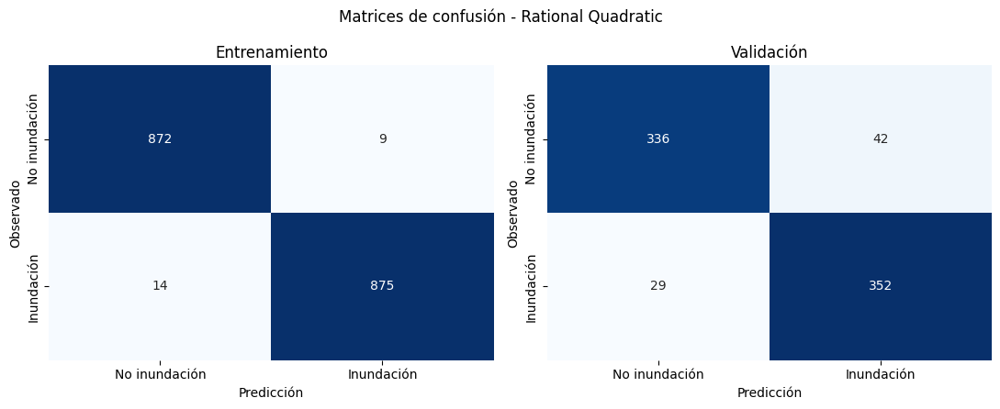

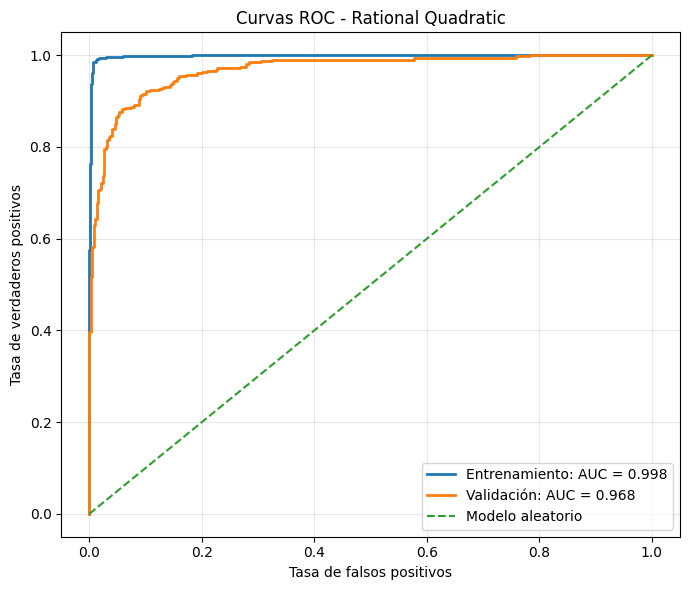

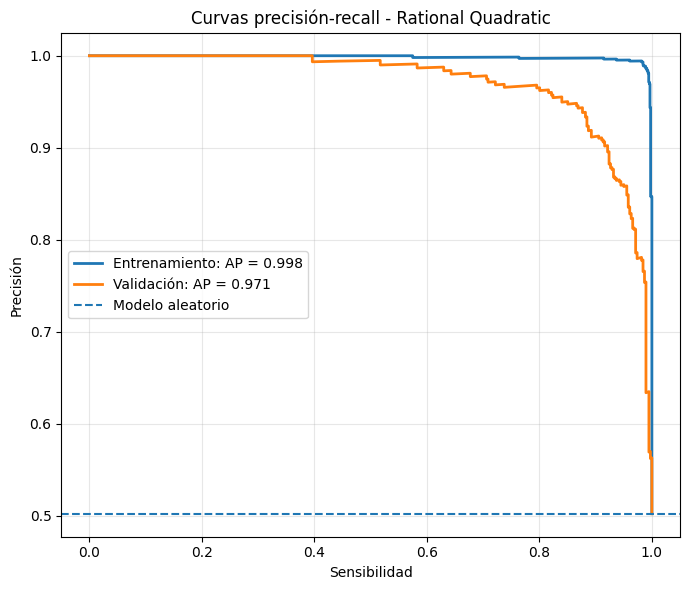

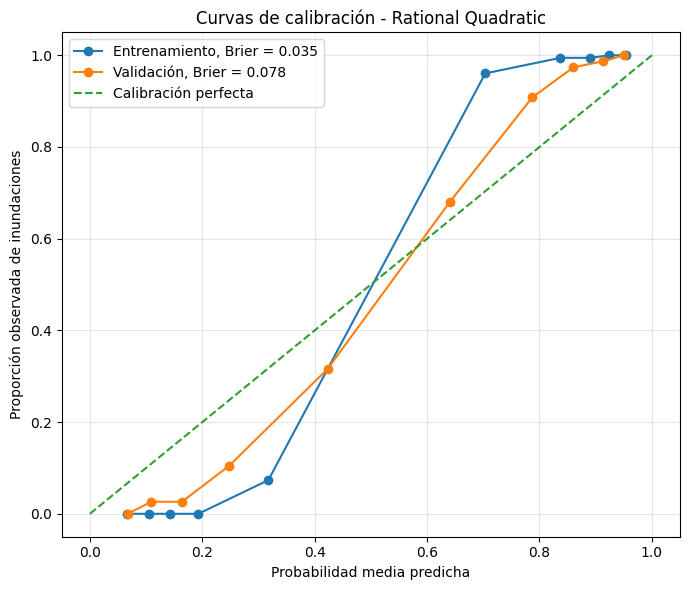

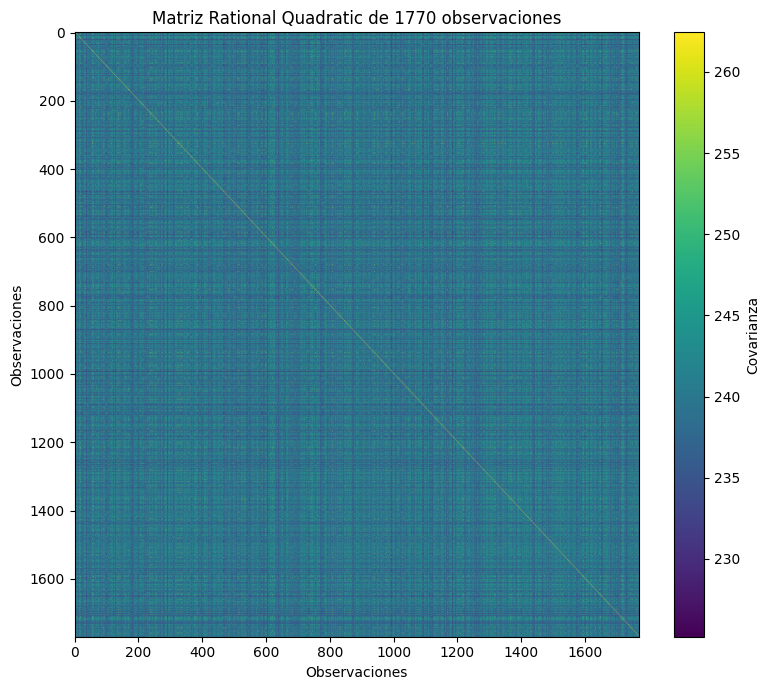

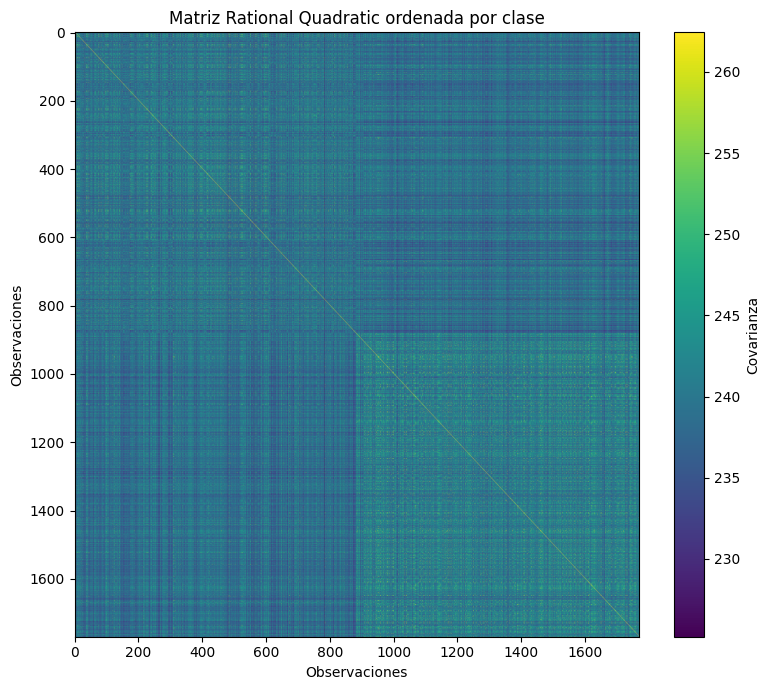

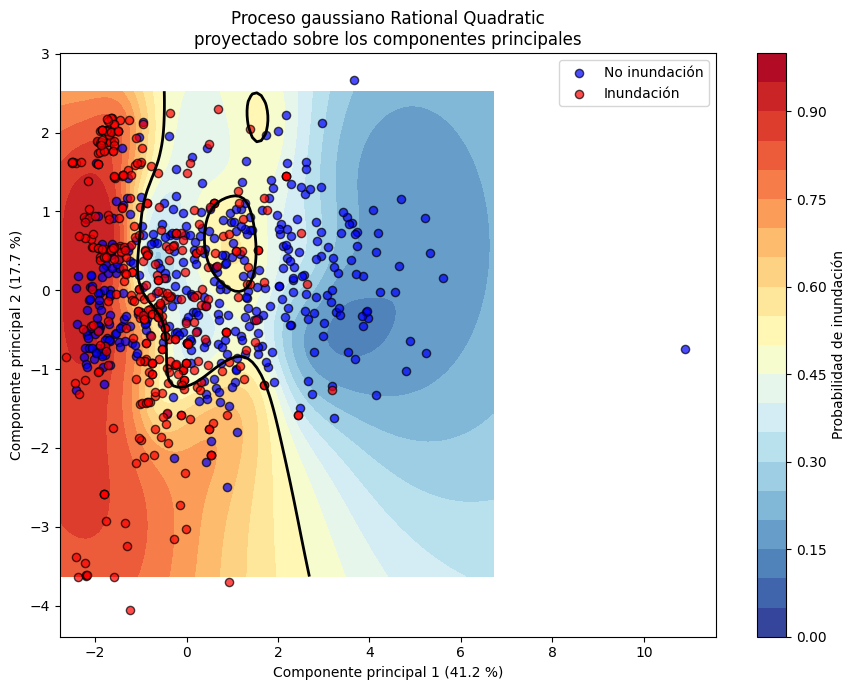


Contribución de las variables a los componentes:
             PC1    PC2
log_A     -0.171  0.704
Pend       0.400  0.204
Elev       0.266 -0.466
LAI        0.209  0.484
TPI       -0.430 -0.045
Curv_Mean -0.483 -0.099
TRI_Mean   0.527 -0.011

Varianza acumulada PC1 + PC2: 58.85 %

Resultados exportados correctamente:
C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg


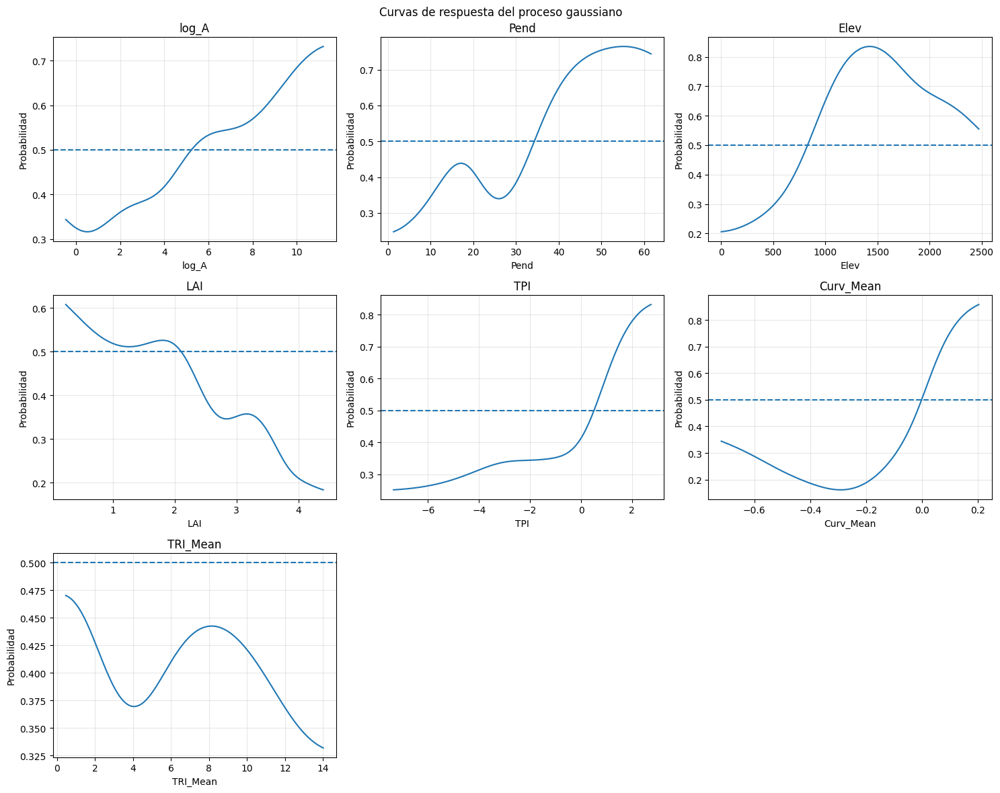

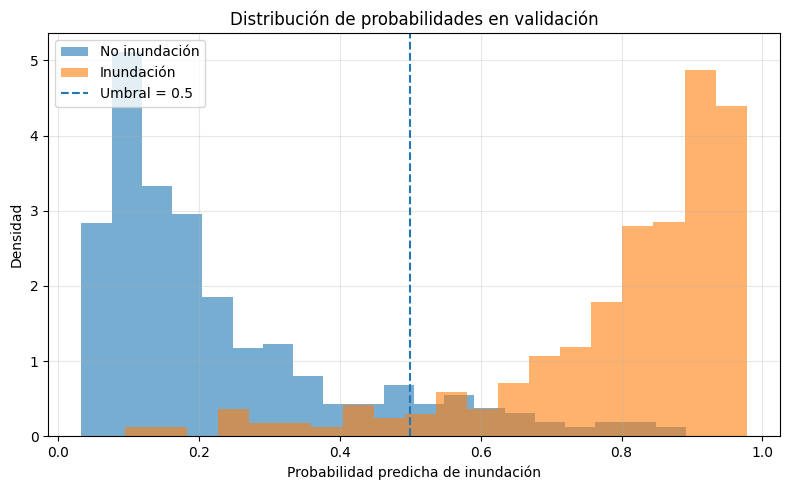

In [9]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RationalQuadratic
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_curve, roc_auc_score,
    precision_recall_curve, average_precision_score, accuracy_score,
    precision_score, recall_score, f1_score, log_loss, brier_score_loss
)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.calibration import calibration_curve

ruta_shape = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Eventos_y_ausencias_V1.shp"
ruta_salida = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg"

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))
var = ["log_A", "Pend", "Elev", "LAI", "TPI", "Curv_Mean", "TRI_Mean"]

df = gdf[["Inund"] + var].replace([-9999, np.inf, -np.inf], np.nan).dropna()
X = df[var]
y = df["Inund"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)
X_all_sc = scaler.transform(X)

kernel = ConstantKernel(constant_value=16.2**2, constant_value_bounds="fixed") * RationalQuadratic(
    length_scale=2.18, alpha=0.0235, length_scale_bounds="fixed", alpha_bounds="fixed"
)

modelo_gp = GaussianProcessClassifier(kernel=kernel, optimizer=None, max_iter_predict=100, warm_start=True, random_state=42)
modelo_gp.fit(X_train_sc, y_train)

print("\nKernel utilizado:")
print(modelo_gp.kernel_)

prob_train = modelo_gp.predict_proba(X_train_sc)[:, 1]
prob_test = modelo_gp.predict_proba(X_test_sc)[:, 1]
pred_train = (prob_train >= 0.5).astype(int)
pred_test = (prob_test >= 0.5).astype(int)

cm_train = confusion_matrix(y_train, pred_train)
cm_test = confusion_matrix(y_test, pred_test)
tn_train, fp_train, fn_train, tp_train = cm_train.ravel()
tn_test, fp_test, fn_test, tp_test = cm_test.ravel()

metricas = pd.DataFrame({
    "Métrica": [
        "AUC",
        "Average precision",
        "Accuracy",
        "Precisión",
        "Sensibilidad",
        "Especificidad",
        "F1-score",
        "R²",
        "MAE",
        "RMSE",
        "Log-loss",
        "Brier score"
    ],

    "Entrenamiento": [
        roc_auc_score(y_train, prob_train),
        average_precision_score(y_train, prob_train),
        accuracy_score(y_train, pred_train),
        precision_score(y_train, pred_train, zero_division=0),
        recall_score(y_train, pred_train, zero_division=0),
        tn_train / (tn_train + fp_train),
        f1_score(y_train, pred_train, zero_division=0),
        r2_score(y_train, prob_train),
        mean_absolute_error(y_train, prob_train),
        np.sqrt(mean_squared_error(y_train, prob_train)),
        log_loss(y_train, prob_train),
        brier_score_loss(y_train, prob_train)
    ],

    "Validación": [
        roc_auc_score(y_test, prob_test),
        average_precision_score(y_test, prob_test),
        accuracy_score(y_test, pred_test),
        precision_score(y_test, pred_test, zero_division=0),
        recall_score(y_test, pred_test, zero_division=0),
        tn_test / (tn_test + fp_test),
        f1_score(y_test, pred_test, zero_division=0),
        r2_score(y_test, prob_test),
        mean_absolute_error(y_test, prob_test),
        np.sqrt(mean_squared_error(y_test, prob_test)),
        log_loss(y_test, prob_test),
        brier_score_loss(y_test, prob_test)
    ]
})

metricas["Diferencia"] = metricas["Entrenamiento"] - metricas["Validación"]

print("\nDesempeño del modelo Rational Quadratic:")
print(metricas.round(4).to_string(index=False))

print("\nReporte de clasificación de validación:")
print(classification_report(y_test, pred_test, target_names=["No inundación", "Inundación"], digits=4))

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[0], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[0].set_title("Entrenamiento")
axes[0].set_xlabel("Predicción")
axes[0].set_ylabel("Observado")

sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[1], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[1].set_title("Validación")
axes[1].set_xlabel("Predicción")
axes[1].set_ylabel("Observado")

plt.suptitle("Matrices de confusión - Rational Quadratic")
plt.tight_layout()
plt.show()

fpr_train, tpr_train, _ = roc_curve(y_train, prob_train)
fpr_test, tpr_test, _ = roc_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(fpr_train, tpr_train, linewidth=2, label=f"Entrenamiento: AUC = {roc_auc_score(y_train, prob_train):.3f}")
plt.plot(fpr_test, tpr_test, linewidth=2, label=f"Validación: AUC = {roc_auc_score(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Modelo aleatorio")
plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC - Rational Quadratic")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

precision_train, recall_train, _ = precision_recall_curve(y_train, prob_train)
precision_test, recall_test, _ = precision_recall_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(recall_train, precision_train, linewidth=2, label=f"Entrenamiento: AP = {average_precision_score(y_train, prob_train):.3f}")
plt.plot(recall_test, precision_test, linewidth=2, label=f"Validación: AP = {average_precision_score(y_test, prob_test):.3f}")
plt.axhline(y_test.mean(), linestyle="--", label="Modelo aleatorio")
plt.xlabel("Sensibilidad")
plt.ylabel("Precisión")
plt.title("Curvas precisión-recall - Rational Quadratic")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

prob_real_train, prob_pred_train = calibration_curve(y_train, prob_train, n_bins=10, strategy="quantile")
prob_real_test, prob_pred_test = calibration_curve(y_test, prob_test, n_bins=10, strategy="quantile")

plt.figure(figsize=(7, 6))
plt.plot(prob_pred_train, prob_real_train, marker="o", label=f"Entrenamiento, Brier = {brier_score_loss(y_train, prob_train):.3f}")
plt.plot(prob_pred_test, prob_real_test, marker="o", label=f"Validación, Brier = {brier_score_loss(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Calibración perfecta")
plt.xlabel("Probabilidad media predicha")
plt.ylabel("Proporción observada de inundaciones")
plt.title("Curvas de calibración - Rational Quadratic")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

n_kernel = min(4000, len(X_train_sc))
rng = np.random.default_rng(42)
idx_kernel = rng.choice(len(X_train_sc), size=n_kernel, replace=False)
X_kernel = X_train_sc[idx_kernel]
K = modelo_gp.kernel_(X_kernel)

plt.figure(figsize=(8, 7))
plt.imshow(K, aspect="auto", cmap="viridis")
plt.colorbar(label="Covarianza")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.title(f"Matriz Rational Quadratic de {n_kernel} observaciones")
plt.tight_layout()
plt.show()

orden = np.argsort(y_train.iloc[idx_kernel].to_numpy())
K_ordenada = K[orden][:, orden]

plt.figure(figsize=(8, 7))
plt.imshow(K_ordenada, cmap="viridis", aspect="auto")
plt.colorbar(label="Covarianza")
plt.title("Matriz Rational Quadratic ordenada por clase")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.tight_layout()
plt.show()

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(X_train_pca[:, 0].min(), X_train_pca[:, 0].max(), 100)
pc2 = np.linspace(X_train_pca[:, 1].min(), X_train_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(pc1, pc2)

malla_pca = np.column_stack([xx.ravel(), yy.ravel()])
malla_original = pca.inverse_transform(malla_pca)
prob_malla = modelo_gp.predict_proba(malla_original)[:, 1].reshape(xx.shape)

plt.figure(figsize=(9, 7))
contorno = plt.contourf(xx, yy, prob_malla, levels=np.linspace(0, 1, 21), cmap="RdYlBu_r")
plt.colorbar(contorno, label="Probabilidad de inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 0, 0], X_test_pca[y_test.to_numpy() == 0, 1], c="blue", edgecolor="black", s=35, alpha=0.7, label="No inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 1, 0], X_test_pca[y_test.to_numpy() == 1, 1], c="red", edgecolor="black", s=35, alpha=0.7, label="Inundación")
plt.contour(xx, yy, prob_malla, levels=[0.5], colors="black", linewidths=2)
plt.xlabel(f"Componente principal 1 ({pca.explained_variance_ratio_[0] * 100:.1f} %)")
plt.ylabel(f"Componente principal 2 ({pca.explained_variance_ratio_[1] * 100:.1f} %)")
plt.title("Proceso gaussiano Rational Quadratic\nproyectado sobre los componentes principales")
plt.legend()
plt.tight_layout()
plt.show()

cargas = pd.DataFrame(pca.components_.T, index=var, columns=["PC1", "PC2"])
print("\nContribución de las variables a los componentes:")
print(cargas.round(3))
print("\nVarianza acumulada PC1 + PC2:", f"{pca.explained_variance_ratio_.sum() * 100:.2f} %")

prob_all = modelo_gp.predict_proba(X_all_sc)[:, 1]
gdf["Prob_RQ"] = np.nan
gdf["Clase_RQ"] = np.nan
gdf["Resid_RQ"] = np.nan

gdf.loc[df.index, "Prob_RQ"] = prob_all
gdf.loc[df.index, "Clase_RQ"] = (prob_all >= 0.5).astype(int)
gdf.loc[df.index, "Resid_RQ"] = y.to_numpy() - prob_all

gdf["Suscept_RQ"] = pd.cut(
    gdf["Prob_RQ"],
    bins=[0, 0.2, 0.4, 0.6, 0.8, 1],
    labels=["Muy baja", "Baja", "Media", "Alta", "Muy alta"],
    include_lowest=True
)

gdf.to_file(ruta_salida, layer="Resultados_RationalQuadratic", driver="GPKG")
print("\nResultados exportados correctamente:")
print(ruta_salida)

def curvas_respuesta_gp(modelo, scaler, X, var, n=150):
    X_sc = scaler.transform(X[var])
    base = np.median(X_sc, axis=0)
    n_cols = 3
    n_rows = int(np.ceil(len(var) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
    axes = np.asarray(axes).ravel()

    for j, variable in enumerate(var):
        valores = np.linspace(np.percentile(X_sc[:, j], 2), np.percentile(X_sc[:, j], 98), n)
        malla = np.tile(base, (n, 1))
        malla[:, j] = valores
        prob = np.clip(modelo.predict_proba(malla)[:, 1], 0, 1)
        valores_originales = scaler.inverse_transform(malla)[:, j]

        axes[j].plot(valores_originales, prob)
        axes[j].axhline(0.5, linestyle="--")
        axes[j].set_xlabel(variable)
        axes[j].set_ylabel("Probabilidad")
        axes[j].set_title(variable)
        axes[j].grid(alpha=0.3)

    for j in range(len(var), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Curvas de respuesta del proceso gaussiano")
    plt.tight_layout()
    plt.show()

curvas_respuesta_gp(modelo_gp, scaler, X, var)

plt.figure(figsize=(8, 5))

plt.hist(prob_test[y_test.to_numpy() == 0], bins=20, alpha=0.6, density=True, label="No inundación")
plt.hist(prob_test[y_test.to_numpy() == 1], bins=20, alpha=0.6, density=True, label="Inundación")

plt.axvline(0.5, linestyle="--", label="Umbral = 0.5")

plt.xlabel("Probabilidad predicha de inundación")
plt.ylabel("Densidad")
plt.title("Distribución de probabilidades en validación")

plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Kernel utilizado:
12.4**2 * Matern(length_scale=14.6, nu=0.5)

Desempeño del modelo Matérn 0.5:
          Métrica  Entrenamiento  Validación  Diferencia
              AUC         0.9995      0.9700      0.0295
Average precision         0.9995      0.9731      0.0264
         Accuracy         0.9915      0.9091      0.0824
        Precisión         0.9910      0.8959      0.0951
     Sensibilidad         0.9921      0.9265      0.0656
    Especificidad         0.9909      0.8915      0.0994
         F1-score         0.9916      0.9110      0.0806
               R²         0.8666      0.6945      0.1721
              MAE         0.1515      0.2111     -0.0596
             RMSE         0.1826      0.2764     -0.0937
         Log-loss         0.1729      0.2772     -0.1043
      Brier score         0.0334      0.0764     -0.0430

Reporte de clasificación de validación:
               precision    recall  f1-score   support

No inundación     0.9233    0.8915    0.9071       378
   Inundac

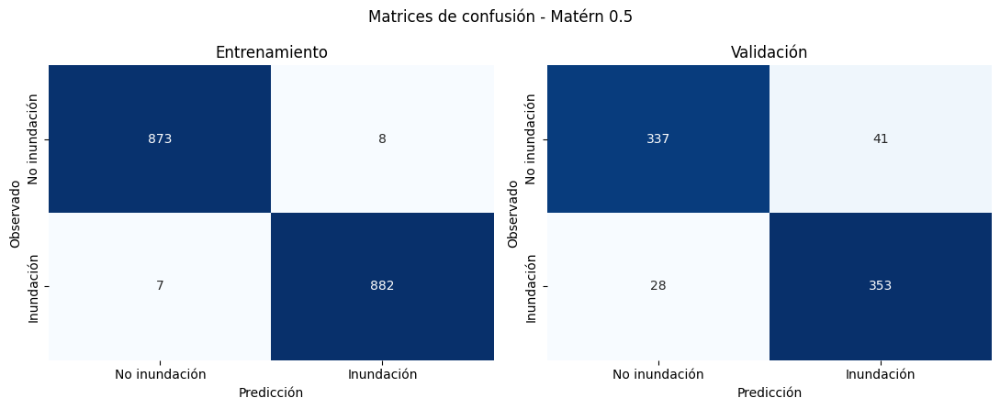

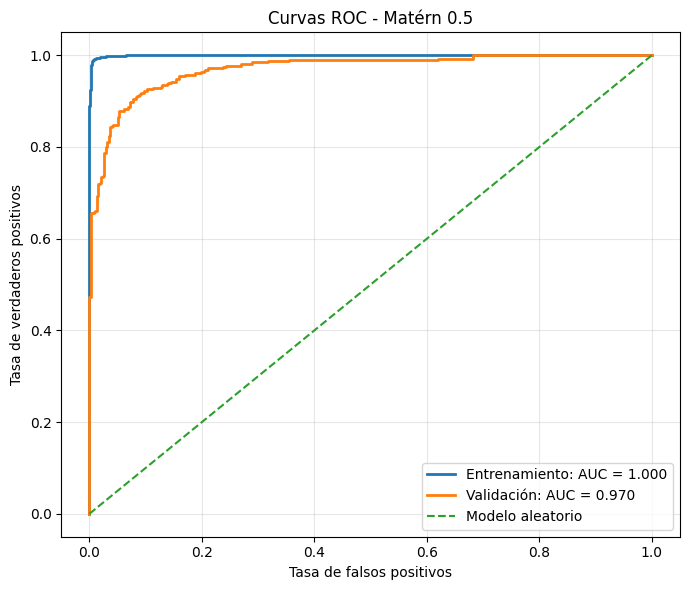

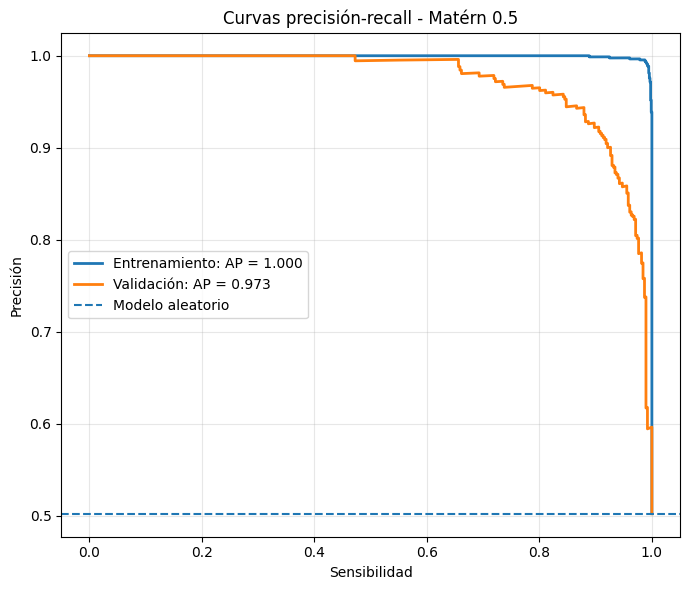

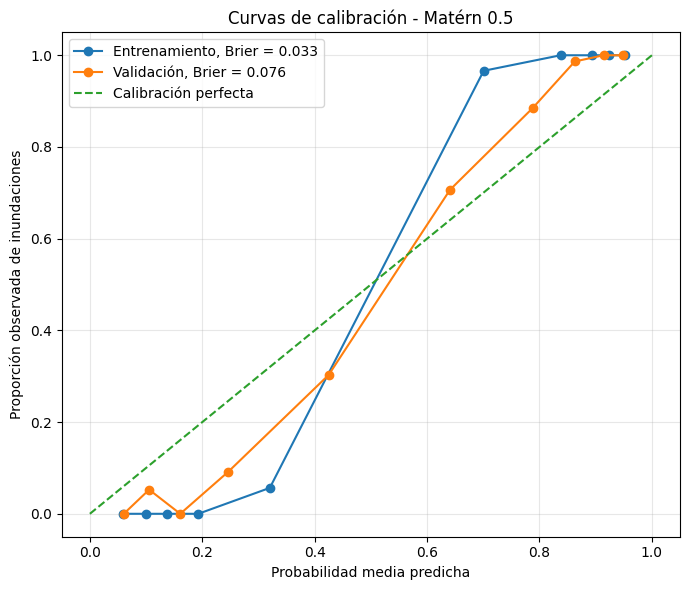

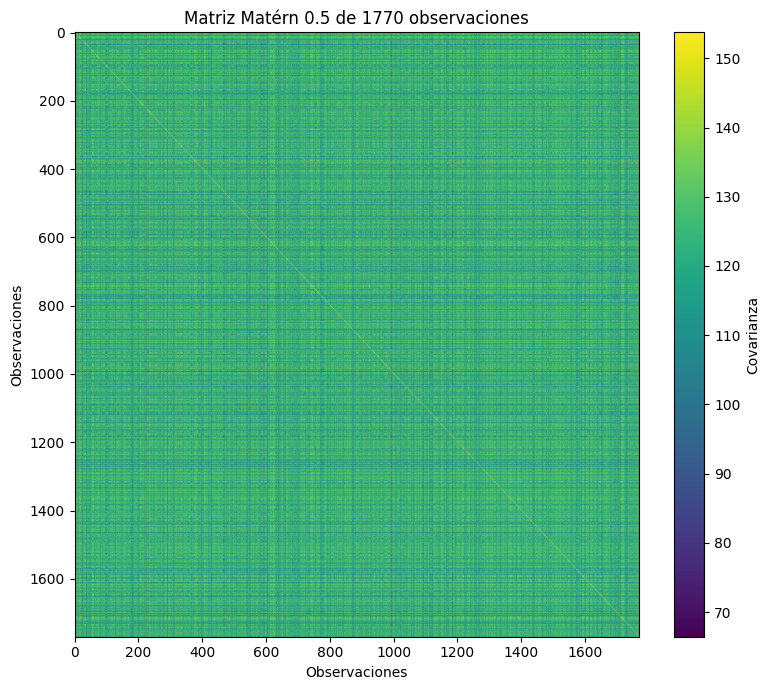

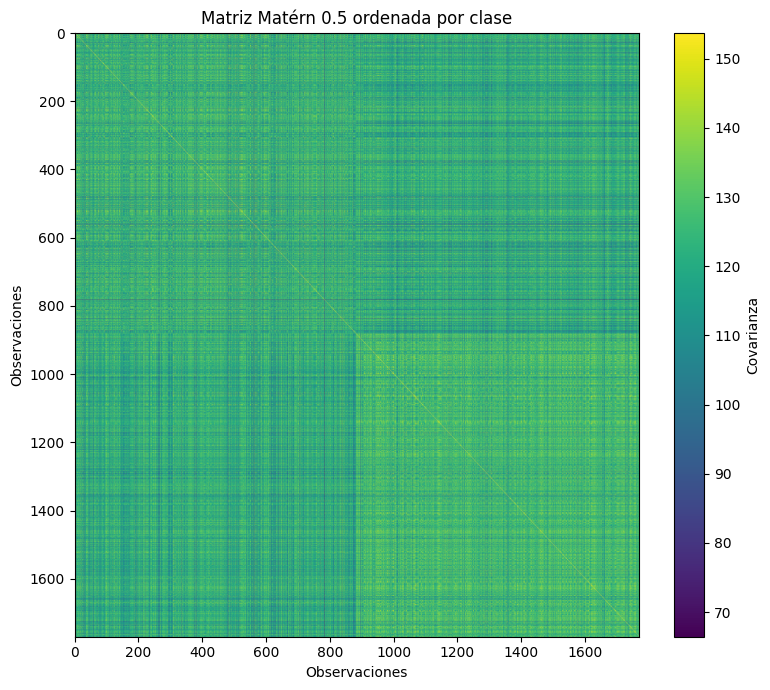

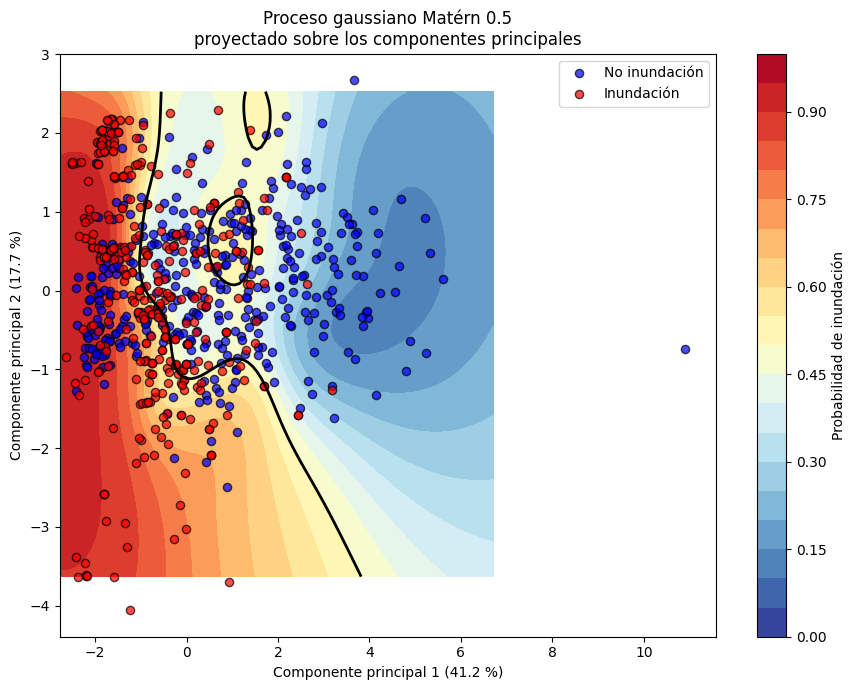


Contribución de las variables a los componentes:
             PC1    PC2
log_A     -0.171  0.704
Pend       0.400  0.204
Elev       0.266 -0.466
LAI        0.209  0.484
TPI       -0.430 -0.045
Curv_Mean -0.483 -0.099
TRI_Mean   0.527 -0.011

Varianza acumulada PC1 + PC2: 58.85 %

Resultados exportados correctamente:
C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg


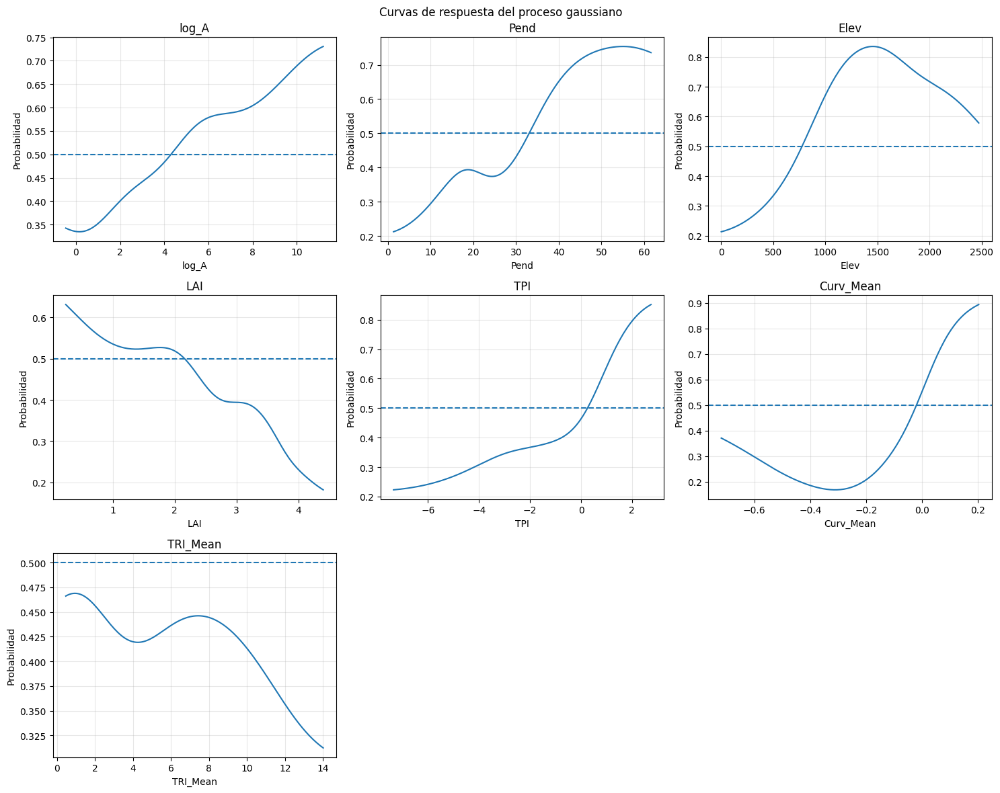

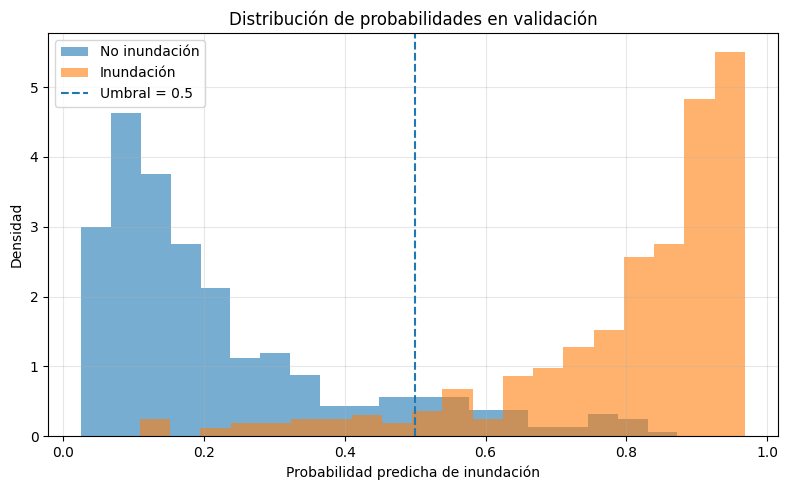

In [10]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RationalQuadratic
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_curve, roc_auc_score,
    precision_recall_curve, average_precision_score, accuracy_score,
    precision_score, recall_score, f1_score, log_loss, brier_score_loss
)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.calibration import calibration_curve
from sklearn.gaussian_process.kernels import Matern

ruta_shape = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Eventos_y_ausencias_V1.shp"
ruta_salida = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg"

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))
var = ["log_A", "Pend", "Elev", "LAI", "TPI", "Curv_Mean", "TRI_Mean"]

df = gdf[["Inund"] + var].replace([-9999, np.inf, -np.inf], np.nan).dropna()
X = df[var]
y = df["Inund"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)
X_all_sc = scaler.transform(X)

kernel = ConstantKernel(
    constant_value=12.4**2,
    constant_value_bounds="fixed"
) * Matern(
    length_scale=14.6,
    nu=0.5,
    length_scale_bounds="fixed"
)

modelo_gp = GaussianProcessClassifier(kernel=kernel, optimizer=None, max_iter_predict=100, warm_start=True, random_state=42)
modelo_gp.fit(X_train_sc, y_train)

print("\nKernel utilizado:")
print(modelo_gp.kernel_)

prob_train = modelo_gp.predict_proba(X_train_sc)[:, 1]
prob_test = modelo_gp.predict_proba(X_test_sc)[:, 1]
pred_train = (prob_train >= 0.5).astype(int)
pred_test = (prob_test >= 0.5).astype(int)

cm_train = confusion_matrix(y_train, pred_train)
cm_test = confusion_matrix(y_test, pred_test)
tn_train, fp_train, fn_train, tp_train = cm_train.ravel()
tn_test, fp_test, fn_test, tp_test = cm_test.ravel()

metricas = pd.DataFrame({
    "Métrica": [
        "AUC",
        "Average precision",
        "Accuracy",
        "Precisión",
        "Sensibilidad",
        "Especificidad",
        "F1-score",
        "R²",
        "MAE",
        "RMSE",
        "Log-loss",
        "Brier score"
    ],

    "Entrenamiento": [
        roc_auc_score(y_train, prob_train),
        average_precision_score(y_train, prob_train),
        accuracy_score(y_train, pred_train),
        precision_score(y_train, pred_train, zero_division=0),
        recall_score(y_train, pred_train, zero_division=0),
        tn_train / (tn_train + fp_train),
        f1_score(y_train, pred_train, zero_division=0),
        r2_score(y_train, prob_train),
        mean_absolute_error(y_train, prob_train),
        np.sqrt(mean_squared_error(y_train, prob_train)),
        log_loss(y_train, prob_train),
        brier_score_loss(y_train, prob_train)
    ],

    "Validación": [
        roc_auc_score(y_test, prob_test),
        average_precision_score(y_test, prob_test),
        accuracy_score(y_test, pred_test),
        precision_score(y_test, pred_test, zero_division=0),
        recall_score(y_test, pred_test, zero_division=0),
        tn_test / (tn_test + fp_test),
        f1_score(y_test, pred_test, zero_division=0),
        r2_score(y_test, prob_test),
        mean_absolute_error(y_test, prob_test),
        np.sqrt(mean_squared_error(y_test, prob_test)),
        log_loss(y_test, prob_test),
        brier_score_loss(y_test, prob_test)
    ]
})

metricas["Diferencia"] = metricas["Entrenamiento"] - metricas["Validación"]

print("\nDesempeño del modelo Matérn 0.5:")
print(metricas.round(4).to_string(index=False))

print("\nReporte de clasificación de validación:")
print(classification_report(y_test, pred_test, target_names=["No inundación", "Inundación"], digits=4))

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[0], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[0].set_title("Entrenamiento")
axes[0].set_xlabel("Predicción")
axes[0].set_ylabel("Observado")

sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[1], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[1].set_title("Validación")
axes[1].set_xlabel("Predicción")
axes[1].set_ylabel("Observado")

plt.suptitle("Matrices de confusión - Matérn 0.5")
plt.tight_layout()
plt.show()

fpr_train, tpr_train, _ = roc_curve(y_train, prob_train)
fpr_test, tpr_test, _ = roc_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(fpr_train, tpr_train, linewidth=2, label=f"Entrenamiento: AUC = {roc_auc_score(y_train, prob_train):.3f}")
plt.plot(fpr_test, tpr_test, linewidth=2, label=f"Validación: AUC = {roc_auc_score(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Modelo aleatorio")
plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC - Matérn 0.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

precision_train, recall_train, _ = precision_recall_curve(y_train, prob_train)
precision_test, recall_test, _ = precision_recall_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(recall_train, precision_train, linewidth=2, label=f"Entrenamiento: AP = {average_precision_score(y_train, prob_train):.3f}")
plt.plot(recall_test, precision_test, linewidth=2, label=f"Validación: AP = {average_precision_score(y_test, prob_test):.3f}")
plt.axhline(y_test.mean(), linestyle="--", label="Modelo aleatorio")
plt.xlabel("Sensibilidad")
plt.ylabel("Precisión")
plt.title("Curvas precisión-recall - Matérn 0.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

prob_real_train, prob_pred_train = calibration_curve(y_train, prob_train, n_bins=10, strategy="quantile")
prob_real_test, prob_pred_test = calibration_curve(y_test, prob_test, n_bins=10, strategy="quantile")

plt.figure(figsize=(7, 6))
plt.plot(prob_pred_train, prob_real_train, marker="o", label=f"Entrenamiento, Brier = {brier_score_loss(y_train, prob_train):.3f}")
plt.plot(prob_pred_test, prob_real_test, marker="o", label=f"Validación, Brier = {brier_score_loss(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Calibración perfecta")
plt.xlabel("Probabilidad media predicha")
plt.ylabel("Proporción observada de inundaciones")
plt.title("Curvas de calibración - Matérn 0.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

n_kernel = min(4000, len(X_train_sc))
rng = np.random.default_rng(42)
idx_kernel = rng.choice(len(X_train_sc), size=n_kernel, replace=False)
X_kernel = X_train_sc[idx_kernel]
K = modelo_gp.kernel_(X_kernel)

plt.figure(figsize=(8, 7))
plt.imshow(K, aspect="auto", cmap="viridis")
plt.colorbar(label="Covarianza")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.title(f"Matriz Matérn 0.5 de {n_kernel} observaciones")
plt.tight_layout()
plt.show()

orden = np.argsort(y_train.iloc[idx_kernel].to_numpy())
K_ordenada = K[orden][:, orden]

plt.figure(figsize=(8, 7))
plt.imshow(K_ordenada, cmap="viridis", aspect="auto")
plt.colorbar(label="Covarianza")
plt.title("Matriz Matérn 0.5 ordenada por clase")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.tight_layout()
plt.show()

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(X_train_pca[:, 0].min(), X_train_pca[:, 0].max(), 100)
pc2 = np.linspace(X_train_pca[:, 1].min(), X_train_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(pc1, pc2)

malla_pca = np.column_stack([xx.ravel(), yy.ravel()])
malla_original = pca.inverse_transform(malla_pca)
prob_malla = modelo_gp.predict_proba(malla_original)[:, 1].reshape(xx.shape)

plt.figure(figsize=(9, 7))
contorno = plt.contourf(xx, yy, prob_malla, levels=np.linspace(0, 1, 21), cmap="RdYlBu_r")
plt.colorbar(contorno, label="Probabilidad de inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 0, 0], X_test_pca[y_test.to_numpy() == 0, 1], c="blue", edgecolor="black", s=35, alpha=0.7, label="No inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 1, 0], X_test_pca[y_test.to_numpy() == 1, 1], c="red", edgecolor="black", s=35, alpha=0.7, label="Inundación")
plt.contour(xx, yy, prob_malla, levels=[0.5], colors="black", linewidths=2)
plt.xlabel(f"Componente principal 1 ({pca.explained_variance_ratio_[0] * 100:.1f} %)")
plt.ylabel(f"Componente principal 2 ({pca.explained_variance_ratio_[1] * 100:.1f} %)")
plt.title("Proceso gaussiano Matérn 0.5\nproyectado sobre los componentes principales")
plt.legend()
plt.tight_layout()
plt.show()

cargas = pd.DataFrame(pca.components_.T, index=var, columns=["PC1", "PC2"])
print("\nContribución de las variables a los componentes:")
print(cargas.round(3))
print("\nVarianza acumulada PC1 + PC2:", f"{pca.explained_variance_ratio_.sum() * 100:.2f} %")

prob_all = modelo_gp.predict_proba(X_all_sc)[:, 1]
gdf["Prob_RQ"] = np.nan
gdf["Clase_RQ"] = np.nan
gdf["Resid_RQ"] = np.nan

gdf.loc[df.index, "Prob_RQ"] = prob_all
gdf.loc[df.index, "Clase_RQ"] = (prob_all >= 0.5).astype(int)
gdf.loc[df.index, "Resid_RQ"] = y.to_numpy() - prob_all

gdf["Suscept_RQ"] = pd.cut(
    gdf["Prob_RQ"],
    bins=[0, 0.2, 0.4, 0.6, 0.8, 1],
    labels=["Muy baja", "Baja", "Media", "Alta", "Muy alta"],
    include_lowest=True
)

gdf.to_file(ruta_salida, layer="Resultados_RationalQuadratic", driver="GPKG")
print("\nResultados exportados correctamente:")
print(ruta_salida)

def curvas_respuesta_gp(modelo, scaler, X, var, n=150):
    X_sc = scaler.transform(X[var])
    base = np.median(X_sc, axis=0)
    n_cols = 3
    n_rows = int(np.ceil(len(var) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
    axes = np.asarray(axes).ravel()

    for j, variable in enumerate(var):
        valores = np.linspace(np.percentile(X_sc[:, j], 2), np.percentile(X_sc[:, j], 98), n)
        malla = np.tile(base, (n, 1))
        malla[:, j] = valores
        prob = np.clip(modelo.predict_proba(malla)[:, 1], 0, 1)
        valores_originales = scaler.inverse_transform(malla)[:, j]

        axes[j].plot(valores_originales, prob)
        axes[j].axhline(0.5, linestyle="--")
        axes[j].set_xlabel(variable)
        axes[j].set_ylabel("Probabilidad")
        axes[j].set_title(variable)
        axes[j].grid(alpha=0.3)

    for j in range(len(var), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Curvas de respuesta del proceso gaussiano")
    plt.tight_layout()
    plt.show()

curvas_respuesta_gp(modelo_gp, scaler, X, var)

plt.figure(figsize=(8, 5))

plt.hist(prob_test[y_test.to_numpy() == 0], bins=20, alpha=0.6, density=True, label="No inundación")
plt.hist(prob_test[y_test.to_numpy() == 1], bins=20, alpha=0.6, density=True, label="Inundación")

plt.axvline(0.5, linestyle="--", label="Umbral = 0.5")

plt.xlabel("Probabilidad predicha de inundación")
plt.ylabel("Densidad")
plt.title("Distribución de probabilidades en validación")

plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Kernel utilizado:
6.43**2 * Matern(length_scale=3.84, nu=1.5)

Desempeño del modelo Matérn 1.5:
          Métrica  Entrenamiento  Validación  Diferencia
              AUC         0.9779      0.9579      0.0200
Average precision         0.9791      0.9613      0.0178
         Accuracy         0.9198      0.8788      0.0410
        Precisión         0.9201      0.8734      0.0467
     Sensibilidad         0.9201      0.8871      0.0330
    Especificidad         0.9194      0.8704      0.0490
         F1-score         0.9201      0.8802      0.0399
               R²         0.7515      0.6754      0.0761
              MAE         0.1671      0.1896     -0.0225
             RMSE         0.2493      0.2849     -0.0356
         Log-loss         0.2248      0.2742     -0.0493
      Brier score         0.0621      0.0811     -0.0190

Reporte de clasificación de validación:
               precision    recall  f1-score   support

No inundación     0.8844    0.8704    0.8773       378
   Inundac

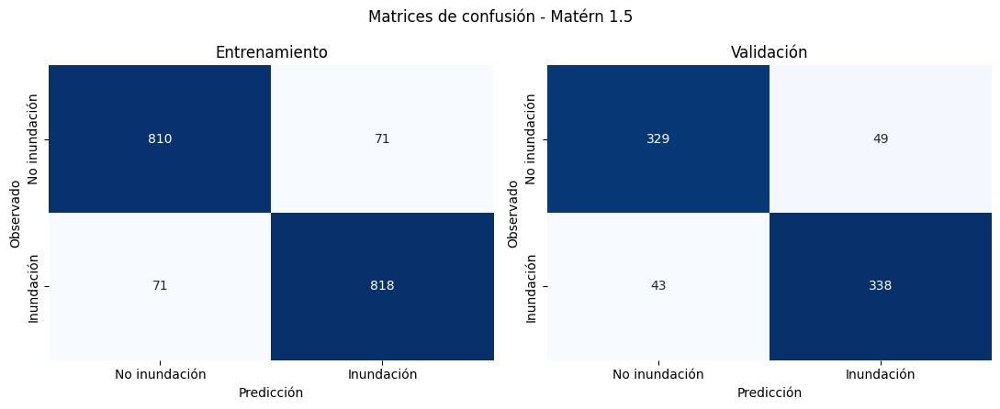

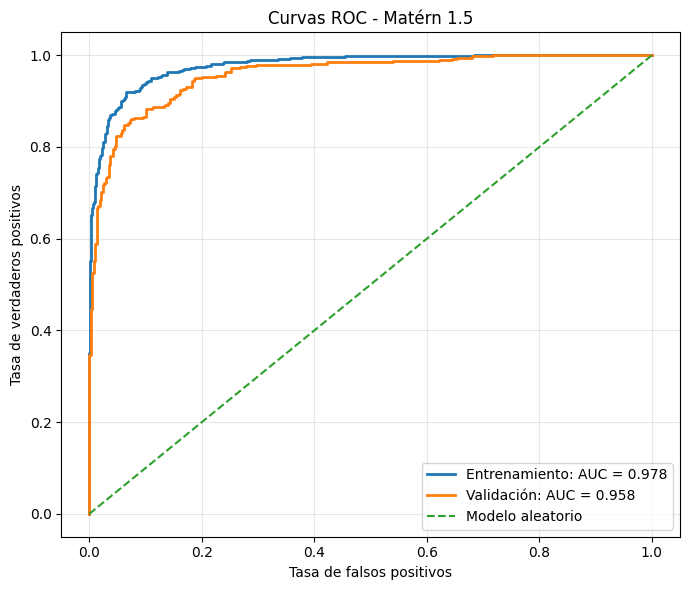

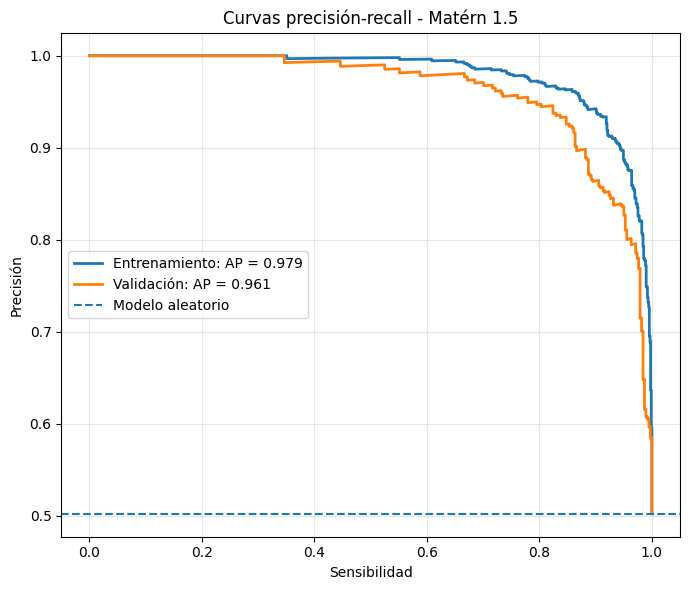

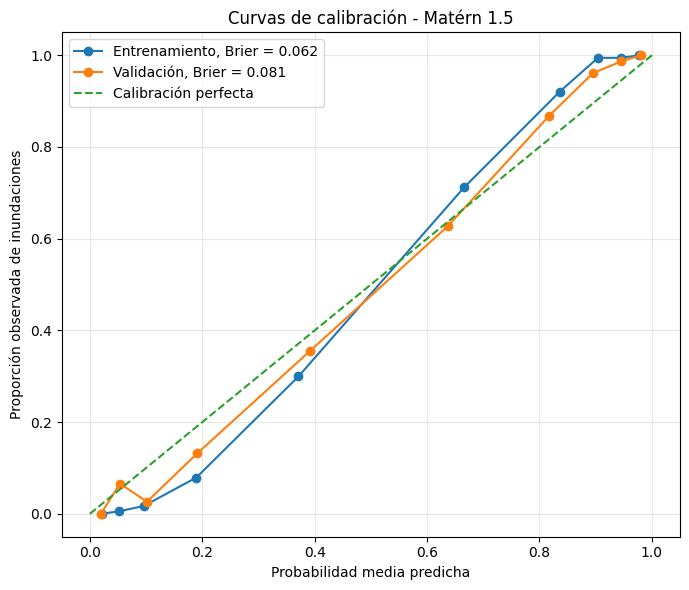

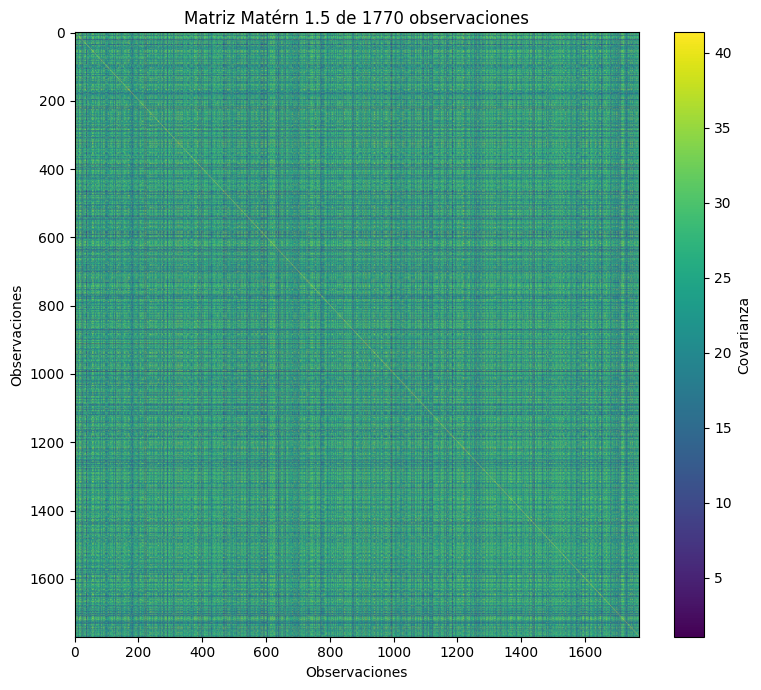

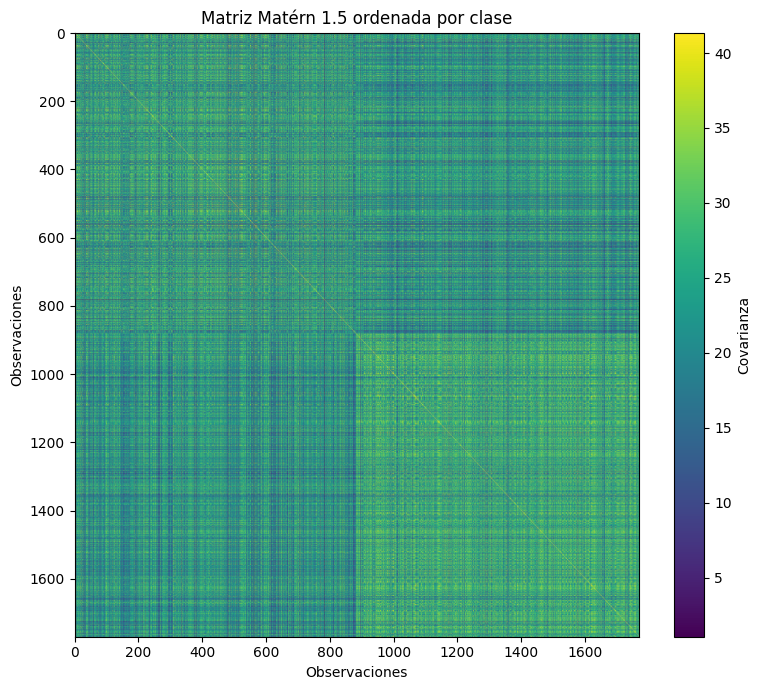

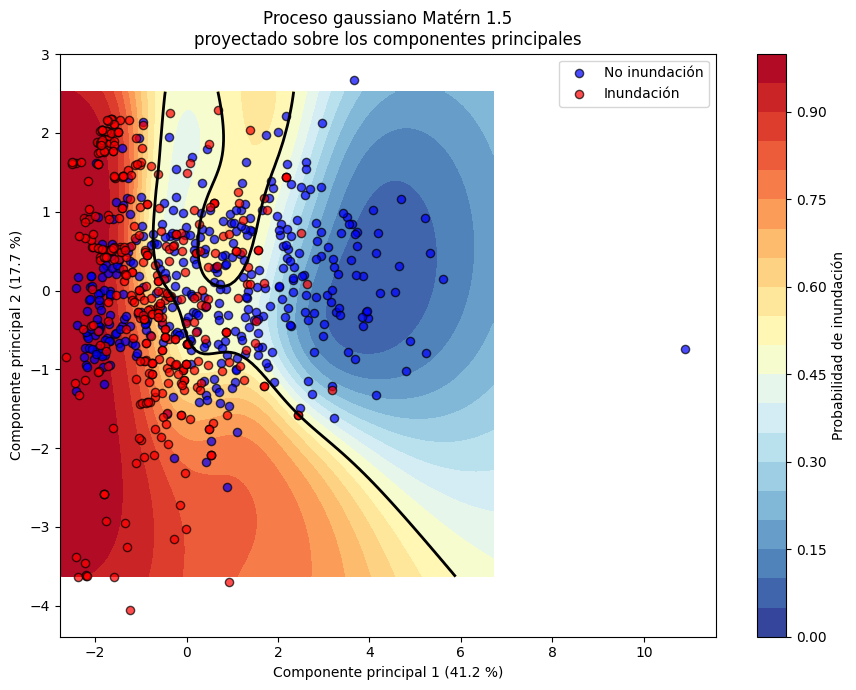


Contribución de las variables a los componentes:
             PC1    PC2
log_A     -0.171  0.704
Pend       0.400  0.204
Elev       0.266 -0.466
LAI        0.209  0.484
TPI       -0.430 -0.045
Curv_Mean -0.483 -0.099
TRI_Mean   0.527 -0.011

Varianza acumulada PC1 + PC2: 58.85 %

Resultados exportados correctamente:
C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg


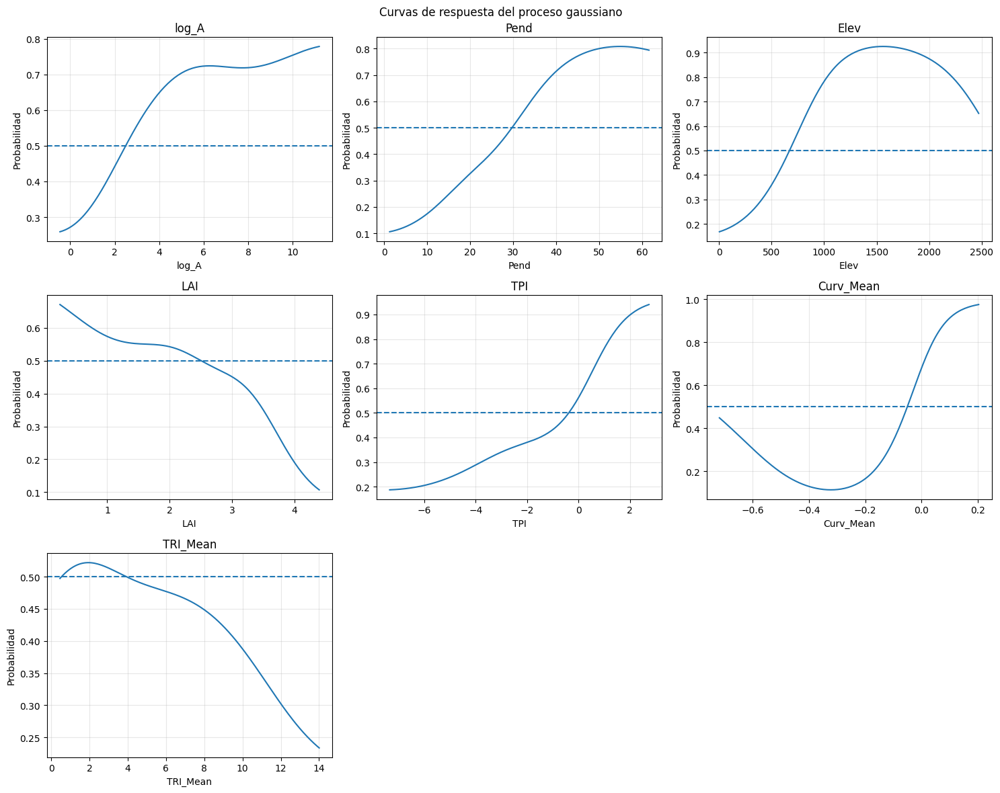

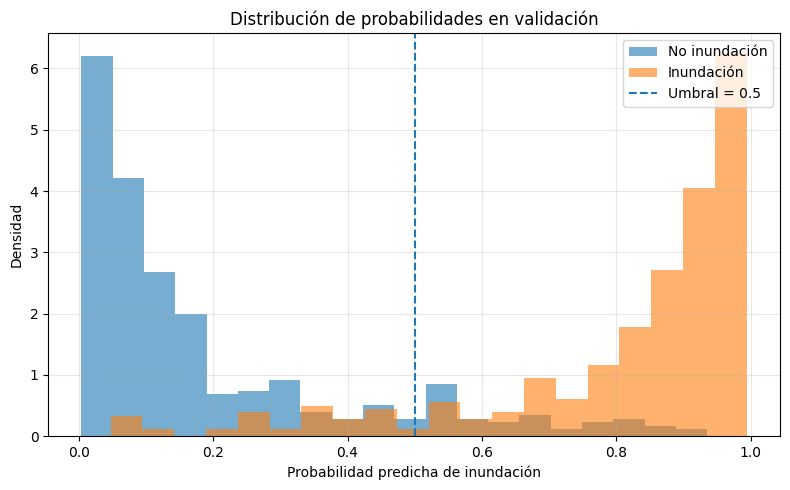

In [3]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import ConstantKernel, RationalQuadratic
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_curve, roc_auc_score,
    precision_recall_curve, average_precision_score, accuracy_score,
    precision_score, recall_score, f1_score, log_loss, brier_score_loss
)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.calibration import calibration_curve
from sklearn.gaussian_process.kernels import Matern

ruta_shape = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Eventos_y_ausencias_V1.shp"
ruta_salida = r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Puntos\Resultados_GP_RationalQuadratic.gpkg"

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))
var = ["log_A", "Pend", "Elev", "LAI", "TPI", "Curv_Mean", "TRI_Mean"]

df = gdf[["Inund"] + var].replace([-9999, np.inf, -np.inf], np.nan).dropna()
X = df[var]
y = df["Inund"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc = scaler.transform(X_test)
X_all_sc = scaler.transform(X)

kernel = ConstantKernel(
    constant_value=6.43**2,
    constant_value_bounds="fixed"
) * Matern(
    length_scale=3.84,
    nu=1.5,
    length_scale_bounds="fixed"
)

modelo_gp = GaussianProcessClassifier(kernel=kernel, optimizer=None, max_iter_predict=100, warm_start=True, random_state=42)
modelo_gp.fit(X_train_sc, y_train)

print("\nKernel utilizado:")
print(modelo_gp.kernel_)

prob_train = modelo_gp.predict_proba(X_train_sc)[:, 1]
prob_test = modelo_gp.predict_proba(X_test_sc)[:, 1]
pred_train = (prob_train >= 0.5).astype(int)
pred_test = (prob_test >= 0.5).astype(int)

cm_train = confusion_matrix(y_train, pred_train)
cm_test = confusion_matrix(y_test, pred_test)
tn_train, fp_train, fn_train, tp_train = cm_train.ravel()
tn_test, fp_test, fn_test, tp_test = cm_test.ravel()

metricas = pd.DataFrame({
    "Métrica": [
        "AUC",
        "Average precision",
        "Accuracy",
        "Precisión",
        "Sensibilidad",
        "Especificidad",
        "F1-score",
        "R²",
        "MAE",
        "RMSE",
        "Log-loss",
        "Brier score"
    ],

    "Entrenamiento": [
        roc_auc_score(y_train, prob_train),
        average_precision_score(y_train, prob_train),
        accuracy_score(y_train, pred_train),
        precision_score(y_train, pred_train, zero_division=0),
        recall_score(y_train, pred_train, zero_division=0),
        tn_train / (tn_train + fp_train),
        f1_score(y_train, pred_train, zero_division=0),
        r2_score(y_train, prob_train),
        mean_absolute_error(y_train, prob_train),
        np.sqrt(mean_squared_error(y_train, prob_train)),
        log_loss(y_train, prob_train),
        brier_score_loss(y_train, prob_train)
    ],

    "Validación": [
        roc_auc_score(y_test, prob_test),
        average_precision_score(y_test, prob_test),
        accuracy_score(y_test, pred_test),
        precision_score(y_test, pred_test, zero_division=0),
        recall_score(y_test, pred_test, zero_division=0),
        tn_test / (tn_test + fp_test),
        f1_score(y_test, pred_test, zero_division=0),
        r2_score(y_test, prob_test),
        mean_absolute_error(y_test, prob_test),
        np.sqrt(mean_squared_error(y_test, prob_test)),
        log_loss(y_test, prob_test),
        brier_score_loss(y_test, prob_test)
    ]
})

metricas["Diferencia"] = metricas["Entrenamiento"] - metricas["Validación"]

print("\nDesempeño del modelo Matérn 1.5:")
print(metricas.round(4).to_string(index=False))

print("\nReporte de clasificación de validación:")
print(classification_report(y_test, pred_test, target_names=["No inundación", "Inundación"], digits=4))

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))
sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[0], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[0].set_title("Entrenamiento")
axes[0].set_xlabel("Predicción")
axes[0].set_ylabel("Observado")

sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[1], xticklabels=["No inundación", "Inundación"], yticklabels=["No inundación", "Inundación"])
axes[1].set_title("Validación")
axes[1].set_xlabel("Predicción")
axes[1].set_ylabel("Observado")

plt.suptitle("Matrices de confusión - Matérn 1.5")
plt.tight_layout()
plt.show()

fpr_train, tpr_train, _ = roc_curve(y_train, prob_train)
fpr_test, tpr_test, _ = roc_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(fpr_train, tpr_train, linewidth=2, label=f"Entrenamiento: AUC = {roc_auc_score(y_train, prob_train):.3f}")
plt.plot(fpr_test, tpr_test, linewidth=2, label=f"Validación: AUC = {roc_auc_score(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Modelo aleatorio")
plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC - Matérn 1.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

precision_train, recall_train, _ = precision_recall_curve(y_train, prob_train)
precision_test, recall_test, _ = precision_recall_curve(y_test, prob_test)

plt.figure(figsize=(7, 6))
plt.plot(recall_train, precision_train, linewidth=2, label=f"Entrenamiento: AP = {average_precision_score(y_train, prob_train):.3f}")
plt.plot(recall_test, precision_test, linewidth=2, label=f"Validación: AP = {average_precision_score(y_test, prob_test):.3f}")
plt.axhline(y_test.mean(), linestyle="--", label="Modelo aleatorio")
plt.xlabel("Sensibilidad")
plt.ylabel("Precisión")
plt.title("Curvas precisión-recall - Matérn 1.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

prob_real_train, prob_pred_train = calibration_curve(y_train, prob_train, n_bins=10, strategy="quantile")
prob_real_test, prob_pred_test = calibration_curve(y_test, prob_test, n_bins=10, strategy="quantile")

plt.figure(figsize=(7, 6))
plt.plot(prob_pred_train, prob_real_train, marker="o", label=f"Entrenamiento, Brier = {brier_score_loss(y_train, prob_train):.3f}")
plt.plot(prob_pred_test, prob_real_test, marker="o", label=f"Validación, Brier = {brier_score_loss(y_test, prob_test):.3f}")
plt.plot([0, 1], [0, 1], "--", label="Calibración perfecta")
plt.xlabel("Probabilidad media predicha")
plt.ylabel("Proporción observada de inundaciones")
plt.title("Curvas de calibración - Matérn 1.5")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

n_kernel = min(4000, len(X_train_sc))
rng = np.random.default_rng(42)
idx_kernel = rng.choice(len(X_train_sc), size=n_kernel, replace=False)
X_kernel = X_train_sc[idx_kernel]
K = modelo_gp.kernel_(X_kernel)

plt.figure(figsize=(8, 7))
plt.imshow(K, aspect="auto", cmap="viridis")
plt.colorbar(label="Covarianza")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.title(f"Matriz Matérn 1.5 de {n_kernel} observaciones")
plt.tight_layout()
plt.show()

orden = np.argsort(y_train.iloc[idx_kernel].to_numpy())
K_ordenada = K[orden][:, orden]

plt.figure(figsize=(8, 7))
plt.imshow(K_ordenada, cmap="viridis", aspect="auto")
plt.colorbar(label="Covarianza")
plt.title("Matriz Matérn 1.5 ordenada por clase")
plt.xlabel("Observaciones")
plt.ylabel("Observaciones")
plt.tight_layout()
plt.show()

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(X_train_pca[:, 0].min(), X_train_pca[:, 0].max(), 100)
pc2 = np.linspace(X_train_pca[:, 1].min(), X_train_pca[:, 1].max(), 100)
xx, yy = np.meshgrid(pc1, pc2)

malla_pca = np.column_stack([xx.ravel(), yy.ravel()])
malla_original = pca.inverse_transform(malla_pca)
prob_malla = modelo_gp.predict_proba(malla_original)[:, 1].reshape(xx.shape)

plt.figure(figsize=(9, 7))
contorno = plt.contourf(xx, yy, prob_malla, levels=np.linspace(0, 1, 21), cmap="RdYlBu_r")
plt.colorbar(contorno, label="Probabilidad de inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 0, 0], X_test_pca[y_test.to_numpy() == 0, 1], c="blue", edgecolor="black", s=35, alpha=0.7, label="No inundación")
plt.scatter(X_test_pca[y_test.to_numpy() == 1, 0], X_test_pca[y_test.to_numpy() == 1, 1], c="red", edgecolor="black", s=35, alpha=0.7, label="Inundación")
plt.contour(xx, yy, prob_malla, levels=[0.5], colors="black", linewidths=2)
plt.xlabel(f"Componente principal 1 ({pca.explained_variance_ratio_[0] * 100:.1f} %)")
plt.ylabel(f"Componente principal 2 ({pca.explained_variance_ratio_[1] * 100:.1f} %)")
plt.title("Proceso gaussiano Matérn 1.5\nproyectado sobre los componentes principales")
plt.legend()
plt.tight_layout()
plt.show()

cargas = pd.DataFrame(pca.components_.T, index=var, columns=["PC1", "PC2"])
print("\nContribución de las variables a los componentes:")
print(cargas.round(3))
print("\nVarianza acumulada PC1 + PC2:", f"{pca.explained_variance_ratio_.sum() * 100:.2f} %")

prob_all = modelo_gp.predict_proba(X_all_sc)[:, 1]
gdf["Prob_RQ"] = np.nan
gdf["Clase_RQ"] = np.nan
gdf["Resid_RQ"] = np.nan

gdf.loc[df.index, "Prob_RQ"] = prob_all
gdf.loc[df.index, "Clase_RQ"] = (prob_all >= 0.5).astype(int)
gdf.loc[df.index, "Resid_RQ"] = y.to_numpy() - prob_all

gdf["Suscept_RQ"] = pd.cut(
    gdf["Prob_RQ"],
    bins=[0, 0.2, 0.4, 0.6, 0.8, 1],
    labels=["Muy baja", "Baja", "Media", "Alta", "Muy alta"],
    include_lowest=True
)

gdf.to_file(ruta_salida, layer="Resultados_RationalQuadratic", driver="GPKG")
print("\nResultados exportados correctamente:")
print(ruta_salida)

def curvas_respuesta_gp(modelo, scaler, X, var, n=150):
    X_sc = scaler.transform(X[var])
    base = np.median(X_sc, axis=0)
    n_cols = 3
    n_rows = int(np.ceil(len(var) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
    axes = np.asarray(axes).ravel()

    for j, variable in enumerate(var):
        valores = np.linspace(np.percentile(X_sc[:, j], 2), np.percentile(X_sc[:, j], 98), n)
        malla = np.tile(base, (n, 1))
        malla[:, j] = valores
        prob = np.clip(modelo.predict_proba(malla)[:, 1], 0, 1)
        valores_originales = scaler.inverse_transform(malla)[:, j]

        axes[j].plot(valores_originales, prob)
        axes[j].axhline(0.5, linestyle="--")
        axes[j].set_xlabel(variable)
        axes[j].set_ylabel("Probabilidad")
        axes[j].set_title(variable)
        axes[j].grid(alpha=0.3)

    for j in range(len(var), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Curvas de respuesta del proceso gaussiano")
    plt.tight_layout()
    plt.show()

curvas_respuesta_gp(modelo_gp, scaler, X, var)

plt.figure(figsize=(8, 5))

plt.hist(prob_test[y_test.to_numpy() == 0], bins=20, alpha=0.6, density=True, label="No inundación")
plt.hist(prob_test[y_test.to_numpy() == 1], bins=20, alpha=0.6, density=True, label="Inundación")

plt.axvline(0.5, linestyle="--", label="Umbral = 0.5")

plt.xlabel("Probabilidad predicha de inundación")
plt.ylabel("Densidad")
plt.title("Distribución de probabilidades en validación")

plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

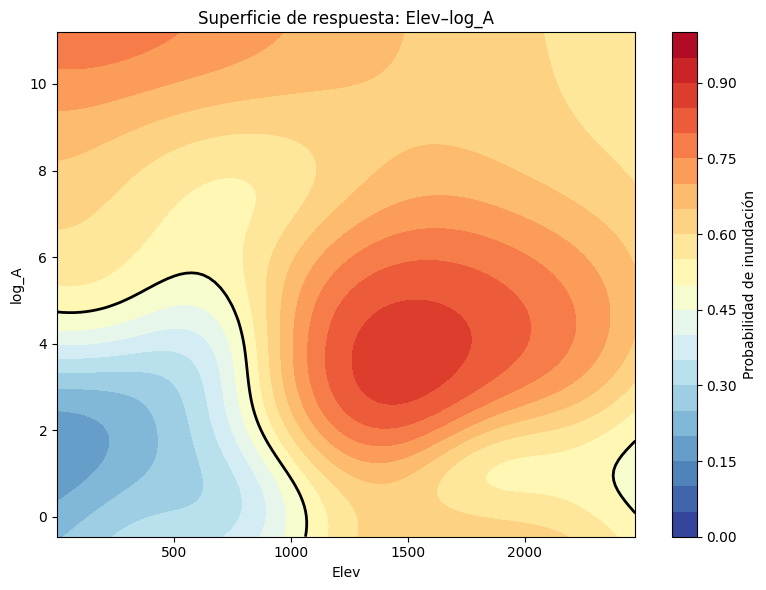

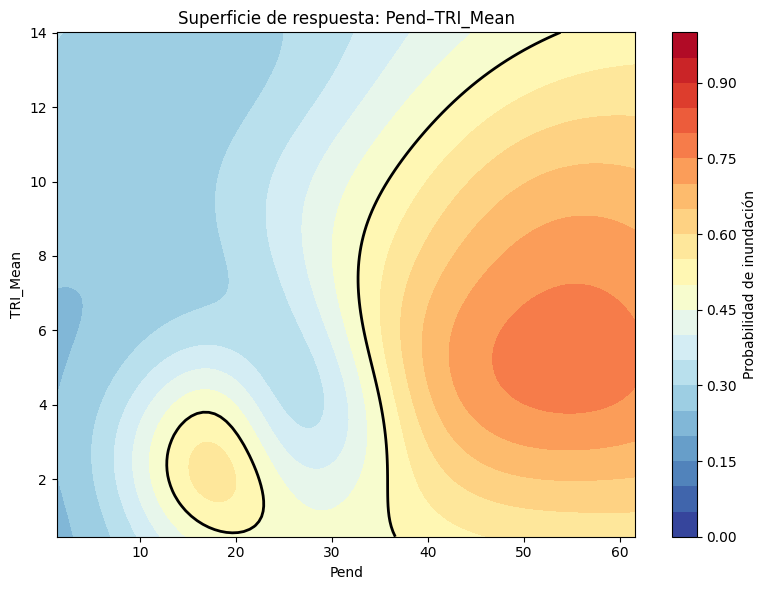

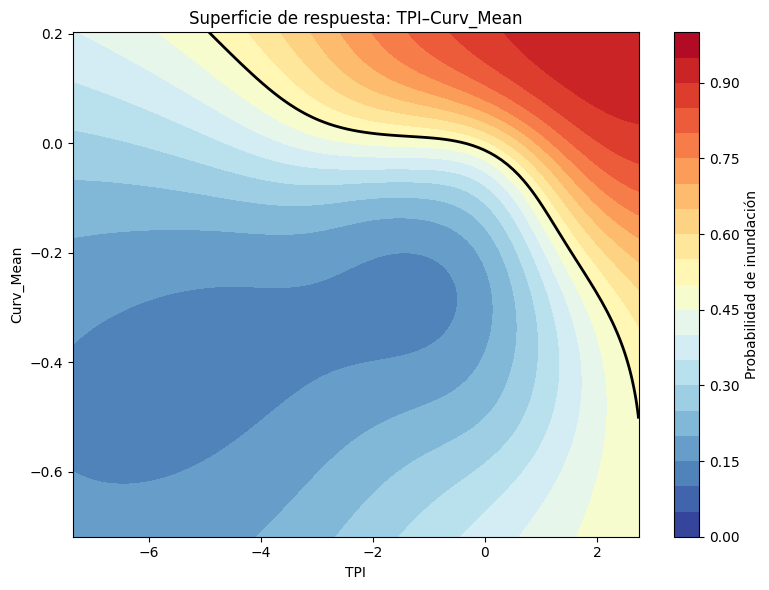

In [9]:
def superficie_gp(modelo, scaler, X, var, variable_x, variable_y, n=100):
    ix = var.index(variable_x)
    iy = var.index(variable_y)

    x_sc = scaler.transform(X[var])
    base = np.median(x_sc, axis=0)

    vx = np.linspace(
        np.percentile(x_sc[:, ix], 2),
        np.percentile(x_sc[:, ix], 98),
        n
    )
    vy = np.linspace(
        np.percentile(x_sc[:, iy], 2),
        np.percentile(x_sc[:, iy], 98),
        n
    )

    xx, yy = np.meshgrid(vx, vy)
    malla = np.tile(base, (xx.size, 1))
    malla[:, ix] = xx.ravel()
    malla[:, iy] = yy.ravel()

    prob = np.clip(
        modelo.predict_proba(malla)[:, 1],
        0,
        1
    ).reshape(xx.shape)

    valores_originales = scaler.inverse_transform(malla)
    xx_original = valores_originales[:, ix].reshape(xx.shape)
    yy_original = valores_originales[:, iy].reshape(yy.shape)

    plt.figure(figsize=(8, 6))
    contorno = plt.contourf(
        xx_original,
        yy_original,
        prob,
        levels=np.linspace(0, 1, 21),
        cmap="RdYlBu_r"
    )
    plt.contour(
        xx_original,
        yy_original,
        prob,
        levels=[0.5],
        colors="black",
        linewidths=2
    )
    plt.colorbar(contorno, label="Probabilidad de inundación")
    plt.xlabel(variable_x)
    plt.ylabel(variable_y)
    plt.title(f"Superficie de respuesta: {variable_x}–{variable_y}")
    plt.tight_layout()
    plt.show()

superficie_gp(
    mejor_modelo,
    scaler,
    X,
    var,
    "Elev",
    "log_A"
)

superficie_gp(
    mejor_modelo,
    scaler,
    X,
    var,
    "Pend",
    "TRI_Mean"
)

superficie_gp(
    mejor_modelo,
    scaler,
    X,
    var,
    "TPI",
    "Curv_Mean"
)

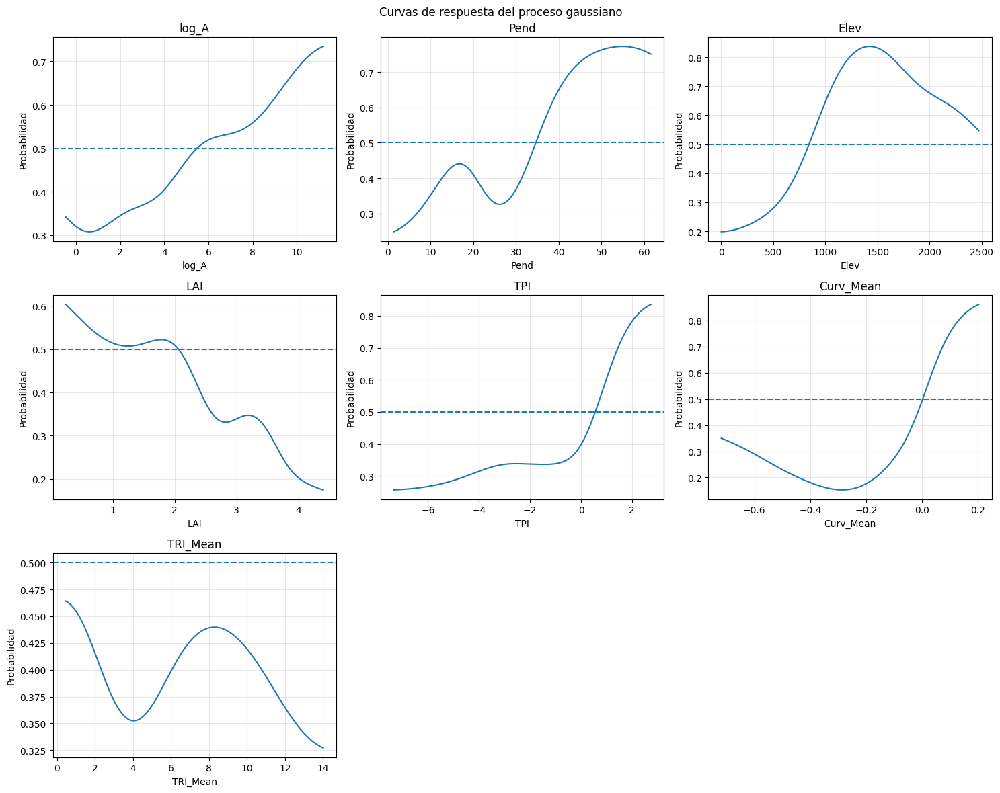

In [10]:
def curvas_respuesta_gp(modelo, scaler, X, var, n=150):
    X_sc = scaler.transform(X[var])
    base = np.median(X_sc, axis=0)

    n_cols = 3
    n_rows = int(np.ceil(len(var) / n_cols))

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(15, 4 * n_rows)
    )
    axes = np.asarray(axes).ravel()

    for j, variable in enumerate(var):
        valores = np.linspace(
            np.percentile(X_sc[:, j], 2),
            np.percentile(X_sc[:, j], 98),
            n
        )

        malla = np.tile(base, (n, 1))
        malla[:, j] = valores

        prob = np.clip(
            modelo.predict_proba(malla)[:, 1],
            0,
            1
        )

        valores_originales = scaler.inverse_transform(malla)[:, j]

        axes[j].plot(valores_originales, prob)
        axes[j].axhline(0.5, linestyle="--")
        axes[j].set_xlabel(variable)
        axes[j].set_ylabel("Probabilidad")
        axes[j].set_title(variable)
        axes[j].grid(alpha=0.3)

    for j in range(len(var), len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Curvas de respuesta del proceso gaussiano")
    plt.tight_layout()
    plt.show()

curvas_respuesta_gp(
    mejor_modelo,
    scaler,
    X,
    var
)

Área de la cuenca

La curva de log_A presenta una relación predominantemente creciente. Para áreas pequeñas, la probabilidad estimada se mantiene alrededor de 0,30–0,40; posteriormente aumenta y supera 0,5 aproximadamente cuando:

log(A)≈5.5

A partir de allí, la probabilidad continúa aumentando hasta valores cercanos a 0,74.

Esto sugiere que, manteniendo constantes las demás variables, las cuencas de mayor tamaño se asocian con una mayor probabilidad de ocurrencia de inundaciones. Físicamente puede relacionarse con una mayor superficie de captación y una mayor capacidad para generar aportes acumulados.

Sin embargo, el eje está en escala logarítmica. Para interpretarlo en unidades originales:

A=e
log(A)

Por ejemplo:

e
5.5
≈245

La unidad dependerá de la variable original Area.

Pendiente media

La respuesta frente a la pendiente es claramente no lineal:

entre 0 y aproximadamente 18, la probabilidad aumenta de 0,25 a 0,44;
entre 18 y 27, disminuye hasta aproximadamente 0,33;
después de 30, aumenta rápidamente;
supera 0,5 alrededor de una pendiente de 34;
alcanza un máximo cercano a 0,76 entre 50 y 57.

Esto indica que el modelo no interpreta la pendiente mediante un efecto monotónico sencillo.

La elevación de la susceptibilidad para pendientes altas puede parecer contraintuitiva si se piensa exclusivamente en inundaciones de planicie. Puede deberse a que tus eventos están asociados a cuencas completas y no solamente al píxel donde ocurre la inundación. Una inundación puede localizarse en una zona baja, pero estar asociada con una cuenca de pendiente media alta que produce una respuesta hidrológica rápida.

También puede reflejar interacción con:

área de cuenca;
elevación;
TRI;
TPI;
curvatura.
Elevación

La elevación presenta una relación unimodal:

la probabilidad es baja en elevaciones cercanas a 0–500 m;
aumenta rápidamente entre aproximadamente 600 y 1.300 m;
alcanza un máximo próximo a 0,84 alrededor de 1.400 m;
posteriormente disminuye;
permanece por encima de 0,5 hasta aproximadamente 2.500 m.

Esto sugiere que el modelo identifica una franja altitudinal intermedia con mayor susceptibilidad.

No significa que la elevación por sí sola produzca inundaciones. Puede estar funcionando como una variable sintética que diferencia regiones fisiográficas, climáticas y geomorfológicas de Antioquia.

El descenso a elevaciones muy altas puede estar relacionado con:

menor acumulación de drenaje;
cuencas más pequeñas;
menor presencia de planicies;
pendientes fuertes;
menor concentración de eventos inventariados.
LAI

La relación con el LAI es predominantemente decreciente:

para valores bajos de LAI, la probabilidad está alrededor de 0,60;
cerca de LAI entre 1 y 2, se mantiene próxima a 0,50;
posteriormente disminuye con claridad;
para LAI superiores a 4, llega a valores cercanos a 0,20.

Según el modelo, una mayor cobertura vegetal se asocia con menor susceptibilidad de inundación.

Esta relación es físicamente coherente porque valores mayores de LAI pueden asociarse con:

mayor interceptación de lluvia;
mayor evapotranspiración;
mejor protección del suelo;
mayor infiltración;
menor generación rápida de escorrentía.

No obstante, LAI también puede estar correlacionado con cobertura del suelo, altitud y grado de intervención antrópica.

TPI

El TPI presenta una respuesta creciente, especialmente para valores positivos:

entre aproximadamente −7 y −2, la probabilidad aumenta lentamente de 0,26 a 0,34;
entre −2 y 0 permanece casi estable;
después de 0 aumenta con rapidez;
supera 0,5 aproximadamente cerca de TPI = 0,5;
alcanza valores superiores a 0,80 para TPI cercanos a 3.

Esto indica que valores positivos de TPI están asociados con mayor probabilidad en el modelo.

La interpretación debe hacerse con cuidado porque depende de cómo calculaste el TPI y de la escala de vecindad. En general:

TPI negativo: posiciones más bajas que el entorno;
TPI cercano a 0: superficies relativamente planas;
TPI positivo: posiciones elevadas respecto al entorno.

Para inundaciones, normalmente podría esperarse una asociación con valores negativos o cercanos a cero. Por tanto, este resultado merece revisión.

Puede explicarse por:

el TPI calculado sobre la cuenca y no sobre el sitio exacto;
la escala espacial de cálculo;
correlación con otras variables;
una convención de signo diferente;
presencia de eventos en zonas de transición de ladera–valle;
comportamiento no representativo cuando las demás variables permanecen fijas en la mediana.
Curvatura media

La curvatura presenta una relación fuertemente no lineal:

para valores cercanos a −0,7, la probabilidad es aproximadamente 0,35;
disminuye hasta un mínimo cercano a 0,15 alrededor de −0,3;
aumenta rápidamente desde aproximadamente −0,2;
supera 0,5 cerca de 0;
alcanza probabilidades superiores a 0,85 para valores positivos próximos a 0,2.

Según el modelo, las curvaturas positivas se relacionan con mayor susceptibilidad.

La interpretación física depende del tipo exacto de curvatura:

curvatura general;
curvatura de perfil;
curvatura en planta.

También depende de la convención de signos del software utilizado. Antes de interpretar como convergente o divergente, debes verificar qué representa el signo positivo en tu raster.

TRI medio

El TRI presenta variaciones moderadas y permanece por debajo de 0,5 en todo el rango mostrado:

comienza alrededor de 0,46;
disminuye hasta 0,35 cerca de TRI = 4;
aumenta hasta aproximadamente 0,44 alrededor de TRI = 8;
vuelve a disminuir hasta aproximadamente 0,33 para TRI = 14.

Esto indica que, cuando las demás variables están fijadas en sus medianas, el TRI por sí solo no lleva al modelo a clasificar una observación como inundación.

La curva muestra, sin embargo, una relación no lineal. El TRI puede contribuir mediante interacciones, aunque su efecto parcial individual sea limitado.

No significa que TRI no sea importante. Significa que:

P(inundaci
o
ˊ
n∣TRI,otras variables medianas)<0.5

en todo el rango evaluado.

Síntesis general

Las curvas sugieren que el proceso gaussiano aprendió relaciones claramente no lineales:

Área: efecto creciente.
Pendiente: respuesta no monotónica con incremento fuerte en valores altos.
Elevación: máximo en altitudes intermedias.
LAI: efecto predominantemente decreciente.
TPI: incremento marcado para valores positivos.
Curvatura: incremento fuerte hacia valores positivos.
TRI: efecto parcial moderado y no monotónico.

Las variables que, bajo este escenario de referencia, muestran cambios más fuertes en la probabilidad son:

Elevaci
o
ˊ
n, TPI, Curvatura, Pendiente

Mientras que TRI presenta una influencia parcial menor.

Precaución metodológica importante

Estas curvas mantienen todas las demás variables en la mediana. Si existen combinaciones poco frecuentes o físicamente imposibles, el modelo puede estar prediciendo sobre regiones del espacio multivariado con pocos datos.

Por ejemplo, una combinación como:

pendiente muy alta;
elevación media;
área mediana;
TPI mediano;
LAI mediano;

puede no ser común en tu base real.

Por eso estas curvas deben complementarse con:

histogramas o marcas de distribución sobre el eje;
curvas ICE;
superficies bivariadas;
importancia por permutación.

Una mejora muy recomendable sería agregar pequeñas marcas sobre el eje x que indiquen dónde realmente existen observaciones. Así podrías distinguir las zonas respaldadas por datos de aquellas donde la curva es principalmente extrapolación.

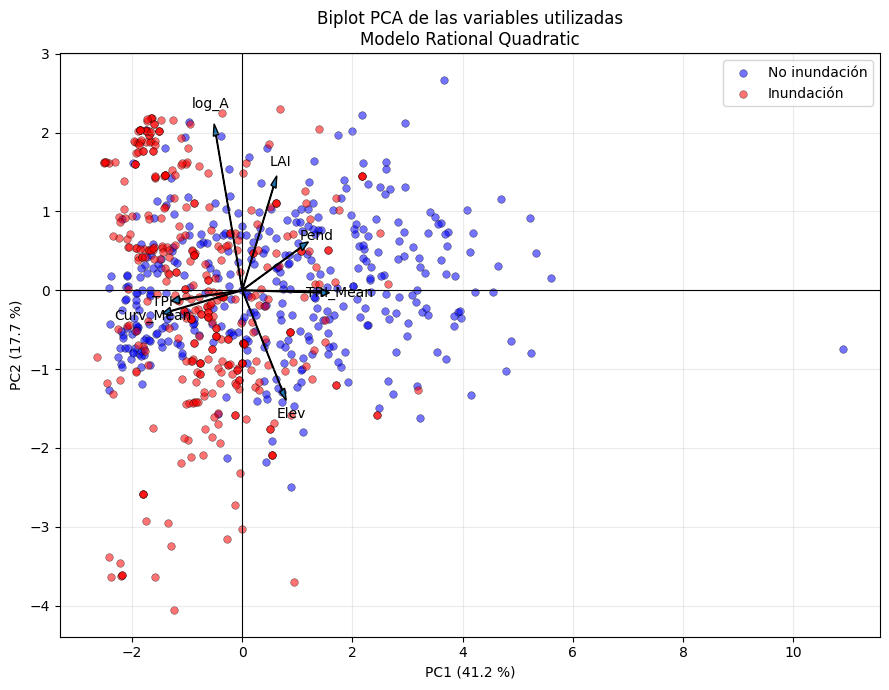

In [12]:
escala_vectores = 3.0

plt.figure(figsize=(9, 7))

plt.scatter(
    X_test_pca[y_test_array == 0, 0],
    X_test_pca[y_test_array == 0, 1],
    c="blue",
    edgecolor="black",
    linewidth=0.4,
    s=30,
    alpha=0.55,
    label="No inundación"
)

plt.scatter(
    X_test_pca[y_test_array == 1, 0],
    X_test_pca[y_test_array == 1, 1],
    c="red",
    edgecolor="black",
    linewidth=0.4,
    s=30,
    alpha=0.55,
    label="Inundación"
)

for variable in var:

    x_vector = cargas.loc[variable, "PC1"] * escala_vectores
    y_vector = cargas.loc[variable, "PC2"] * escala_vectores

    plt.arrow(
        0,
        0,
        x_vector,
        y_vector,
        width=0.01,
        head_width=0.10,
        length_includes_head=True
    )

    plt.text(
        x_vector * 1.12,
        y_vector * 1.12,
        variable,
        ha="center",
        va="center"
    )

plt.axhline(0, color="black", linewidth=0.8)
plt.axvline(0, color="black", linewidth=0.8)

plt.xlabel(
    f"PC1 ({pca.explained_variance_ratio_[0] * 100:.1f} %)"
)

plt.ylabel(
    f"PC2 ({pca.explained_variance_ratio_[1] * 100:.1f} %)"
)

plt.title(
    "Biplot PCA de las variables utilizadas\n"
    "Modelo Rational Quadratic"
)

plt.legend()
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

C:\Users\juand\AppData\Local\Temp\ipykernel_29508\1552648838.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 0.95])


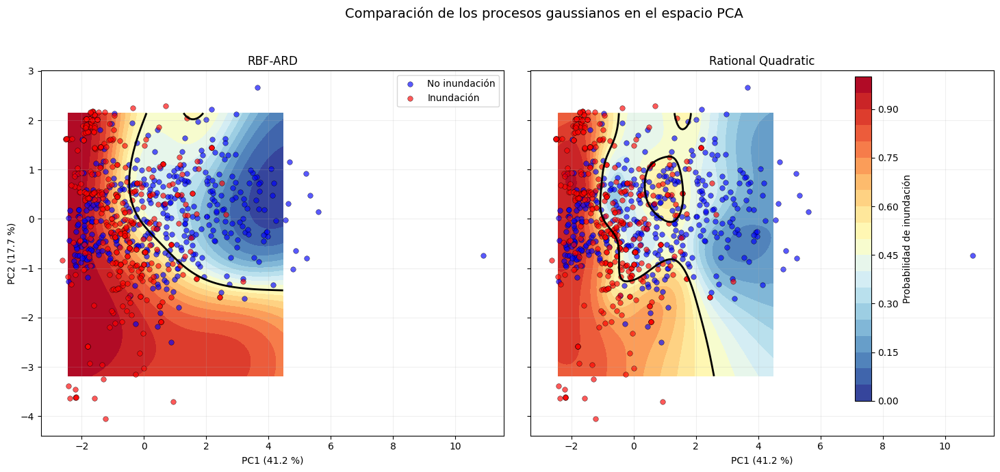


Varianza explicada:
Componente  Varianza  Porcentaje
       PC1    0.4116     41.1563
       PC2    0.1770     17.6961

Varianza acumulada PC1 + PC2: 58.85 %

Cargas de los componentes principales:
             PC1    PC2
log_A     -0.171  0.704
Pend       0.400  0.204
Elev       0.266 -0.466
LAI        0.209  0.484
TPI       -0.430 -0.045
Curv_Mean -0.483 -0.099
TRI_Mean   0.527 -0.011


In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

modelos_pca = {
    "RBF-ARD": modelos["RBF-ARD"],
    "Rational Quadratic": modelos["Rational Quadratic"]
}

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

pc1 = np.linspace(
    np.percentile(X_train_pca[:, 0], 1),
    np.percentile(X_train_pca[:, 0], 99),
    120
)

pc2 = np.linspace(
    np.percentile(X_train_pca[:, 1], 1),
    np.percentile(X_train_pca[:, 1], 99),
    120
)

xx, yy = np.meshgrid(pc1, pc2)
malla_pca = np.column_stack([xx.ravel(), yy.ravel()])
malla_original = pca.inverse_transform(malla_pca)

probabilidades_malla = {}

for nombre, modelo in modelos_pca.items():
    probabilidades_malla[nombre] = np.clip(
        modelo.predict_proba(malla_original)[:, 1],
        0,
        1
    ).reshape(xx.shape)

y_test_array = y_test.to_numpy()

fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 7),
    sharex=True,
    sharey=True
)

for ax, (nombre, prob_malla) in zip(
    axes,
    probabilidades_malla.items()
):

    contorno = ax.contourf(
        xx,
        yy,
        prob_malla,
        levels=np.linspace(0, 1, 21),
        cmap="RdYlBu_r",
        vmin=0,
        vmax=1
    )

    ax.contour(
        xx,
        yy,
        prob_malla,
        levels=[0.5],
        colors="black",
        linewidths=2
    )

    ax.scatter(
        X_test_pca[y_test_array == 0, 0],
        X_test_pca[y_test_array == 0, 1],
        c="blue",
        edgecolor="black",
        linewidth=0.4,
        s=30,
        alpha=0.65,
        label="No inundación"
    )

    ax.scatter(
        X_test_pca[y_test_array == 1, 0],
        X_test_pca[y_test_array == 1, 1],
        c="red",
        edgecolor="black",
        linewidth=0.4,
        s=30,
        alpha=0.65,
        label="Inundación"
    )

    ax.set_title(nombre)
    ax.set_xlabel(
        f"PC1 "
        f"({pca.explained_variance_ratio_[0] * 100:.1f} %)"
    )
    ax.grid(alpha=0.2)

axes[0].set_ylabel(
    f"PC2 "
    f"({pca.explained_variance_ratio_[1] * 100:.1f} %)"
)

axes[0].legend()

cbar = fig.colorbar(
    contorno,
    ax=axes,
    shrink=0.88,
    pad=0.02
)

cbar.set_label("Probabilidad de inundación")

fig.suptitle(
    "Comparación de los procesos gaussianos en el espacio PCA",
    fontsize=14
)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

cargas = pd.DataFrame(
    pca.components_.T,
    index=var,
    columns=["PC1", "PC2"]
)

varianza = pd.DataFrame({
    "Componente": ["PC1", "PC2"],
    "Varianza": pca.explained_variance_ratio_,
    "Porcentaje": pca.explained_variance_ratio_ * 100
})

print("\nVarianza explicada:")
print(varianza.round(4).to_string(index=False))

print(
    "\nVarianza acumulada PC1 + PC2:",
    f"{pca.explained_variance_ratio_.sum() * 100:.2f} %"
)

print("\nCargas de los componentes principales:")
print(cargas.round(3))


OPTIMIZANDO: RBF isotrópico

Kernel optimizado:
5.35**2 * RBF(length_scale=2.4)

Log-verosimilitud marginal:
-580.9597

OPTIMIZANDO: RBF anisotrópico

Kernel optimizado:
5.82**2 * RBF(length_scale=[1.81, 3.84, 1.63, 4.96, 3.26, 2.56, 2.84])

Log-verosimilitud marginal:
-574.9313

OPTIMIZANDO: Rational Quadratic

Kernel optimizado:
16.2**2 * RationalQuadratic(alpha=0.0235, length_scale=2.18)

Log-verosimilitud marginal:
-565.7505

OPTIMIZANDO: Matérn 0.5

Kernel optimizado:
12.4**2 * Matern(length_scale=14.6, nu=0.5)

Log-verosimilitud marginal:
-558.584

OPTIMIZANDO: Matérn 1.5

Kernel optimizado:
6.43**2 * Matern(length_scale=3.84, nu=1.5)

Log-verosimilitud marginal:
-570.2184

OPTIMIZANDO: Matérn 2.5

Kernel optimizado:
5.81**2 * Matern(length_scale=3.22, nu=2.5)

Log-verosimilitud marginal:
-575.1683

RESULTADOS DE CALIBRACIÓN Y VALIDACIÓN
            Kernel    Conjunto       LML    AUC     AP  Accuracy  Precisión  Sensibilidad  Especificidad     F1     R2    MAE   RMSE  Brier  Lo

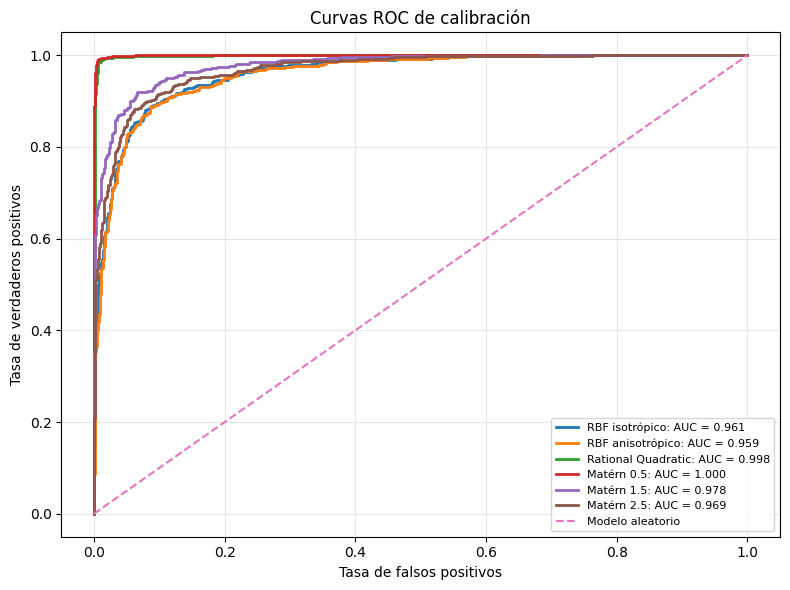

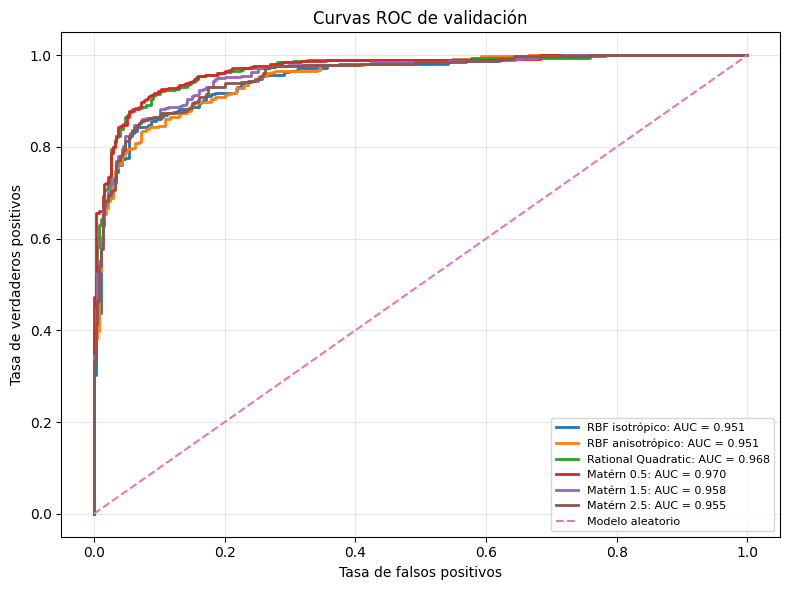

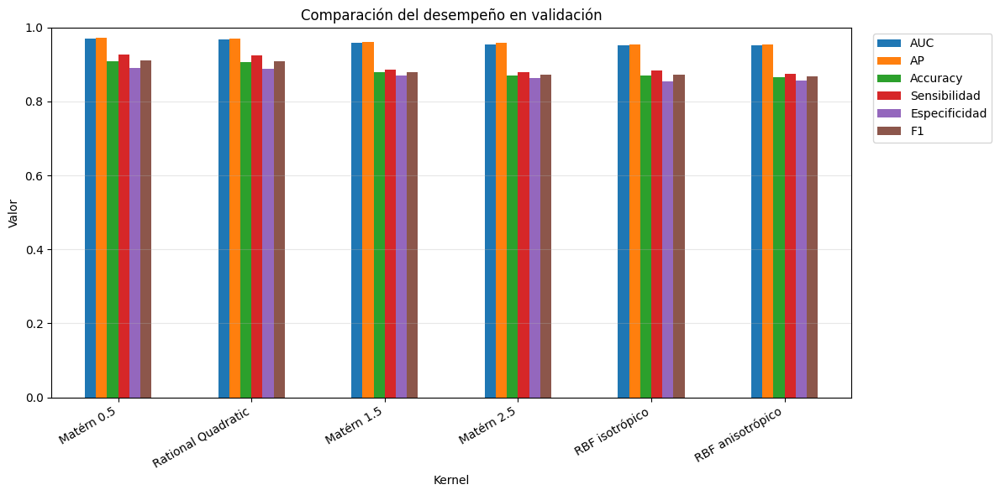

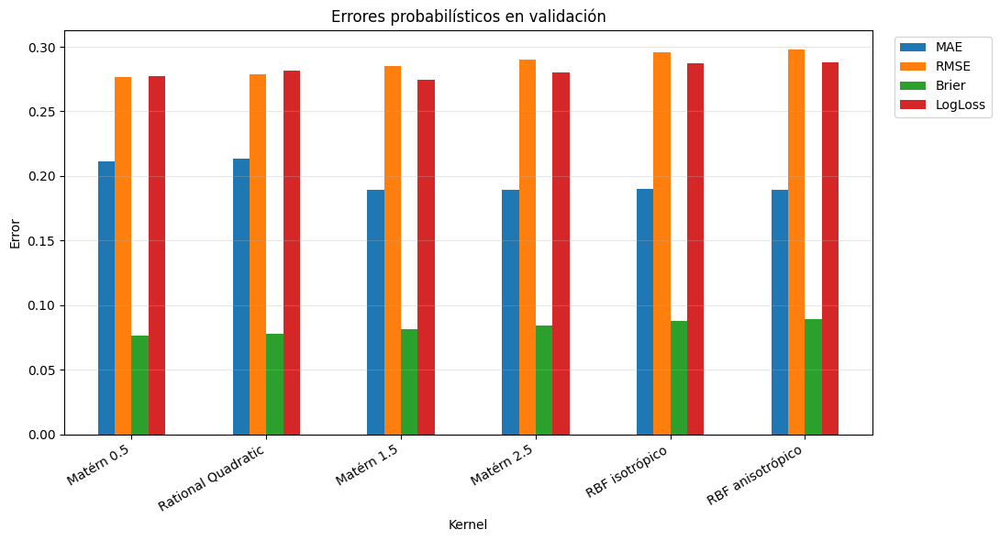

In [5]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import (
    ConstantKernel,
    RBF,
    RationalQuadratic,
    Matern
)
from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    log_loss,
    brier_score_loss,
    r2_score,
    mean_absolute_error,
    mean_squared_error
)

# ============================================================
# 1. CARGAR Y PREPARAR DATOS
# ============================================================

ruta_shape = (
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial"
    r"\Data\Puntos\Eventos_y_ausencias_V1.shp"
)

gdf = gpd.read_file(ruta_shape)
gdf["log_A"] = np.log(gdf["Area"].where(gdf["Area"] > 0))

variables = [
    "log_A",
    "Pend",
    "Elev",
    "LAI",
    "TPI",
    "Curv_Mean",
    "TRI_Mean"
]

datos = (
    gdf[["Inund"] + variables]
    .replace([-9999, np.inf, -np.inf], np.nan)
    .dropna()
)

X = datos[variables]
y = datos["Inund"].astype(int)

X_cal, X_val, y_cal, y_val = train_test_split(
    X,
    y,
    test_size=0.30,
    stratify=y,
    random_state=42
)

scaler = StandardScaler()
X_cal_sc = scaler.fit_transform(X_cal)
X_val_sc = scaler.transform(X_val)

n_variables = len(variables)

# ============================================================
# 2. KERNELS CON HIPERPARÁMETROS LIBRES
# ============================================================

C = lambda: ConstantKernel(
    constant_value=1.0,
    constant_value_bounds=(1e-3, 1e4)
)

kernels = {
    "RBF isotrópico": C() * RBF(
        length_scale=1.0,
        length_scale_bounds=(1e-2, 1e2)
    ),

    "RBF anisotrópico": C() * RBF(
        length_scale=np.ones(n_variables),
        length_scale_bounds=(1e-2, 1e2)
    ),

    "Rational Quadratic": C() * RationalQuadratic(
        length_scale=1.0,
        alpha=1.0,
        length_scale_bounds=(1e-2, 1e2),
        alpha_bounds=(1e-2, 1e2)
    ),

    "Matérn 0.5": C() * Matern(
        length_scale=1.0,
        length_scale_bounds=(1e-3, 1e4),
        nu=0.5
    ),

    "Matérn 1.5": C() * Matern(
        length_scale=1.0,
        length_scale_bounds=(1e-2, 1e2),
        nu=1.5
    ),

    "Matérn 2.5": C() * Matern(
        length_scale=1.0,
        length_scale_bounds=(1e-2, 1e2),
        nu=2.5
    )
}

# ============================================================
# 3. FUNCIÓN DE MÉTRICAS
# ============================================================

def calcular_metricas(y_real, probabilidad):
    probabilidad = np.clip(
        np.asarray(probabilidad, dtype=float),
        1e-15,
        1 - 1e-15
    )

    prediccion = (probabilidad >= 0.5).astype(int)

    tn, fp, fn, tp = confusion_matrix(
        y_real,
        prediccion
    ).ravel()

    return {
        "AUC": roc_auc_score(y_real, probabilidad),
        "AP": average_precision_score(y_real, probabilidad),
        "Accuracy": accuracy_score(y_real, prediccion),
        "Precisión": precision_score(
            y_real,
            prediccion,
            zero_division=0
        ),
        "Sensibilidad": recall_score(
            y_real,
            prediccion,
            zero_division=0
        ),
        "Especificidad": tn / (tn + fp),
        "F1": f1_score(
            y_real,
            prediccion,
            zero_division=0
        ),
        "R2": r2_score(y_real, probabilidad),
        "MAE": mean_absolute_error(y_real, probabilidad),
        "RMSE": np.sqrt(
            mean_squared_error(y_real, probabilidad)
        ),
        "Brier": brier_score_loss(y_real, probabilidad),
        "LogLoss": log_loss(
            y_real,
            probabilidad,
            labels=[0, 1]
        )
    }

# ============================================================
# 4. OPTIMIZACIÓN Y EVALUACIÓN
# ============================================================

modelos = {}
probabilidades = {}
resultados = []

for nombre, kernel in kernels.items():

    print("\n" + "=" * 75)
    print(f"OPTIMIZANDO: {nombre}")
    print("=" * 75)

    modelo = GaussianProcessClassifier(
        kernel=kernel,
        optimizer="fmin_l_bfgs_b",
        n_restarts_optimizer=3,
        max_iter_predict=100,
        warm_start=False,
        random_state=42
    )

    modelo.fit(X_cal_sc, y_cal)

    prob_cal = modelo.predict_proba(X_cal_sc)[:, 1]
    prob_val = modelo.predict_proba(X_val_sc)[:, 1]

    metricas_cal = calcular_metricas(y_cal, prob_cal)
    metricas_val = calcular_metricas(y_val, prob_val)

    modelos[nombre] = modelo

    probabilidades[nombre] = {
        "Calibración": prob_cal,
        "Validación": prob_val
    }

    print("\nKernel optimizado:")
    print(modelo.kernel_)

    print("\nLog-verosimilitud marginal:")
    print(round(modelo.log_marginal_likelihood_value_, 4))

    for conjunto, metricas in [
        ("Calibración", metricas_cal),
        ("Validación", metricas_val)
    ]:
        fila = {
            "Kernel": nombre,
            "Conjunto": conjunto,
            "LML": modelo.log_marginal_likelihood_value_
        }

        fila.update(metricas)
        resultados.append(fila)

# ============================================================
# 5. TABLA COMPLETA
# ============================================================

resultados = pd.DataFrame(resultados)

columnas = [
    "Kernel",
    "Conjunto",
    "LML",
    "AUC",
    "AP",
    "Accuracy",
    "Precisión",
    "Sensibilidad",
    "Especificidad",
    "F1",
    "R2",
    "MAE",
    "RMSE",
    "Brier",
    "LogLoss"
]

resultados = resultados[columnas]

print("\n" + "=" * 100)
print("RESULTADOS DE CALIBRACIÓN Y VALIDACIÓN")
print("=" * 100)
print(resultados.round(4).to_string(index=False))

# ============================================================
# 6. COMPARACIÓN EXCLUSIVA DE VALIDACIÓN
# ============================================================

validacion = (
    resultados[resultados["Conjunto"] == "Validación"]
    .sort_values(
        ["AUC", "Brier", "LogLoss"],
        ascending=[False, True, True]
    )
    .reset_index(drop=True)
)

print("\n" + "=" * 100)
print("CLASIFICACIÓN DE LOS KERNELS EN VALIDACIÓN")
print("=" * 100)
print(validacion.round(4).to_string(index=False))

mejor_kernel = validacion.loc[0, "Kernel"]

print(f"\nMejor kernel según AUC de validación: {mejor_kernel}")
print(modelos[mejor_kernel].kernel_)

# ============================================================
# 7. CURVAS ROC DE CALIBRACIÓN
# ============================================================

plt.figure(figsize=(8, 6))

for nombre in kernels:
    prob = probabilidades[nombre]["Calibración"]
    fpr, tpr, _ = roc_curve(y_cal, prob)
    auc = roc_auc_score(y_cal, prob)

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"{nombre}: AUC = {auc:.3f}"
    )

plt.plot(
    [0, 1],
    [0, 1],
    "--",
    label="Modelo aleatorio"
)

plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC de calibración")
plt.legend(fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# 8. CURVAS ROC DE VALIDACIÓN
# ============================================================

plt.figure(figsize=(8, 6))

for nombre in kernels:
    prob = probabilidades[nombre]["Validación"]
    fpr, tpr, _ = roc_curve(y_val, prob)
    auc = roc_auc_score(y_val, prob)

    plt.plot(
        fpr,
        tpr,
        linewidth=2,
        label=f"{nombre}: AUC = {auc:.3f}"
    )

plt.plot(
    [0, 1],
    [0, 1],
    "--",
    label="Modelo aleatorio"
)

plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")
plt.title("Curvas ROC de validación")
plt.legend(fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# 9. COMPARACIÓN GRÁFICA DE MÉTRICAS DE VALIDACIÓN
# ============================================================

metricas_grafica = validacion[
    [
        "Kernel",
        "AUC",
        "AP",
        "Accuracy",
        "Sensibilidad",
        "Especificidad",
        "F1"
    ]
].set_index("Kernel")

metricas_grafica.plot(
    kind="bar",
    figsize=(12, 6)
)

plt.ylim(0, 1)
plt.xlabel("Kernel")
plt.ylabel("Valor")
plt.title("Comparación del desempeño en validación")
plt.xticks(rotation=30, ha="right")
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================================
# 10. ERRORES PROBABILÍSTICOS EN VALIDACIÓN
# ============================================================

errores = validacion[
    [
        "Kernel",
        "MAE",
        "RMSE",
        "Brier",
        "LogLoss"
    ]
].set_index("Kernel")

errores.plot(
    kind="bar",
    figsize=(11, 6)
)

plt.xlabel("Kernel")
plt.ylabel("Error")
plt.title("Errores probabilísticos en validación")
plt.xticks(rotation=30, ha="right")
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


INDICADORES DE SOBREAJUSTE
            Delta_AUC  Delta_AP  Delta_Accuracy  Delta_F1  Aumento_Brier  Aumento_LogLoss  Caida_relativa_Accuracy_%  Indice_sobreajuste
Kernel                                                                                                                                  
Matérn 0.5     0.0295    0.0264          0.0824    0.0806         0.0431           0.1044                     8.3139              0.2576

RESULTADOS DE CALIBRACIÓN Y VALIDACIÓN
    Kernel    Conjunto      LML    AUC     AP  Accuracy  Precisión  Sensibilidad  Especificidad     F1     R2    MAE   RMSE  Brier  LogLoss
Matérn 0.5 Calibración -558.584 0.9995 0.9995    0.9915     0.9910        0.9921         0.9909 0.9916 0.8667 0.1515 0.1825 0.0333   0.1729
Matérn 0.5  Validación -558.584 0.9700 0.9731    0.9091     0.8959        0.9265         0.8915 0.9110 0.6944 0.2112 0.2764 0.0764   0.2773

CLASIFICACIÓN DE LOS KERNELS EN VALIDACIÓN
    Kernel   Conjunto      LML  AUC     AP  Accuracy  Pre

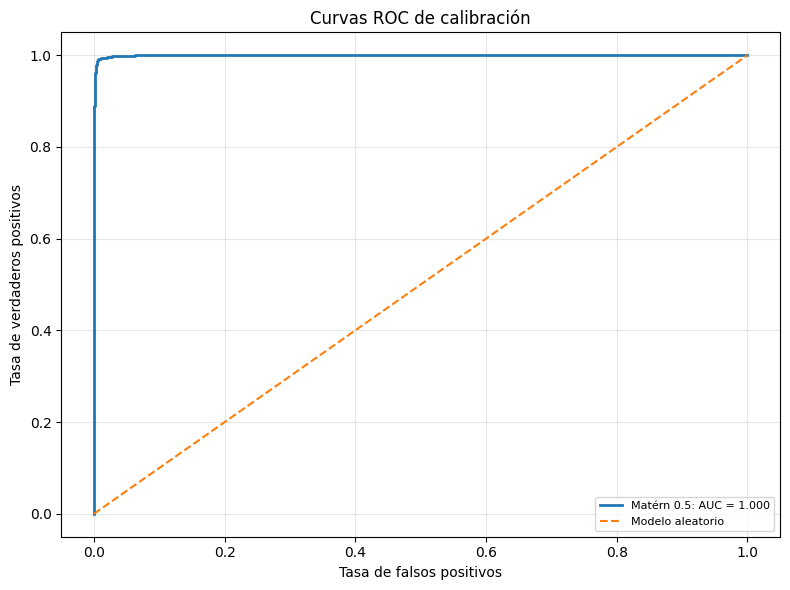

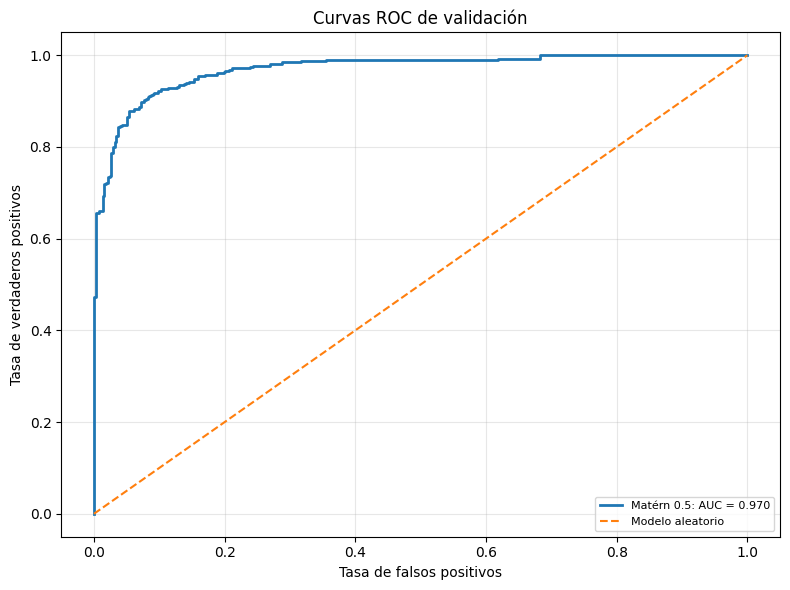

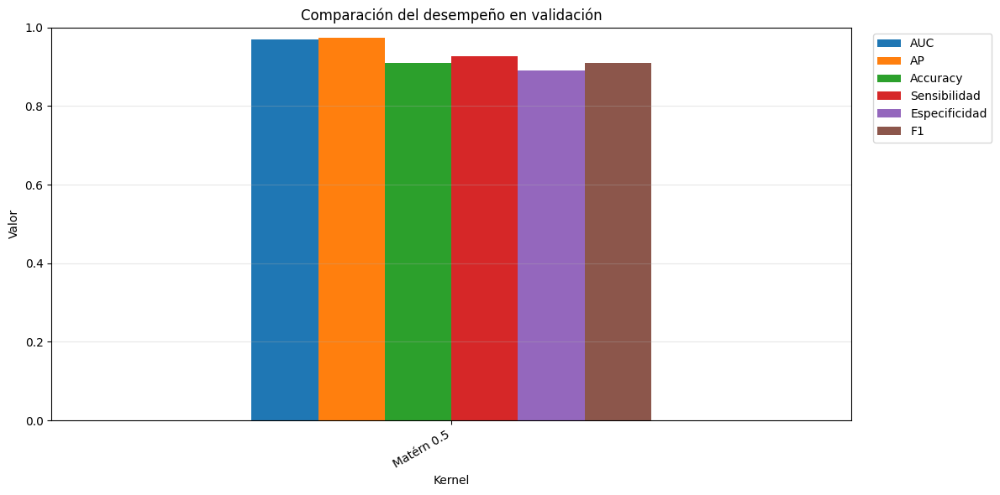

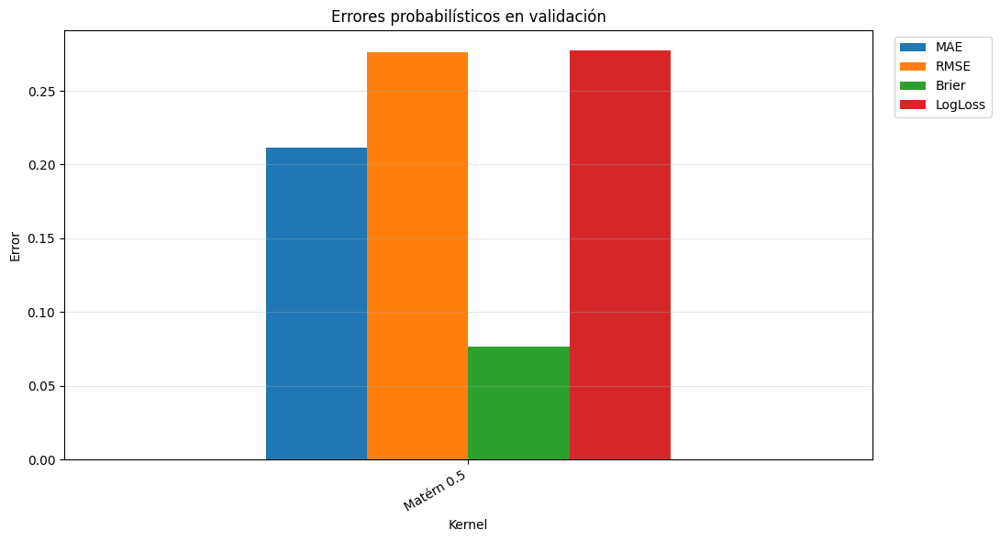


Número total de observaciones: 2529
No inundación: 1259
Inundación: 1270

EVALUANDO: Rational Quadratic
Fold 01 | AUC cal=0.999 | AUC val=0.957 | Gap=0.042
Fold 02 | AUC cal=0.998 | AUC val=0.970 | Gap=0.029
Fold 03 | AUC cal=0.998 | AUC val=0.969 | Gap=0.029
Fold 04 | AUC cal=0.999 | AUC val=0.967 | Gap=0.032
Fold 05 | AUC cal=0.998 | AUC val=0.954 | Gap=0.044
Fold 06 | AUC cal=0.998 | AUC val=0.973 | Gap=0.026
Fold 07 | AUC cal=0.998 | AUC val=0.975 | Gap=0.023
Fold 08 | AUC cal=0.998 | AUC val=0.964 | Gap=0.034
Fold 09 | AUC cal=0.999 | AUC val=0.948 | Gap=0.051
Fold 10 | AUC cal=0.998 | AUC val=0.962 | Gap=0.036
Fold 11 | AUC cal=0.998 | AUC val=0.968 | Gap=0.031
Fold 12 | AUC cal=0.998 | AUC val=0.963 | Gap=0.035
Fold 13 | AUC cal=0.998 | AUC val=0.956 | Gap=0.042
Fold 14 | AUC cal=0.999 | AUC val=0.963 | Gap=0.036
Fold 15 | AUC cal=0.999 | AUC val=0.965 | Gap=0.034
Fold 16 | AUC cal=0.998 | AUC val=0.968 | Gap=0.030
Fold 17 | AUC cal=0.999 | AUC val=0.949 | Gap=0.050
Fold 18 | A

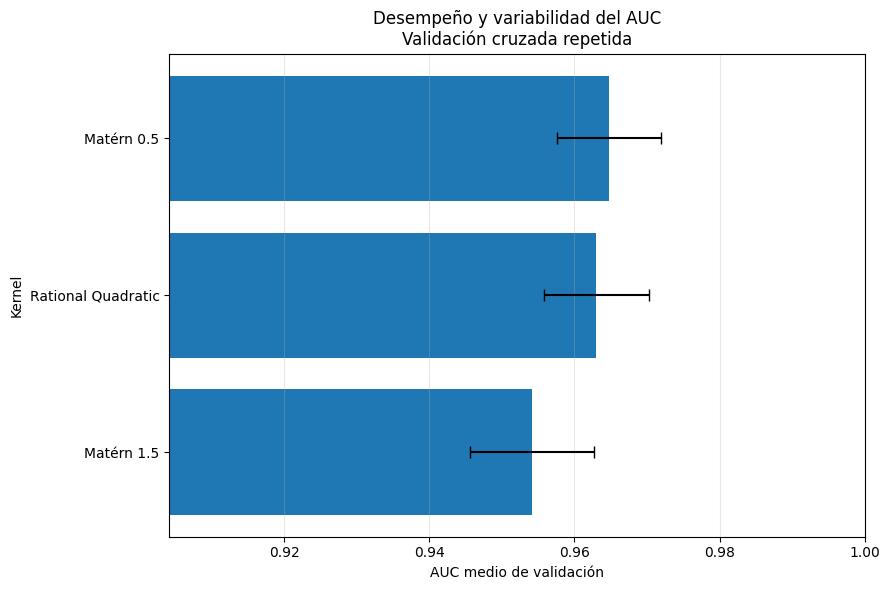

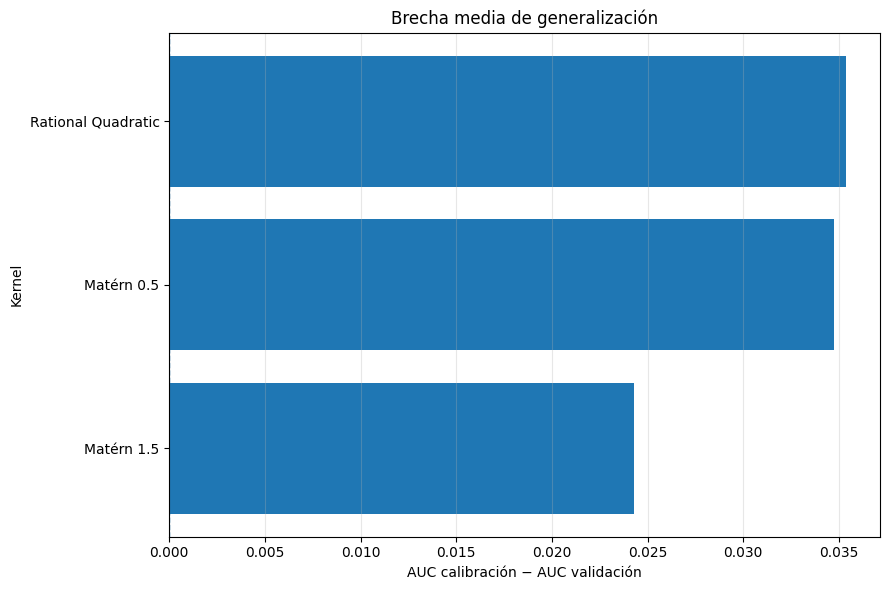

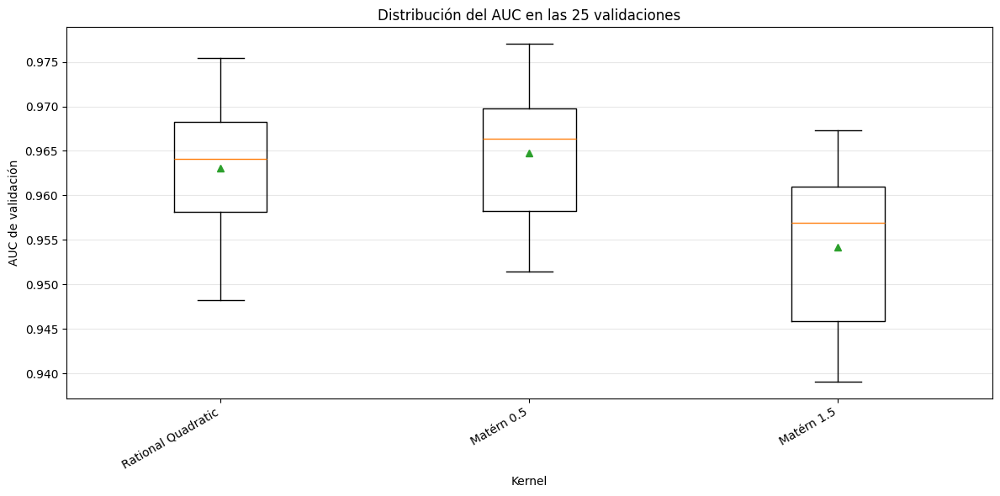

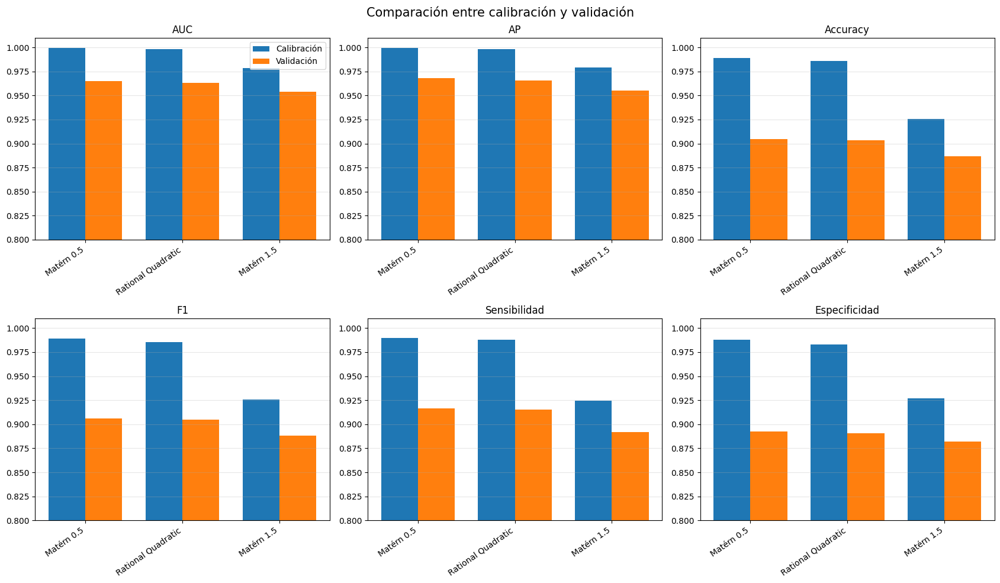

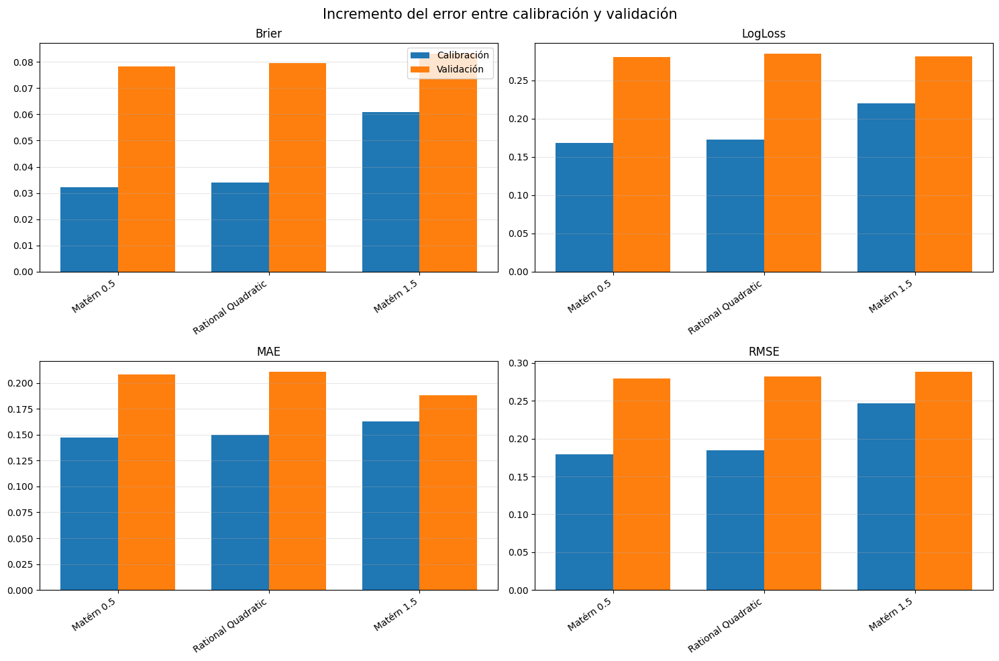

...

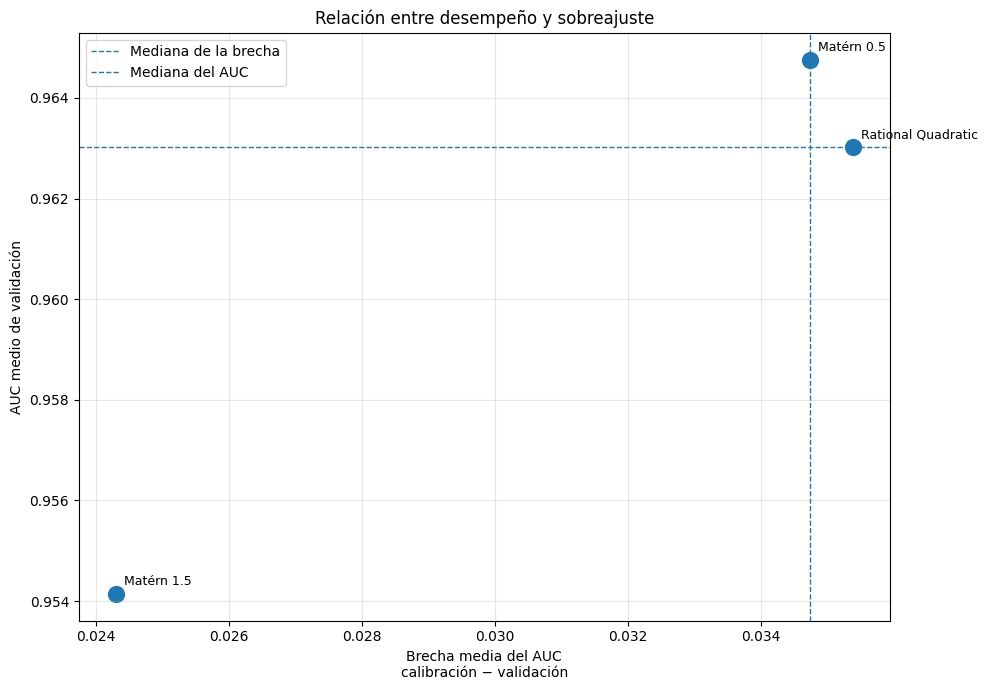

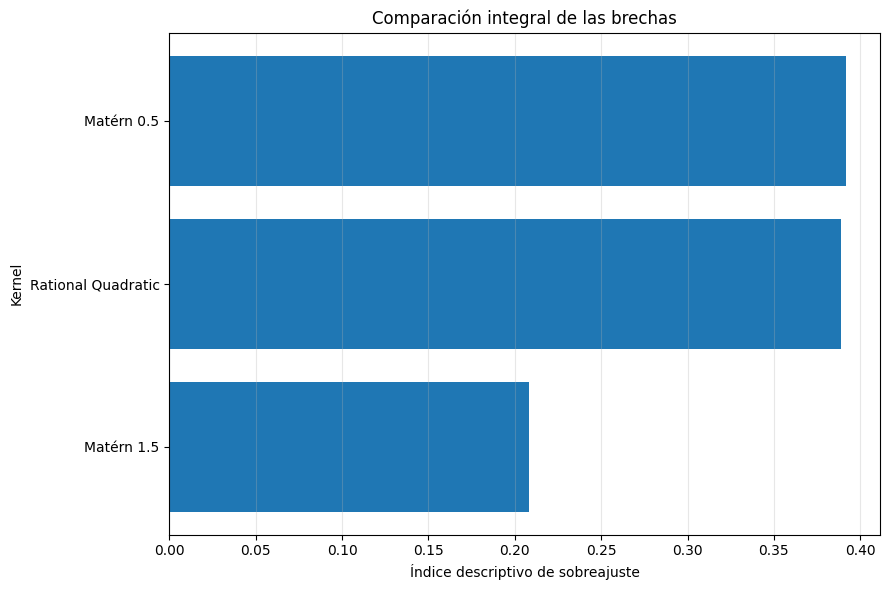

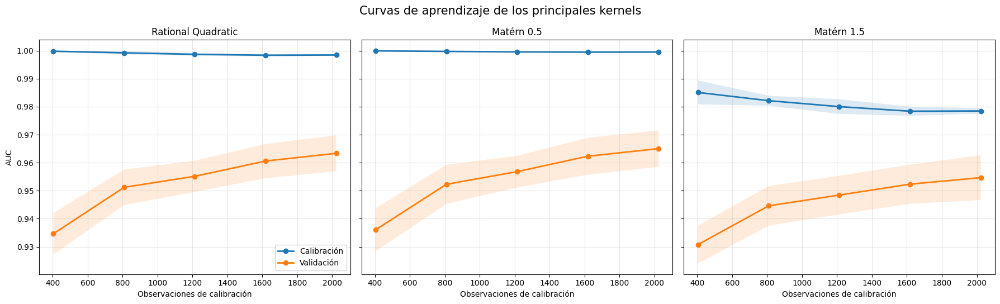

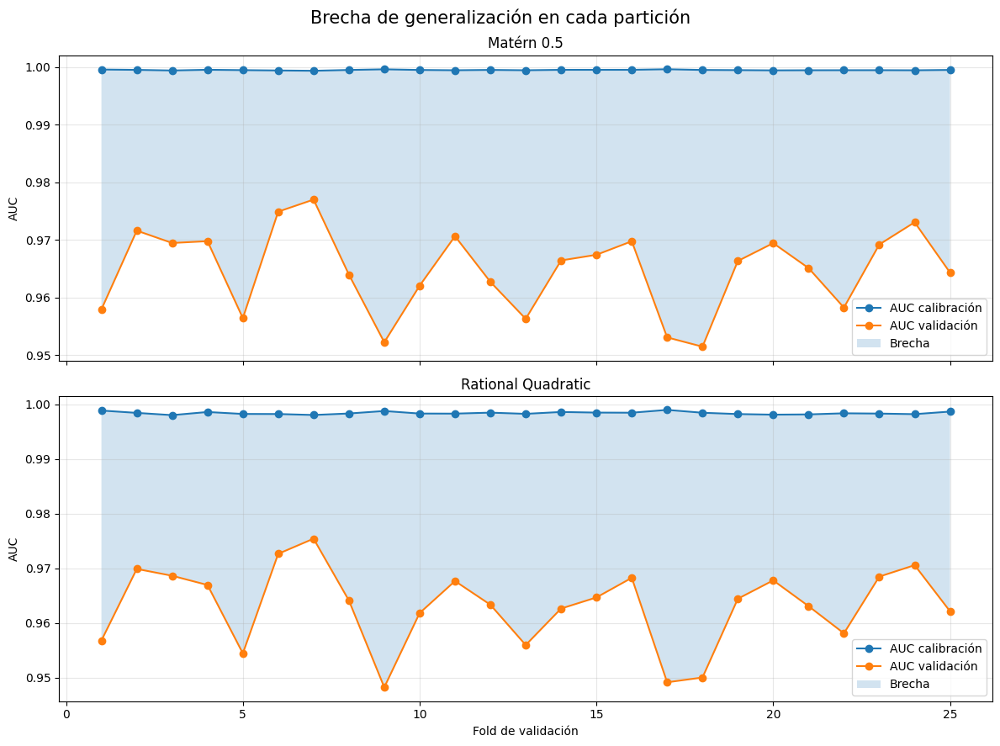

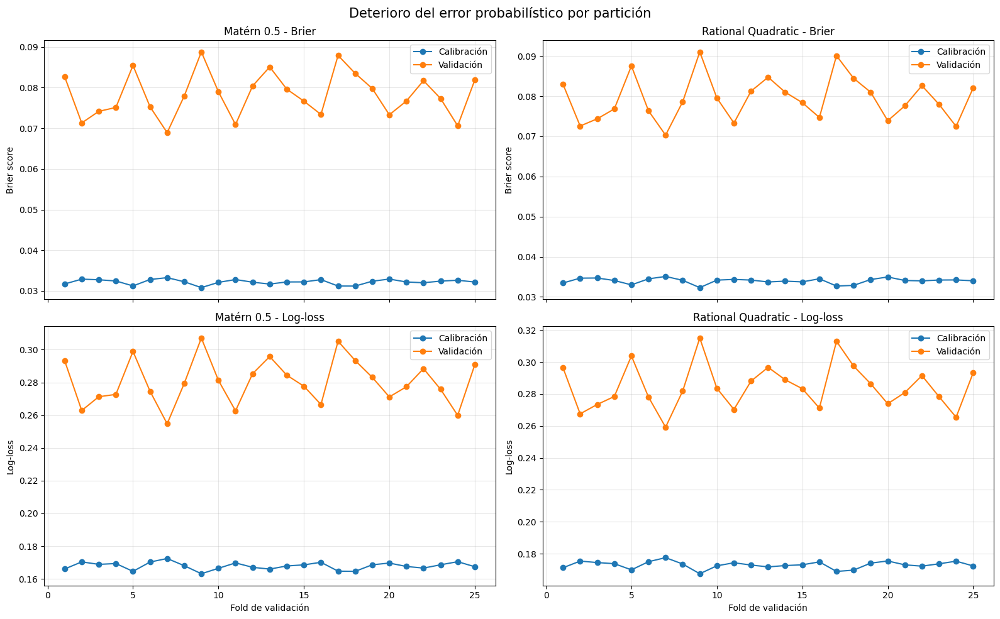


Archivos exportados correctamente:
resultados_cv_kernels.csv
resumen_cv_kernels.csv
ranking_cv_kernels.csv


In [8]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import (
    RepeatedStratifiedKFold,
    StratifiedKFold,
    learning_curve
)
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import (
    ConstantKernel,
    RBF,
    RationalQuadratic,
    Matern
)
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    brier_score_loss,
    log_loss,
    r2_score,
    mean_absolute_error,
    mean_squared_error
)

# ============================================================
# 1. CARGAR Y PREPARAR DATOS
# ============================================================

ruta_shape = (
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial"
    r"\Data\Puntos\Eventos_y_ausencias_V1.shp"
)

gdf = gpd.read_file(ruta_shape)

gdf["log_A"] = np.log(
    gdf["Area"].where(gdf["Area"] > 0)
)

variables = [
    "log_A",
    "Pend",
    "Elev",
    "LAI",
    "TPI",
    "Curv_Mean",
    "TRI_Mean"
]

datos = (
    gdf[["Inund"] + variables]
    .replace([-9999, np.inf, -np.inf], np.nan)
    .dropna()
)

X = datos[variables].to_numpy()
y = datos["Inund"].astype(int).to_numpy()

print("\nNúmero total de observaciones:", len(y))
print("No inundación:", np.sum(y == 0))
print("Inundación:", np.sum(y == 1))

# ============================================================
# 2. KERNELS CON HIPERPARÁMETROS OPTIMIZADOS FIJOS
# ============================================================

kernels = {
    "Rational Quadratic": ConstantKernel(
        constant_value=16.2**2,
        constant_value_bounds="fixed"
    ) * RationalQuadratic(
        alpha=0.0235,
        length_scale=2.18,
        alpha_bounds="fixed",
        length_scale_bounds="fixed"
    ),

    "Matérn 0.5": ConstantKernel(
        constant_value=12.4**2,
        constant_value_bounds="fixed"
    ) * Matern(
        length_scale=14.6,
        length_scale_bounds="fixed",
        nu=0.5
    ),

    "Matérn 1.5": ConstantKernel(
        constant_value=6.43**2,
        constant_value_bounds="fixed"
    ) * Matern(
        length_scale=3.84,
        length_scale_bounds="fixed",
        nu=1.5
    )
}

# ============================================================
# 3. FUNCIÓN PARA CALCULAR MÉTRICAS
# ============================================================

def calcular_metricas(y_real, prob):
    prob = np.clip(
        np.asarray(prob, dtype=float),
        1e-15,
        1 - 1e-15
    )

    pred = (prob >= 0.5).astype(int)

    tn, fp, fn, tp = confusion_matrix(
        y_real,
        pred
    ).ravel()

    return {
        "AUC": roc_auc_score(y_real, prob),
        "AP": average_precision_score(y_real, prob),
        "Accuracy": accuracy_score(y_real, pred),
        "Precision": precision_score(
            y_real,
            pred,
            zero_division=0
        ),
        "Sensibilidad": recall_score(
            y_real,
            pred,
            zero_division=0
        ),
        "Especificidad": (
            tn / (tn + fp)
            if (tn + fp) > 0
            else np.nan
        ),
        "F1": f1_score(
            y_real,
            pred,
            zero_division=0
        ),
        "R2": r2_score(y_real, prob),
        "MAE": mean_absolute_error(y_real, prob),
        "RMSE": np.sqrt(
            mean_squared_error(y_real, prob)
        ),
        "Brier": brier_score_loss(y_real, prob),
        "LogLoss": log_loss(
            y_real,
            prob,
            labels=[0, 1]
        )
    }

# ============================================================
# 4. VALIDACIÓN CRUZADA ESTRATIFICADA REPETIDA
# ============================================================

cv = RepeatedStratifiedKFold(
    n_splits=5,
    n_repeats=5,
    random_state=42
)

resultados = []

for nombre, kernel in kernels.items():

    print("\n" + "=" * 75)
    print(f"EVALUANDO: {nombre}")
    print("=" * 75)

    for fold, (idx_cal, idx_val) in enumerate(
        cv.split(X, y),
        start=1
    ):

        X_cal = X[idx_cal]
        X_val = X[idx_val]
        y_cal = y[idx_cal]
        y_val = y[idx_val]

        scaler = StandardScaler()

        X_cal_sc = scaler.fit_transform(X_cal)
        X_val_sc = scaler.transform(X_val)

        modelo = GaussianProcessClassifier(
            kernel=kernel,
            optimizer=None,
            max_iter_predict=100,
            warm_start=False,
            random_state=42
        )

        modelo.fit(X_cal_sc, y_cal)

        prob_cal = modelo.predict_proba(
            X_cal_sc
        )[:, 1]

        prob_val = modelo.predict_proba(
            X_val_sc
        )[:, 1]

        met_cal = calcular_metricas(
            y_cal,
            prob_cal
        )

        met_val = calcular_metricas(
            y_val,
            prob_val
        )

        fila = {
            "Kernel": nombre,
            "Fold": fold
        }

        for metrica in met_cal:

            fila[f"{metrica}_cal"] = (
                met_cal[metrica]
            )

            fila[f"{metrica}_val"] = (
                met_val[metrica]
            )

            if metrica in [
                "AUC",
                "AP",
                "Accuracy",
                "Precision",
                "Sensibilidad",
                "Especificidad",
                "F1",
                "R2"
            ]:

                fila[f"Gap_{metrica}"] = (
                    met_cal[metrica]
                    - met_val[metrica]
                )

            else:

                fila[f"Gap_{metrica}"] = (
                    met_val[metrica]
                    - met_cal[metrica]
                )

        resultados.append(fila)

        print(
            f"Fold {fold:02d} | "
            f"AUC cal={met_cal['AUC']:.3f} | "
            f"AUC val={met_val['AUC']:.3f} | "
            f"Gap={met_cal['AUC'] - met_val['AUC']:.3f}"
        )

resultados = pd.DataFrame(resultados)

# ============================================================
# 5. RESUMEN DE MÉTRICAS
# ============================================================

metricas = [
    "AUC",
    "AP",
    "Accuracy",
    "Precision",
    "Sensibilidad",
    "Especificidad",
    "F1",
    "R2",
    "MAE",
    "RMSE",
    "Brier",
    "LogLoss"
]

filas_resumen = []

for nombre in kernels:

    sub = resultados[
        resultados["Kernel"] == nombre
    ]

    fila = {
        "Kernel": nombre
    }

    for metrica in metricas:

        fila[f"{metrica}_cal_media"] = (
            sub[f"{metrica}_cal"].mean()
        )

        fila[f"{metrica}_cal_std"] = (
            sub[f"{metrica}_cal"].std()
        )

        fila[f"{metrica}_val_media"] = (
            sub[f"{metrica}_val"].mean()
        )

        fila[f"{metrica}_val_std"] = (
            sub[f"{metrica}_val"].std()
        )

        fila[f"Gap_{metrica}_media"] = (
            sub[f"Gap_{metrica}"].mean()
        )

        fila[f"Gap_{metrica}_std"] = (
            sub[f"Gap_{metrica}"].std()
        )

    filas_resumen.append(fila)

resumen = pd.DataFrame(filas_resumen)

# ============================================================
# 6. ÍNDICES DESCRIPTIVOS DE SOBREAJUSTE
# ============================================================

resumen["Indice_sobreajuste"] = (
    resumen["Gap_AUC_media"].clip(lower=0)
    + resumen["Gap_AP_media"].clip(lower=0)
    + resumen["Gap_Accuracy_media"].clip(lower=0)
    + resumen["Gap_F1_media"].clip(lower=0)
    + resumen["Gap_Brier_media"].clip(lower=0)
    + resumen["Gap_LogLoss_media"].clip(lower=0)
)

resumen["Caida_AUC_%"] = (
    100
    * (
        resumen["AUC_cal_media"]
        - resumen["AUC_val_media"]
    )
    / resumen["AUC_cal_media"]
)

resumen["Caida_AP_%"] = (
    100
    * (
        resumen["AP_cal_media"]
        - resumen["AP_val_media"]
    )
    / resumen["AP_cal_media"]
)

resumen["Caida_Accuracy_%"] = (
    100
    * (
        resumen["Accuracy_cal_media"]
        - resumen["Accuracy_val_media"]
    )
    / resumen["Accuracy_cal_media"]
)

resumen["Caida_F1_%"] = (
    100
    * (
        resumen["F1_cal_media"]
        - resumen["F1_val_media"]
    )
    / resumen["F1_cal_media"]
)

resumen["Aumento_Brier_%"] = (
    100
    * (
        resumen["Brier_val_media"]
        - resumen["Brier_cal_media"]
    )
    / resumen["Brier_cal_media"]
)

resumen["Aumento_LogLoss_%"] = (
    100
    * (
        resumen["LogLoss_val_media"]
        - resumen["LogLoss_cal_media"]
    )
    / resumen["LogLoss_cal_media"]
)

resumen["AUC_ajustado"] = (
    resumen["AUC_val_media"]
    - resumen["AUC_val_std"]
    - resumen["Gap_AUC_media"].clip(lower=0)
)

resumen = resumen.sort_values(
    [
        "AUC_val_media",
        "Indice_sobreajuste"
    ],
    ascending=[
        False,
        True
    ]
).reset_index(drop=True)

# ============================================================
# 7. TABLA RESUMIDA
# ============================================================

columnas_resumen = [
    "Kernel",
    "AUC_cal_media",
    "AUC_val_media",
    "AUC_val_std",
    "Gap_AUC_media",
    "AP_val_media",
    "Accuracy_val_media",
    "F1_val_media",
    "Sensibilidad_val_media",
    "Especificidad_val_media",
    "Brier_val_media",
    "LogLoss_val_media",
    "Gap_Brier_media",
    "Gap_LogLoss_media",
    "Caida_AUC_%",
    "Caida_Accuracy_%",
    "Caida_F1_%",
    "Indice_sobreajuste",
    "AUC_ajustado"
]

print("\n" + "=" * 140)
print("RESUMEN DE DESEMPEÑO, ESTABILIDAD Y SOBREAJUSTE")
print("=" * 140)

print(
    resumen[columnas_resumen]
    .round(4)
    .to_string(index=False)
)

# ============================================================
# 8. RANKING CON PENALIZACIÓN POR SOBREAJUSTE
# ============================================================

ranking = resumen.sort_values(
    [
        "AUC_ajustado",
        "Brier_val_media"
    ],
    ascending=[
        False,
        True
    ]
).reset_index(drop=True)

print("\n" + "=" * 120)
print("RANKING CON PENALIZACIÓN POR VARIABILIDAD Y SOBREAJUSTE")
print("=" * 120)

print(
    ranking[
        [
            "Kernel",
            "AUC_val_media",
            "AUC_val_std",
            "Gap_AUC_media",
            "Brier_val_media",
            "Indice_sobreajuste",
            "AUC_ajustado"
        ]
    ]
    .round(4)
    .to_string(index=False)
)

print(
    "\nMejor modelo según AUC ajustado:",
    ranking.loc[0, "Kernel"]
)

# ============================================================
# 9. AUC MEDIO Y VARIABILIDAD
# ============================================================

orden_auc = resumen.sort_values(
    "AUC_val_media",
    ascending=True
)

plt.figure(figsize=(9, 6))

plt.barh(
    orden_auc["Kernel"],
    orden_auc["AUC_val_media"],
    xerr=orden_auc["AUC_val_std"],
    capsize=4
)

plt.xlabel("AUC medio de validación")
plt.ylabel("Kernel")
plt.title(
    "Desempeño y variabilidad del AUC\n"
    "Validación cruzada repetida"
)

plt.xlim(
    max(
        0.5,
        orden_auc["AUC_val_media"].min() - 0.05
    ),
    1
)

plt.grid(
    axis="x",
    alpha=0.3
)

plt.tight_layout()
plt.show()

# ============================================================
# 10. BRECHA MEDIA DEL AUC
# ============================================================

orden_gap = resumen.sort_values(
    "Gap_AUC_media",
    ascending=True
)

plt.figure(figsize=(9, 6))

plt.barh(
    orden_gap["Kernel"],
    orden_gap["Gap_AUC_media"]
)

plt.axvline(
    0,
    linestyle="--",
    linewidth=1
)

plt.xlabel(
    "AUC calibración − AUC validación"
)

plt.ylabel("Kernel")

plt.title(
    "Brecha media de generalización"
)

plt.grid(
    axis="x",
    alpha=0.3
)

plt.tight_layout()
plt.show()

# ============================================================
# 11. DISTRIBUCIÓN DEL AUC EN LOS 25 FOLDS
# ============================================================

datos_boxplot = [
    resultados.loc[
        resultados["Kernel"] == nombre,
        "AUC_val"
    ].to_numpy()
    for nombre in kernels
]

plt.figure(figsize=(12, 6))

plt.boxplot(
    datos_boxplot,
    tick_labels=list(kernels.keys()),
    showmeans=True
)

plt.ylabel("AUC de validación")
plt.xlabel("Kernel")

plt.title(
    "Distribución del AUC en las 25 validaciones"
)

plt.xticks(
    rotation=30,
    ha="right"
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()
plt.show()

# ============================================================
# 12. CALIBRACIÓN VS VALIDACIÓN
# ============================================================

metricas_altas = [
    "AUC",
    "AP",
    "Accuracy",
    "F1",
    "Sensibilidad",
    "Especificidad"
]

fig, axes = plt.subplots(
    2,
    3,
    figsize=(17, 10)
)

axes = axes.ravel()

x = np.arange(
    len(resumen)
)

ancho = 0.38

for ax, metrica in zip(
    axes,
    metricas_altas
):

    ax.bar(
        x - ancho / 2,
        resumen[f"{metrica}_cal_media"],
        width=ancho,
        label="Calibración"
    )

    ax.bar(
        x + ancho / 2,
        resumen[f"{metrica}_val_media"],
        width=ancho,
        label="Validación"
    )

    ax.set_title(metrica)

    ax.set_xticks(x)

    ax.set_xticklabels(
        resumen["Kernel"],
        rotation=35,
        ha="right"
    )

    ax.set_ylim(
        0.80,
        1.01
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )

axes[0].legend()

fig.suptitle(
    "Comparación entre calibración y validación",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ============================================================
# 13. ERRORES DE CALIBRACIÓN VS VALIDACIÓN
# ============================================================

metricas_error = [
    "Brier",
    "LogLoss",
    "MAE",
    "RMSE"
]

fig, axes = plt.subplots(
    2,
    2,
    figsize=(15, 10)
)

axes = axes.ravel()

for ax, metrica in zip(
    axes,
    metricas_error
):

    ax.bar(
        x - ancho / 2,
        resumen[f"{metrica}_cal_media"],
        width=ancho,
        label="Calibración"
    )

    ax.bar(
        x + ancho / 2,
        resumen[f"{metrica}_val_media"],
        width=ancho,
        label="Validación"
    )

    ax.set_title(metrica)

    ax.set_xticks(x)

    ax.set_xticklabels(
        resumen["Kernel"],
        rotation=35,
        ha="right"
    )

    ax.grid(
        axis="y",
        alpha=0.3
    )

axes[0].legend()

fig.suptitle(
    "Incremento del error entre calibración y validación",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ============================================================
# 14. MAPA DE CALOR DE BRECHAS
# ============================================================

columnas_gap = [
    "Gap_AUC_media",
    "Gap_AP_media",
    "Gap_Accuracy_media",
    "Gap_F1_media",
    "Gap_Brier_media",
    "Gap_LogLoss_media"
]

nombres_gap = [
    "Δ AUC",
    "Δ AP",
    "Δ Accuracy",
    "Δ F1",
    "Aumento Brier",
    "Aumento Log-loss"
]

tabla_gap = resumen[
    ["Kernel"] + columnas_gap
].set_index("Kernel")

tabla_gap.columns = nombres_gap

plt.figure(figsize=(12, 6))

sns.heatmap(
    tabla_gap,
    annot=True,
    fmt=".3f",
    cmap="YlOrRd",
    linewidths=0.5,
    cbar_kws={
        "label": "Brecha calibración–validación"
    }
)

plt.title(
    "Indicadores de sobreajuste por kernel"
)

plt.xlabel("Indicador")
plt.ylabel("Kernel")

plt.tight_layout()
plt.show()

# ============================================================
# 15. CAÍDA RELATIVA DEL DESEMPEÑO
# ============================================================

caidas = resumen[
    [
        "Kernel",
        "Caida_AUC_%",
        "Caida_AP_%",
        "Caida_Accuracy_%",
        "Caida_F1_%"
    ]
].set_index("Kernel")

caidas.columns = [
    "AUC",
    "AP",
    "Accuracy",
    "F1"
]

caidas.plot(
    kind="bar",
    figsize=(13, 6)
)

plt.axhline(
    0,
    linestyle="--",
    linewidth=1
)

plt.ylabel("Caída relativa (%)")
plt.xlabel("Kernel")

plt.title(
    "Reducción relativa del desempeño en validación"
)

plt.xticks(
    rotation=30,
    ha="right"
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.legend(
    title="Métrica"
)

plt.tight_layout()
plt.show()

# ============================================================
# 16. AUMENTO RELATIVO DE ERRORES
# ============================================================

aumento_errores = resumen[
    [
        "Kernel",
        "Aumento_Brier_%",
        "Aumento_LogLoss_%"
    ]
].set_index("Kernel")

aumento_errores.columns = [
    "Brier",
    "Log-loss"
]

aumento_errores.plot(
    kind="bar",
    figsize=(12, 6)
)

plt.axhline(
    0,
    linestyle="--",
    linewidth=1
)

plt.ylabel("Aumento relativo del error (%)")
plt.xlabel("Kernel")

plt.title(
    "Incremento relativo del error probabilístico"
)

plt.xticks(
    rotation=30,
    ha="right"
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()
plt.show()

# ============================================================
# 17. DESEMPEÑO VS SOBREAJUSTE
# ============================================================

plt.figure(figsize=(10, 7))

plt.scatter(
    resumen["Gap_AUC_media"],
    resumen["AUC_val_media"],
    s=130
)

for _, fila in resumen.iterrows():

    plt.annotate(
        fila["Kernel"],
        (
            fila["Gap_AUC_media"],
            fila["AUC_val_media"]
        ),
        xytext=(6, 6),
        textcoords="offset points",
        fontsize=9
    )

plt.axvline(
    resumen["Gap_AUC_media"].median(),
    linestyle="--",
    linewidth=1,
    label="Mediana de la brecha"
)

plt.axhline(
    resumen["AUC_val_media"].median(),
    linestyle="--",
    linewidth=1,
    label="Mediana del AUC"
)

plt.xlabel(
    "Brecha media del AUC\n"
    "calibración − validación"
)

plt.ylabel(
    "AUC medio de validación"
)

plt.title(
    "Relación entre desempeño y sobreajuste"
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# 18. ÍNDICE DESCRIPTIVO DE SOBREAJUSTE
# ============================================================

orden_indice = resumen.sort_values(
    "Indice_sobreajuste",
    ascending=True
)

plt.figure(figsize=(9, 6))

plt.barh(
    orden_indice["Kernel"],
    orden_indice["Indice_sobreajuste"]
)

plt.xlabel(
    "Índice descriptivo de sobreajuste"
)

plt.ylabel("Kernel")

plt.title(
    "Comparación integral de las brechas"
)

plt.grid(
    axis="x",
    alpha=0.3
)

plt.tight_layout()
plt.show()

# ============================================================
# 19. CURVAS DE APRENDIZAJE
# ============================================================

kernels_aprendizaje = {
    "Rational Quadratic": kernels[
        "Rational Quadratic"
    ],
    "Matérn 0.5": kernels[
        "Matérn 0.5"
    ],
    "Matérn 1.5": kernels[
        "Matérn 1.5"
    ]
}

cv_aprendizaje = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

fracciones = np.linspace(
    0.20,
    1.00,
    5
)

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 5.5),
    sharey=True
)

for ax, (nombre, kernel) in zip(
    axes,
    kernels_aprendizaje.items()
):

    pipeline = Pipeline([
        (
            "scaler",
            StandardScaler()
        ),
        (
            "gpc",
            GaussianProcessClassifier(
                kernel=kernel,
                optimizer=None,
                max_iter_predict=100,
                warm_start=False,
                random_state=42
            )
        )
    ])

    tamanos, score_cal, score_val = learning_curve(
        pipeline,
        X,
        y,
        train_sizes=fracciones,
        cv=cv_aprendizaje,
        scoring="roc_auc",
        shuffle=True,
        random_state=42,
        n_jobs=1
    )

    media_cal = score_cal.mean(axis=1)
    std_cal = score_cal.std(axis=1)

    media_val = score_val.mean(axis=1)
    std_val = score_val.std(axis=1)

    ax.plot(
        tamanos,
        media_cal,
        marker="o",
        linewidth=2,
        label="Calibración"
    )

    ax.fill_between(
        tamanos,
        media_cal - std_cal,
        media_cal + std_cal,
        alpha=0.15
    )

    ax.plot(
        tamanos,
        media_val,
        marker="o",
        linewidth=2,
        label="Validación"
    )

    ax.fill_between(
        tamanos,
        media_val - std_val,
        media_val + std_val,
        alpha=0.15
    )

    ax.set_title(nombre)

    ax.set_xlabel(
        "Observaciones de calibración"
    )

    ax.grid(alpha=0.3)

axes[0].set_ylabel("AUC")
axes[0].legend()

fig.suptitle(
    "Curvas de aprendizaje de los principales kernels",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ============================================================
# 20. BRECHA POR FOLD PARA MATÉRN 0.5 Y RATIONAL QUADRATIC
# ============================================================

modelos_principales = [
    "Matérn 0.5",
    "Rational Quadratic"
]

fig, axes = plt.subplots(
    2,
    1,
    figsize=(12, 9),
    sharex=True
)

for ax, nombre in zip(
    axes,
    modelos_principales
):

    sub = resultados[
        resultados["Kernel"] == nombre
    ].copy()

    ax.plot(
        sub["Fold"],
        sub["AUC_cal"],
        marker="o",
        label="AUC calibración"
    )

    ax.plot(
        sub["Fold"],
        sub["AUC_val"],
        marker="o",
        label="AUC validación"
    )

    ax.fill_between(
        sub["Fold"],
        sub["AUC_val"],
        sub["AUC_cal"],
        alpha=0.20,
        label="Brecha"
    )

    ax.set_title(nombre)
    ax.set_ylabel("AUC")
    ax.grid(alpha=0.3)
    ax.legend()

axes[-1].set_xlabel(
    "Fold de validación"
)

fig.suptitle(
    "Brecha de generalización en cada partición",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ============================================================
# 21. BRIER Y LOG-LOSS POR FOLD
# ============================================================

fig, axes = plt.subplots(
    2,
    2,
    figsize=(16, 10),
    sharex=True
)

for columna, nombre in enumerate(
    modelos_principales
):

    sub = resultados[
        resultados["Kernel"] == nombre
    ].copy()

    axes[0, columna].plot(
        sub["Fold"],
        sub["Brier_cal"],
        marker="o",
        label="Calibración"
    )

    axes[0, columna].plot(
        sub["Fold"],
        sub["Brier_val"],
        marker="o",
        label="Validación"
    )

    axes[0, columna].set_title(
        f"{nombre} - Brier"
    )

    axes[0, columna].set_ylabel(
        "Brier score"
    )

    axes[0, columna].grid(
        alpha=0.3
    )

    axes[0, columna].legend()

    axes[1, columna].plot(
        sub["Fold"],
        sub["LogLoss_cal"],
        marker="o",
        label="Calibración"
    )

    axes[1, columna].plot(
        sub["Fold"],
        sub["LogLoss_val"],
        marker="o",
        label="Validación"
    )

    axes[1, columna].set_title(
        f"{nombre} - Log-loss"
    )

    axes[1, columna].set_xlabel(
        "Fold de validación"
    )

    axes[1, columna].set_ylabel(
        "Log-loss"
    )

    axes[1, columna].grid(
        alpha=0.3
    )

    axes[1, columna].legend()

fig.suptitle(
    "Deterioro del error probabilístico por partición",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ============================================================
# 22. EXPORTAR RESULTADOS
# ============================================================

resultados.to_csv(
    "resultados_cv_kernels.csv",
    index=False
)

resumen.to_csv(
    "resumen_cv_kernels.csv",
    index=False
)

ranking.to_csv(
    "ranking_cv_kernels.csv",
    index=False
)

print("\nArchivos exportados correctamente:")
print("resultados_cv_kernels.csv")
print("resumen_cv_kernels.csv")
print("ranking_cv_kernels.csv")

In [7]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt


rutas = {
    "log_A": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\Area.tif",
    "Pend": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\Pendiente.tif",
    "Elev": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\DEM.tif",
    "LAI": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\LAI.tif",
    "TPI": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\TPI.tif",
    "Curv_Mean": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\Curvatura_ajustada.tif",
    "TRI_Mean": r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\TRI.tif"
}

ruta_salida = r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\Susceptibilidad.tif"


with rasterio.open(rutas["log_A"]) as src:
    perfil = src.profile


with rasterio.open(rutas["log_A"]) as src_area, \
     rasterio.open(rutas["Pend"]) as src_pend, \
     rasterio.open(rutas["Elev"]) as src_elev, \
     rasterio.open(rutas["LAI"]) as src_lai, \
     rasterio.open(rutas["TPI"]) as src_tpi, \
     rasterio.open(rutas["Curv_Mean"]) as src_curv, \
     rasterio.open(rutas["TRI_Mean"]) as src_tri:


    perfil.update(
        dtype="float32",
        count=1,
        nodata=np.nan
    )


    with rasterio.open(
        ruta_salida,
        "w",
        **perfil
    ) as dst:


        for _, ventana in src_area.block_windows(1):

            area = src_area.read(
                1,
                window=ventana
            ).astype("float32")


            log_A = np.full(
                area.shape,
                np.nan,
                dtype="float32"
            )

            mask_area = area > 0

            log_A[mask_area] = np.log(
                area[mask_area]
            )


            X = np.column_stack([
                log_A.ravel(),
                src_pend.read(1, window=ventana).astype("float32").ravel(),
                src_elev.read(1, window=ventana).astype("float32").ravel(),
                src_lai.read(1, window=ventana).astype("float32").ravel(),
                src_tpi.read(1, window=ventana).astype("float32").ravel(),
                src_curv.read(1, window=ventana).astype("float32").ravel(),
                src_tri.read(1, window=ventana).astype("float32").ravel()
            ])


            prob = np.full(
                X.shape[0],
                np.nan,
                dtype="float32"
            )


            mask = np.all(
                np.isfinite(X),
                axis=1
            )


            if np.any(mask):

                X_sc = scaler.transform(
                    X[mask]
                )

                prob[mask] = modelo_gp.predict_proba(
                    X_sc
                )[:,1]


            dst.write(
                prob.reshape(area.shape),
                1,
                window=ventana
            )


print("Mapa generado")

c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\sklearn\utils\validation.py:2691: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\.venv\Lib\site-packages\sklearn\preprocessing\_data.py:1117: RuntimeWarning: overflow encountered in divide
  X /= xp.astype(self.scale_, X.dtype)


ValueError: Input X contains infinity or a value too large for dtype('float32').

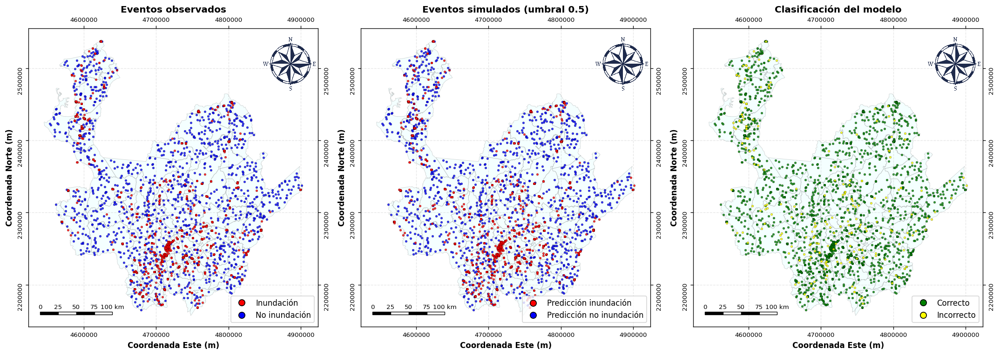

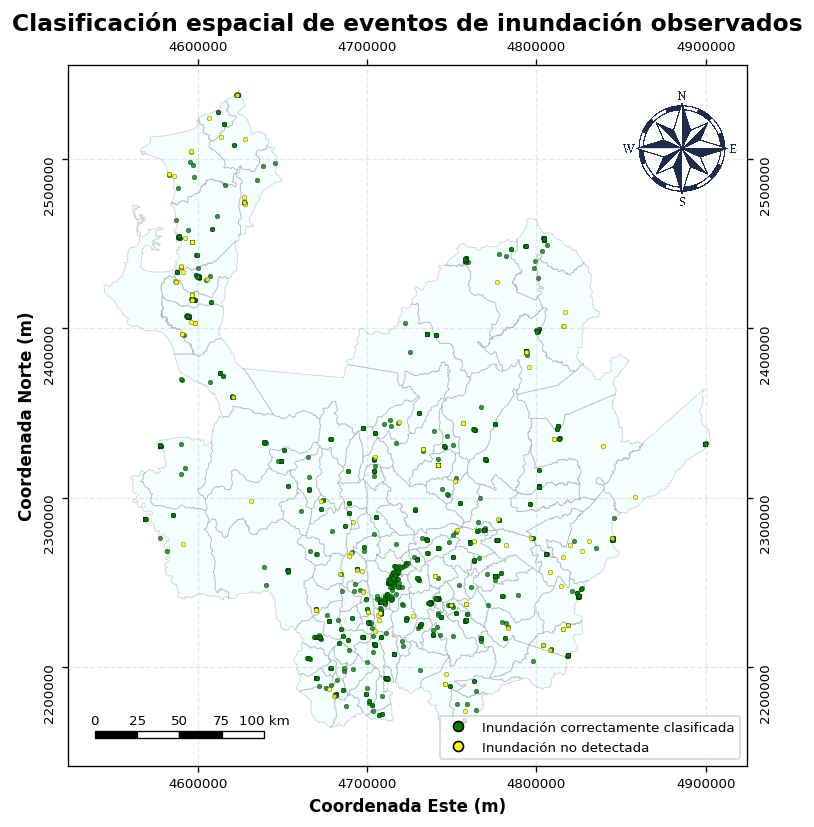

In [5]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.image as mpimg
import numpy as np

from matplotlib.lines import Line2D
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.patches import Rectangle


municipios = gpd.read_file(
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Data\Poligonos\Poligonos\Municipios_Antioquia.shp"
).to_crs(9377)

gdf_map = gdf.to_crs(9377)

gdf_map["Inund"] = gdf_map["Inund"].astype(int)

X_map = gdf_map[var].replace(
    [-9999, np.inf, -np.inf],
    np.nan
)

mask = X_map.notnull().all(axis=1)

gdf_map["Prob_GP"] = np.nan

gdf_map.loc[mask, "Prob_GP"] = modelo_gp.predict_proba(
    scaler.transform(X_map.loc[mask])
)[:,1]

gdf_map["Clase_GP"] = (
    gdf_map["Prob_GP"] >= 0.5
).astype(int)

gdf_map["Correcto"] = (
    gdf_map["Inund"].astype(int)
    ==
    gdf_map["Clase_GP"]
)


xmin, ymin, xmax, ymax = municipios.total_bounds
mx = (xmax-xmin)*0.06
my = (ymax-ymin)*0.04


def base_map(ax, titulo):

    municipios.plot(
        ax=ax,
        facecolor="lightcyan",
        edgecolor="gray",
        linewidth=0.5,
        alpha=0.35
    )

    ax.set_xlim(xmin-mx, xmax+mx)
    ax.set_ylim(ymin-my, ymax+my)

    from matplotlib.ticker import MultipleLocator

    ax.xaxis.set_major_locator(
        MultipleLocator(100000)
    )

    ax.yaxis.set_major_locator(
        MultipleLocator(100000)
    )

    ax.set_xlabel(
        "Coordenada Este (m)",
        fontweight="bold"
    )

    ax.set_ylabel(
        "Coordenada Norte (m)",
        fontweight="bold"
    )

    ax.xaxis.set_major_formatter(
        ticker.StrMethodFormatter("{x:.0f}")
    )

    ax.yaxis.set_major_formatter(
        ticker.StrMethodFormatter("{x:.0f}")
    )

    ax.tick_params(
        top=True,
        bottom=True,
        left=True,
        right=True,
        labeltop=True,
        labelbottom=True,
        labelleft=True,
        labelright=True,
        labelsize=8
    )

    for t in ax.get_yticklabels():
        t.set_rotation(90)

    ax.grid(
        linestyle="--",
        alpha=0.3
    )

    ax.set_title(
        titulo,
        fontweight="bold"
    )

    ax.set_aspect("equal")


def escala(ax):

    longitud = 100000
    segmentos = 4

    x0 = ax.get_xlim()[0] + 0.04*np.ptp(ax.get_xlim())
    y0 = ax.get_ylim()[0] + 0.04*np.ptp(ax.get_ylim())

    alto = 0.01*np.ptp(ax.get_ylim())
    tramo = longitud / segmentos

    for i in range(segmentos):

        ax.add_patch(
            Rectangle(
                (x0+i*tramo,y0),
                tramo,
                alto,
                facecolor="black" if i%2==0 else "white",
                edgecolor="black",
                linewidth=0.8,
                zorder=10
            )
        )

        ax.text(
            x0+i*tramo,
            y0+alto*1.5,
            f"{int(i*tramo/1000)}",
            ha="center",
            va="bottom",
            fontsize=8,
            zorder=10
        )

    ax.text(
        x0+longitud,
        y0+alto*1.5,
        f"{int(longitud/1000)} km",
        ha="center",
        va="bottom",
        fontsize=8,
        zorder=10
    )


fig, axes = plt.subplots(
    1,
    3,
    figsize=(18,7),
    dpi=120
)


base_map(
    axes[0],
    "Eventos observados"
)

gdf_map[gdf_map["Inund"]==0].plot(
    ax=axes[0],
    color="blue",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)

gdf_map[gdf_map["Inund"]==1].plot(
    ax=axes[0],
    color="red",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)


base_map(
    axes[1],
    "Eventos simulados (umbral 0.5)"
)

gdf_map[gdf_map["Clase_GP"]==0].plot(
    ax=axes[1],
    color="blue",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)

gdf_map[gdf_map["Clase_GP"]==1].plot(
    ax=axes[1],
    color="red",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)


base_map(
    axes[2],
    "Clasificación del modelo"
)

gdf_map[gdf_map["Correcto"]].plot(
    ax=axes[2],
    color="green",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)

gdf_map[~gdf_map["Correcto"]].plot(
    ax=axes[2],
    color="yellow",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)


flecha = mpimg.imread(
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Mapas\Flecha_norte.png"
)

for ax in axes:

    ax.add_artist(
        AnnotationBbox(
            OffsetImage(
                flecha,
                zoom=0.02
            ),
            (0.90,0.88),
            xycoords="axes fraction",
            frameon=False
        )
    )

    escala(ax)


axes[0].legend(
    handles=[
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="red",
            markeredgecolor="black",
            markersize=8,
            label="Inundación"
        ),
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="blue",
            markeredgecolor="black",
            markersize=8,
            label="No inundación"
        )
    ],
    loc="lower right"
)

axes[1].legend(
    handles=[
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="red",
            markeredgecolor="black",
            markersize=8,
            label="Predicción inundación"
        ),
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="blue",
            markeredgecolor="black",
            markersize=8,
            label="Predicción no inundación"
        )
    ],
    loc="lower right"
)

axes[2].legend(
    handles=[
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="green",
            markeredgecolor="black",
            markersize=8,
            label="Correcto"
        ),
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="yellow",
            markeredgecolor="black",
            markersize=8,
            label="Incorrecto"
        )
    ],
    loc="lower right"
)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(
    figsize=(7,7),
    dpi=120
)

municipios.plot(
    ax=ax,
    facecolor="lightcyan",
    edgecolor="gray",
    linewidth=0.5,
    alpha=0.35
)

eventos = gdf_map[
    gdf_map["Inund"] == 1
]

eventos[eventos["Clase_GP"] == 1].plot(
    ax=ax,
    color="green",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)

eventos[eventos["Clase_GP"] == 0].plot(
    ax=ax,
    color="yellow",
    edgecolor="black",
    linewidth=0.2,
    markersize=8,
    alpha=0.8
)

ax.set_xlim(xmin-mx, xmax+mx)
ax.set_ylim(ymin-my, ymax+my)

ax.xaxis.set_major_locator(
    ticker.MultipleLocator(100000)
)

ax.yaxis.set_major_locator(
    ticker.MultipleLocator(100000)
)

ax.xaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.yaxis.set_major_formatter(
    ticker.StrMethodFormatter("{x:.0f}")
)

ax.set_xlabel(
    "Coordenada Este (m)",
    fontweight="bold"
)

ax.set_ylabel(
    "Coordenada Norte (m)",
    fontweight="bold"
)

ax.tick_params(
    top=True,
    bottom=True,
    left=True,
    right=True,
    labeltop=True,
    labelbottom=True,
    labelleft=True,
    labelright=True,
    labelsize=8
)

for t in ax.get_yticklabels():
    t.set_rotation(90)

ax.grid(
    linestyle="--",
    alpha=0.3
)

ax.add_artist(
    AnnotationBbox(
        OffsetImage(
            flecha,
            zoom=0.02
        ),
        (0.90,0.88),
        xycoords="axes fraction",
        frameon=False
    )
)

escala(ax)

ax.legend(
    handles=[
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="green",
            markeredgecolor="black",
            markersize=6,
            label="Inundación correctamente clasificada"
        ),
        Line2D(
            [0],[0],
            marker="o",
            color="w",
            markerfacecolor="yellow",
            markeredgecolor="black",
            markersize=6,
            label="Inundación no detectada"
        )
    ],
    loc="lower right",
    fontsize = 8
)

ax.set_title(
    "Clasificación espacial de eventos de inundación observados",
    fontsize=14,
    fontweight="bold"
)

ax.set_aspect("equal")

plt.tight_layout()
plt.show()

Modelo ajustado:
{'model': 'spherical', 'estimator': 'matheron', 'dist_func': 'euclidean', 'normalized_effective_range': np.float64(1016687788.9404213), 'normalized_sill': np.float64(0.004819140590812025), 'normalized_nugget': 0, 'effective_range': np.float64(10166.900163448707), 'sill': np.float64(0.06748921705119823), 'nugget': 0, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'even', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': False, 'maxlag': 100000, 'n_lags': 25, 'verbose': False}, 'kwargs': {}}


<Figure size 1320x1320 with 0 Axes>

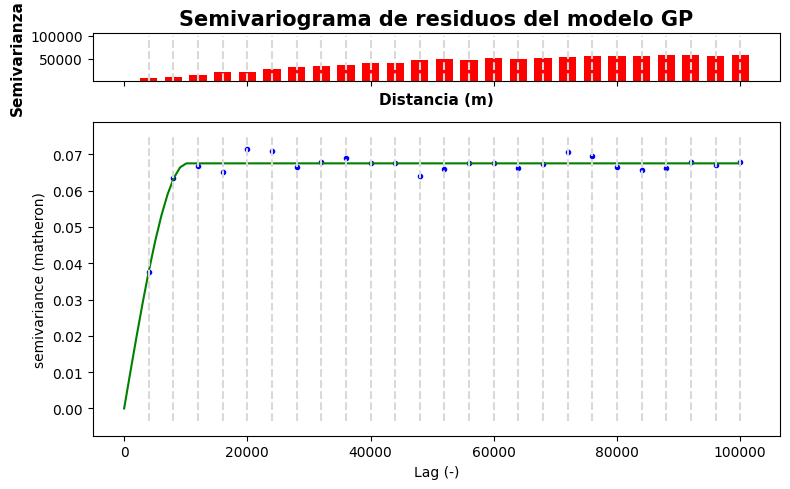

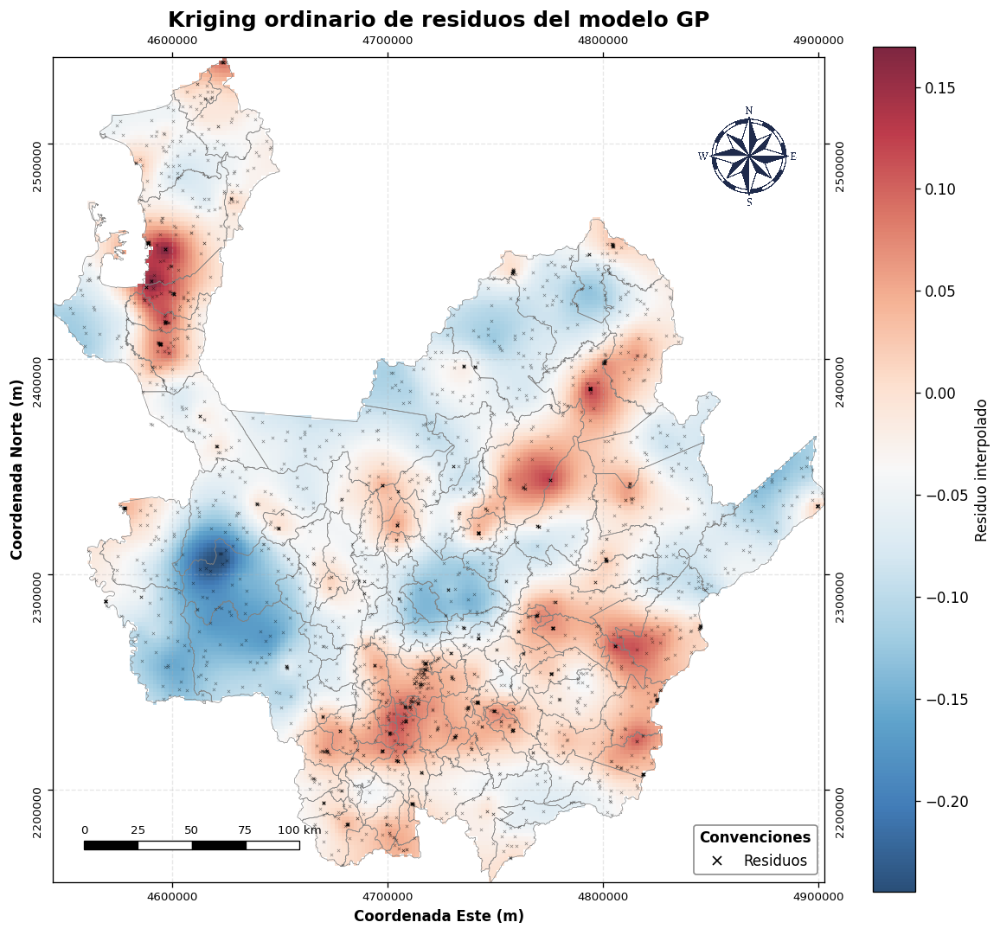

In [6]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.patches import Rectangle
from rasterio.features import geometry_mask
from rasterio.transform import from_bounds
from shapely.geometry import mapping
from skgstat import Variogram
from pykrige.ok import OrdinaryKriging

gdf_krig = gdf_map.copy()
gdf_krig["Residuo"] = gdf_krig["Inund"] - gdf_krig["Prob_GP"]
gdf_krig = gdf_krig.dropna(subset=["Residuo"])

coords = np.column_stack([gdf_krig.geometry.x, gdf_krig.geometry.y])
residuos = gdf_krig["Residuo"].values

V = Variogram(
    coords,
    residuos,
    model="spherical",
    normalize=False,
    n_lags=25,
    maxlag=100000
)

print("Modelo ajustado:")
print(V.describe())

plt.figure(figsize=(11,11), dpi=120)
V.plot()
plt.title("Semivariograma de residuos del modelo GP", fontsize=15, fontweight="bold")
plt.xlabel("Distancia (m)", fontsize=11, fontweight="bold")
plt.ylabel("Semivarianza", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.show()

xmin, ymin, xmax, ymax = municipios.total_bounds
nx, ny = 200, 200
grid_x = np.linspace(xmin, xmax, nx)
grid_y = np.linspace(ymin, ymax, ny)

OK = OrdinaryKriging(
    coords[:, 0],
    coords[:, 1],
    residuos,
    variogram_model="spherical",
    verbose=False,
    enable_plotting=False
)

z, ss = OK.execute("grid", grid_x, grid_y)

geometria_antioquia = municipios.geometry.union_all()
transform = from_bounds(xmin, ymin, xmax, ymax, nx, ny)

mascara = geometry_mask(
    [mapping(geometria_antioquia)],
    out_shape=(ny, nx),
    transform=transform,
    invert=True
)

z_antioquia = np.ma.masked_where(~np.flipud(mascara), z)

def barra_escala(ax, longitud=100000, segmentos=4):
    x0 = ax.get_xlim()[0] + 0.04 * np.ptp(ax.get_xlim())
    y0 = ax.get_ylim()[0] + 0.04 * np.ptp(ax.get_ylim())
    alto = 0.01 * np.ptp(ax.get_ylim())
    tramo = longitud / segmentos

    for i in range(segmentos):
        ax.add_patch(
            Rectangle(
                (x0 + i * tramo, y0),
                tramo,
                alto,
                facecolor="black" if i % 2 == 0 else "white",
                edgecolor="black",
                linewidth=0.8,
                zorder=10
            )
        )
        ax.text(
            x0 + i * tramo,
            y0 + alto * 1.5,
            f"{int(i * tramo / 1000)}",
            ha="center",
            va="bottom",
            fontsize=8,
            zorder=10
        )

    ax.text(
        x0 + longitud,
        y0 + alto * 1.5,
        f"{int(longitud / 1000)} km",
        ha="center",
        va="bottom",
        fontsize=8,
        zorder=10
    )

fig, ax = plt.subplots(figsize=(10, 9), dpi=120)

im = ax.imshow(
    z_antioquia,
    extent=[xmin, xmax, ymin, ymax],
    origin="lower",
    cmap="RdBu_r",
    alpha=0.85
)

municipios.plot(
    ax=ax,
    facecolor="none",
    edgecolor="gray",
    linewidth=0.4
)

gdf_krig.plot(
    ax=ax,
    color="black",
    marker="x",
    markersize=4,
    linewidth=0.4,
    alpha=0.45
)

plt.colorbar(im, ax=ax, label="Residuo interpolado")

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(100000))
ax.yaxis.set_major_locator(ticker.MultipleLocator(100000))
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:.0f}"))
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter("{x:.0f}"))

ax.tick_params(
    top=True,
    bottom=True,
    left=True,
    right=True,
    labeltop=True,
    labelbottom=True,
    labelleft=True,
    labelright=True,
    labelsize=8
)

for t in ax.get_yticklabels():
    t.set_rotation(90)

ax.set_xlabel("Coordenada Este (m)", fontweight="bold")
ax.set_ylabel("Coordenada Norte (m)", fontweight="bold")
ax.set_title("Kriging ordinario de residuos del modelo GP", fontsize=15, fontweight="bold")
ax.grid(linestyle="--", alpha=0.3)
ax.set_aspect("equal")

flecha = mpimg.imread(
    r"C:\Analisis_Geoespacial\2026_I_Analisis_Geoespacial\Mapas\Flecha_norte.png"
)

ax.add_artist(
    AnnotationBbox(
        OffsetImage(flecha, zoom=0.02),
        (0.90, 0.88),
        xycoords="axes fraction",
        frameon=False,
        zorder=10
    )
)

ax.legend(
    handles=[
        Line2D(
            [0], [0],
            marker="x",
            linestyle="none",
            color="black",
            markersize=6,
            label="Residuos"
        )
    ],
    title="Convenciones",
    loc="lower right",
    frameon=True,
    framealpha=0.9,
    facecolor="white",
    edgecolor="gray"
)

ax.get_legend().get_title().set_fontweight("bold")

barra_escala(ax)

plt.tight_layout()
plt.show()

CRS: EPSG:4326
Extensión: BoundingBox(left=-77.127463832, bottom=5.41899712, right=-73.880593069, top=8.873917703)
Tamaño: 12048 x 12820
Tipo de dato: float32
NoData: nan
Píxeles válidos: 871959
Mínimo: 0.003420423
Máximo: 0.9945337
Promedio: 0.5419125


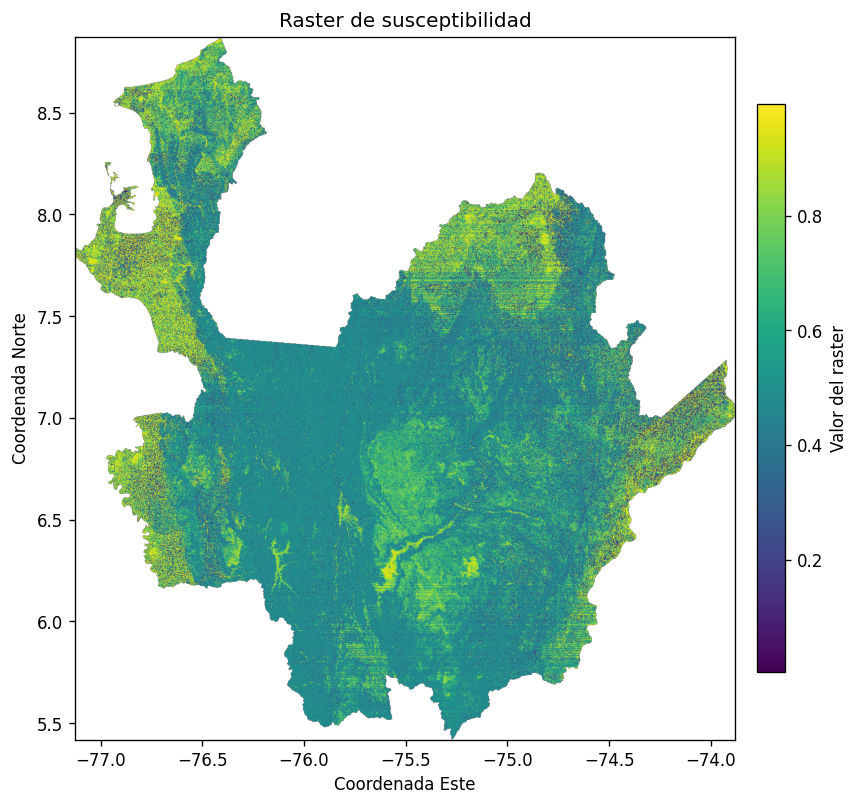

In [30]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.enums import Resampling

ruta_raster = r"C:\Analisis_Geoespacial\Archivos pesados\DEM\Antioquia\Susceptibilidad_V1.tif"

with rasterio.open(ruta_raster) as src:
    print("CRS:", src.crs)
    print("Extensión:", src.bounds)
    print("Tamaño:", src.width, "x", src.height)
    print("Tipo de dato:", src.dtypes[0])
    print("NoData:", src.nodata)

    factor = max(1, int(np.ceil(max(src.width, src.height) / 1500)))

    alto = max(1, src.height // factor)
    ancho = max(1, src.width // factor)

    raster = src.read(
        1,
        out_shape=(alto, ancho),
        resampling=Resampling.nearest,
        masked=True
    )

    bounds = src.bounds

valores = raster.compressed()

print("Píxeles válidos:", valores.size)

if valores.size > 0:
    print("Mínimo:", valores.min())
    print("Máximo:", valores.max())
    print("Promedio:", valores.mean())

fig, ax = plt.subplots(figsize=(8, 9), dpi=120)

imagen = ax.imshow(
    raster,
    extent=[
        bounds.left,
        bounds.right,
        bounds.bottom,
        bounds.top
    ],
    origin="upper",
    cmap="viridis"
)

ax.set_title("Raster de susceptibilidad")
ax.set_xlabel("Coordenada Este")
ax.set_ylabel("Coordenada Norte")
ax.set_aspect("equal")

cbar = fig.colorbar(imagen, ax=ax, fraction=0.04, pad=0.03)
cbar.set_label("Valor del raster")

plt.subplots_adjust(
    left=0.14,
    right=0.88,
    bottom=0.10,
    top=0.92
)

plt.show()